In [1]:
import os
import functools
import json
import pandas as pd
import numpy as np
from scipy import special
from scipy.cluster import hierarchy
from sklearn.preprocessing import normalize
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics.pairwise import euclidean_distances, cosine_distances, cosine_similarity
from sklearn.cluster import KMeans, AgglomerativeClustering
import umap
import matplotlib.pyplot as plt
from matplotlib import animation
from mpl_toolkits import mplot3d
import seaborn as sns
from cartopy.io.shapereader import Reader
import pyperclip
from IPython.display import display_markdown

import sinetym.datasets
import sinetym.auxiliary
import sinetym.phonology
import sinetym.plot

In [2]:
plt.rcParams['font.family'] = ['Dejavu Sans', 'Microsoft Yahei']
# plt.rcParams['font.family'] = ['Dejavu Sans', 'Noto Sans CJK JP']

sinetym_root = os.path.expanduser(os.path.join('~', 'git', 'sinetym'))
config_file = os.path.join(sinetym_root, 'scripts', 'config.json')
# config_file = os.path.expanduser(os.path.join('~', 'data', 'models', 'config.json'))
emb_dir = os.path.join(sinetym_root, 'data', 'embeddings', 'linear_encoder_100_100_100_1_1')
shp_prefix = os.path.expanduser(os.path.join('~', 'git', 'ChinaAdminDivisonSHP'))

np.random.seed(5981)

In [3]:
config = json.load(open(config_file))
dialect_columns, input_columns, output_columns = [config['columns'][n] for n in ('dialect', 'input', 'output')]

for e in os.scandir(emb_dir):
    name, ext = os.path.splitext(e.name)
    if ext == '.csv':
        d = pd.read_csv(e.path, header=None, index_col=0, encoding='utf-8')
        d.set_index(d.index.fillna('').rename(None), inplace=True)
        globals()[name] = d

weight = np.reshape(
    np.loadtxt(os.path.join(emb_dir, 'weight.txt')),
    (globals()[dialect_columns[0]].shape[-1], globals()[input_columns[0]].shape[-1], -1)
)

dialect_embs = []
for c in dialect_columns:
    e = globals()[c]
    e.insert(e.shape[1], e.shape[1] + 1, 1)
    dialect_embs.append(e)

input_embs = []
for c in input_columns:
    e = globals()[c]
    e.insert(e.shape[1], e.shape[1] + 1, 1)
    input_embs.append(e)

output_embs = []
for c in output_columns:
    e = globals()[c]
    try:
        e.insert(e.shape[1], e.shape[1] + 1, globals()[f'{c}_bias'].iloc[:, 0])
    except KeyError:
        e.insert(e.shape[1], e.shape[1] + 1, 0)
    output_embs.append(e)

weight = np.pad(weight, ((0, 0), (0, 1), (0, 1)), constant_values=1)
weight = np.append(weight, np.eye(weight.shape[1], weight.shape[2])[None, ...], axis=0)

initial_emb, final_emb, tone_emb = initial, final, tone

In [4]:
dialect_infos = []
for d in config['datasets']:
    d = getattr(sinetym.datasets, d if isinstance(d, str) else d['name'])
    info = d.metadata['dialect_info'][[
        'group',
        'subgroup',
        'cluster',
        'subcluster',
        'spot',
        'latitude',
        'longitude'
    ]].copy()
    info.insert(0, 'dataset', d.name)
    info['did'] = info.index + 'mb01' if d is sinetym.datasets.zhongguoyuyan else info.index
    dialect_infos.append(info)

dialect = pd.concat(dialect_infos, axis=0)

dialect['idx'] = np.arange(dialect.shape[0])
dialect.loc[[
    'Z03E88',   # 北京
    'Z28E77',   # 咸阳
    'Z10G68',   # 南京
    'Z16300',   # 成都
    'Z10G69',   # 南通
    'Z12A91',   # 运城
    'Z12177',   # 太原
    'Z10G71',   # 苏州
    'Z08210',   # 温州
    'Z21J03',   # 黄山
    'Z26516',   # 长沙
    'Z26509',   # 双峰
    'Z18358',   # 南昌
    'Z02A14',   # 三明
    'Z15233',   # 梅州
    'Z15229',   # 惠州
    'Z15231',   # 广州
    'Z15235',   # 江门
    'Z01G23',   # 南宁
    'Z01G29',   # 桂林
    'Z02A05',   # 福州
    'Z02G49',   # 厦门
    'Z23C55',   # 海口
    'Z02193',   # 建瓯
    'Z35H08',   # 韶关
    'Z26D48',   # 永州
    'Z26J61',   # 怀化
], 'representative'] = True
dialect['representative'].fillna(False, inplace=True)

dialect.loc[dialect['representative'], 'sample'] = True
dialect.loc[dialect[~dialect['representative'] & (dialect['group'] != '')].groupby('group').sample(frac=0.06).index, 'sample'] = True
dialect['sample'].fillna(False, inplace=True)


In [5]:
char = sinetym.datasets.zhongguoyuyan.metadata['char_info'].copy()
char['idx'] = np.arange(char.shape[0])
char['cid'] = char.index
char.loc[char[char['character'].notna() & (char['character'] != '')].sample(100).index, 'sample'] = True
char['sample'].fillna(False, inplace=True)

char[['initial_voicing', 'tone']] = sinetym.datasets.zhongguoyuyan.filter(id='08210mb01') \
    .groupby('cid').agg({
        'initial': lambda x: x.map(sinetym.phonology.get_voicing).fillna('').mode().iloc[0],
        'tone': lambda x: x.mode().iloc[0]
    })
char[['initial_manner', 'coda_type']] = sinetym.datasets.zhongguoyuyan.filter(id='15233mb01') \
    .groupby('cid').agg({
        'initial': lambda x: x.map(sinetym.phonology.get_manner).fillna('').mode().iloc[0],
        'final': lambda x: x.map(sinetym.phonology.get_coda_type).fillna('').mode().iloc[0]
    })

In [6]:
china = tuple(Reader(os.path.join(shp_prefix, '1. Country', 'country.shp')).geometries())
province = tuple(Reader(os.path.join(shp_prefix, '2. Province', 'province.shp')).geometries())

In [7]:
def get_emb(embs, inputs):
    inputs = np.asarray(inputs)
    emb = np.empty((len(embs), inputs.shape[0], embs[0].shape[1]), dtype=np.float32)

    for i in range(emb.shape[0]):
        emb[i] = embs[i].reindex(inputs[:, i])
        emb[i, np.any(np.isnan(emb[i]), axis=1)] = embs[i].loc['']

    return np.mean(emb, axis=0)

def get_output(output_embs, emb):
    outputs = []

    for i, e in enumerate(output_embs):
        logits = emb @ e.values.T
        outputs.append(e.index[np.argmax(logits[:, :-1], axis=1)])

    return np.stack(outputs, axis=1)

def get_prob(output_embs, emb):
    probs = []
    for i, e in enumerate(output_embs):
        logits = emb @ e.values.T
        probs.append(pd.DataFrame(special.softmax(logits[:, :-1], axis=1), columns=e.index[:-1]))

    return probs

def transform(dialect_emb, input_emb, weight):
    return np.reshape(input_emb[:, None, :] @ np.tensordot(dialect_emb, weight, (-1, 0)), (input_emb.shape[0], -1))

def get_trans(dialect_emb, weight):
    return np.tensordot(dialect_emb, weight, [-1, 0])

def rotate(azimuth, ax=None):
    ax.view_init(azim=azimuth)
    return ax

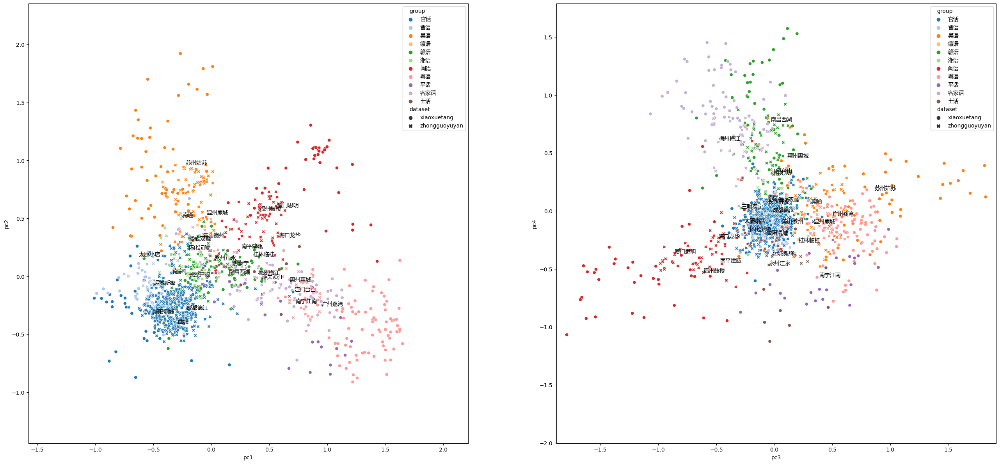

In [8]:
dialect_emb = get_emb(dialect_embs, dialect[dialect_columns])
dialect_pca = PCA(4)
columns = [f'pc{i + 1}' for i in range(dialect_pca.n_components)]
dialect[columns] = dialect_pca.fit_transform(dialect_emb)

scale = (dialect[columns].max() - dialect[columns].min()).max() * 1.05

fig = plt.figure(figsize=(32, 18))

for i in range(2):
    c1 = f'pc{i * 2 + 1}'
    c2 = f'pc{i * 2 + 2}'

    ax = fig.add_subplot(1, 2, i + 1, aspect='equal')
    sns.scatterplot(dialect[dialect['group'] != ''], x=c1, y=c2, hue='group', style='dataset', palette='tab20', ax=ax)
    for _, r in dialect[dialect['representative']].iterrows():
        ax.annotate(r['spot'], xy=r[[c1, c2]])
    ax.set_xlim((dialect[c1].min() + dialect[c1].max() + np.asarray([-1, 1]) * scale) / 2)
    ax.set_ylim((dialect[c1].min() + dialect[c2].max() + np.asarray([-1, 1]) * scale) / 2)

plt.show()
plt.close()

C:\Users\lerna\AppData\Local\Temp\ipykernel_2124\3861168514.py:7: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(df['pc1'], df['pc2'], df['pc3'], cmap='tab20', label=g)


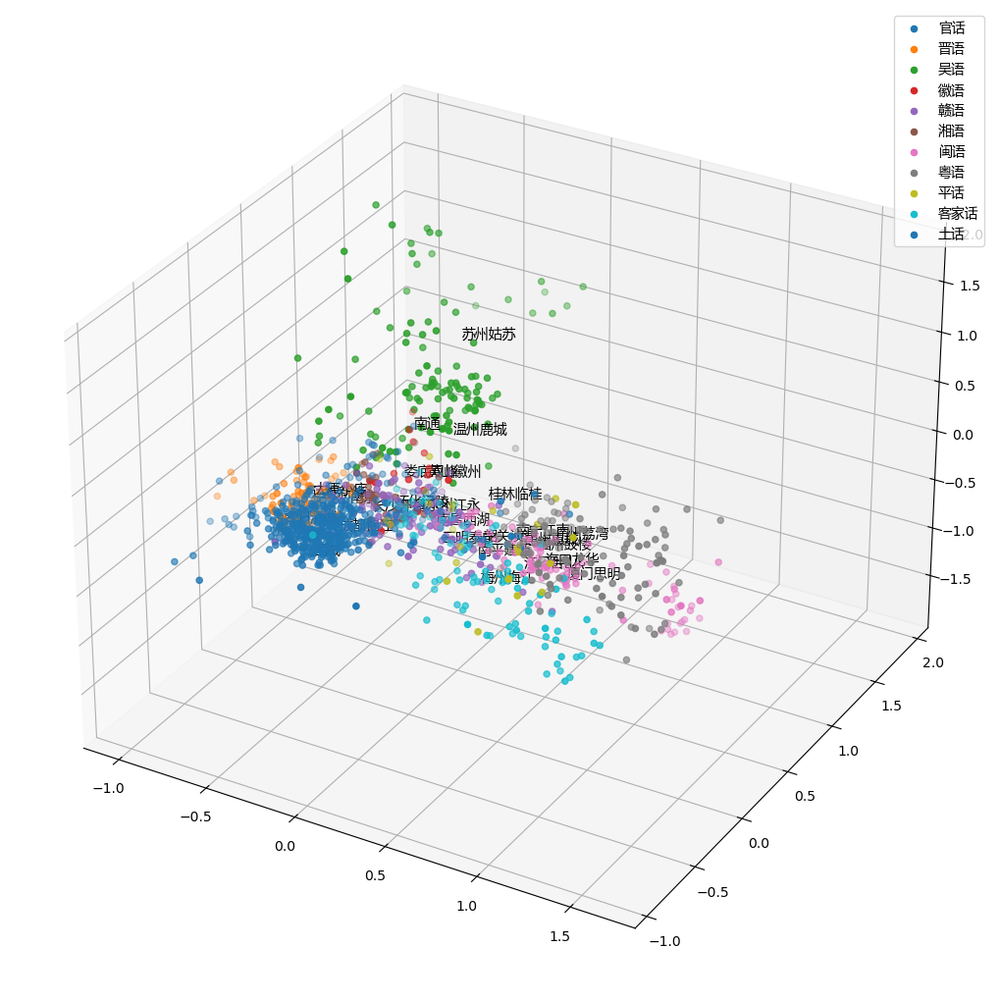

In [9]:
fig = plt.figure(figsize=(10, 10))
ax = mplot3d.Axes3D(fig)
fig.add_axes(ax)

for g in dialect.loc[dialect['group'] != '', 'group'].unique():
    df = dialect[dialect['group'] == g]
    ax.scatter(df['pc1'], df['pc2'], df['pc3'], cmap='tab20', label=g)

for _, r in dialect[dialect['representative']].iterrows():
    ax.text(*r[['pc1', 'pc2', 'pc3']], r['spot'])

ax.legend(loc='upper right')
plt.show()

ani = animation.FuncAnimation(
    fig,
    functools.partial(rotate, ax=ax),
    np.arange(45, 405, 5),
    interval=200,
    repeat_delay=200
)
# ani.save('方言编码PCA降维三维散点图.gif')
plt.close()

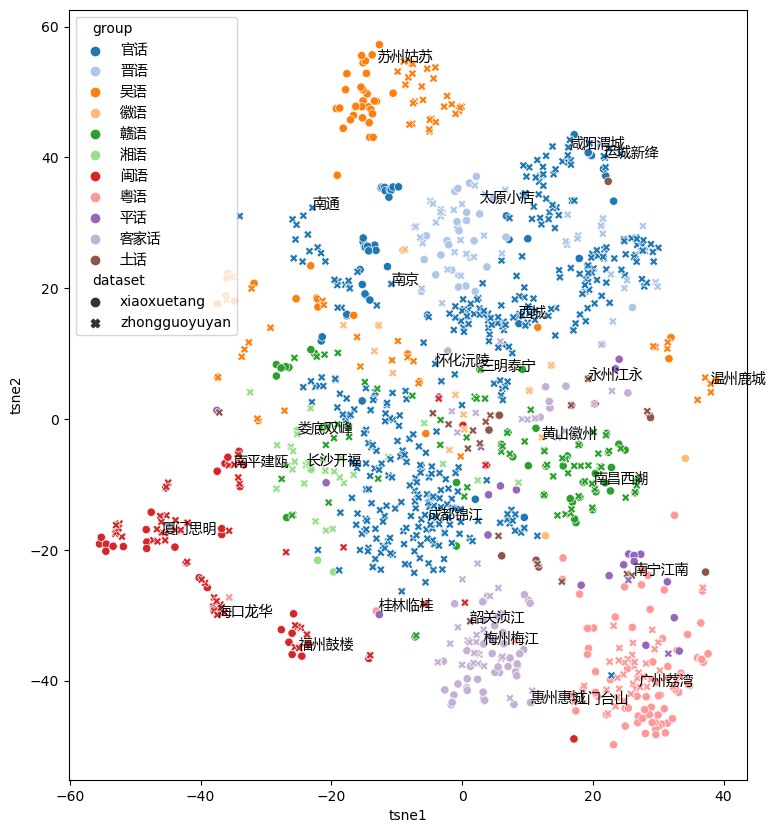

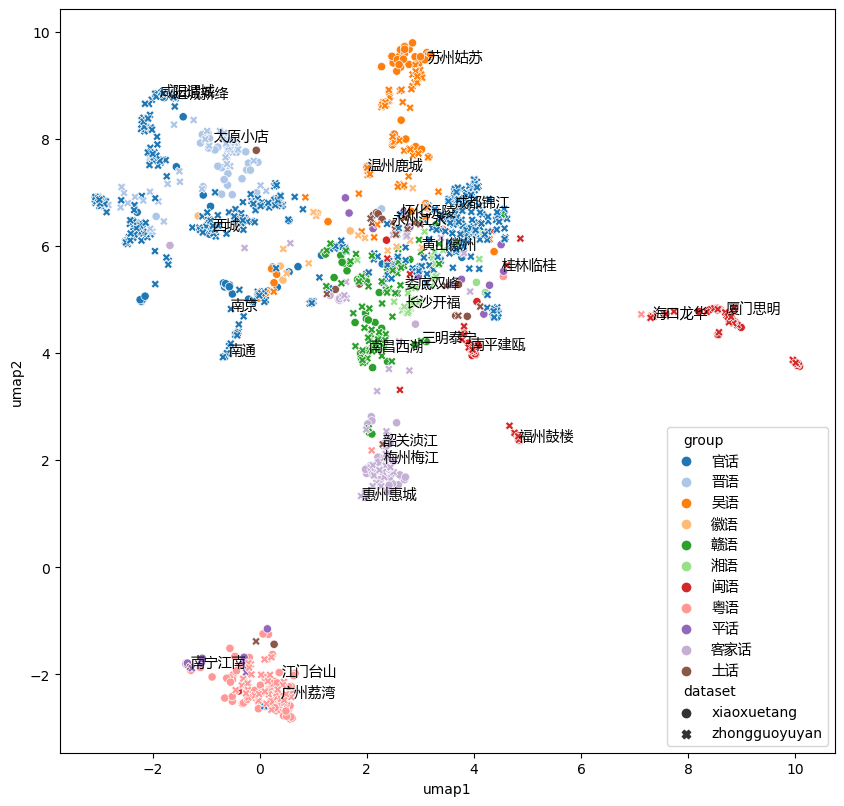

In [10]:
for prefix, transformer in (('tsne', TSNE(2)), ('umap', umap.UMAP(n_components=2))):
    dialect[[f'{prefix}1', f'{prefix}2']] = transformer.fit_transform(dialect_emb)

    plt.figure(figsize=(10, 10))
    ax = plt.axes(aspect='equal')

    sns.scatterplot(data=dialect[dialect['group'] != ''], x=f'{prefix}1', y=f'{prefix}2', hue='group', style='dataset', palette='tab20', ax=ax)
    for _, r in dialect[dialect['representative']].iterrows():
        ax.annotate(r['spot'], xy=r[[f'{prefix}1', f'{prefix}2']])

    plt.show()
    plt.close()

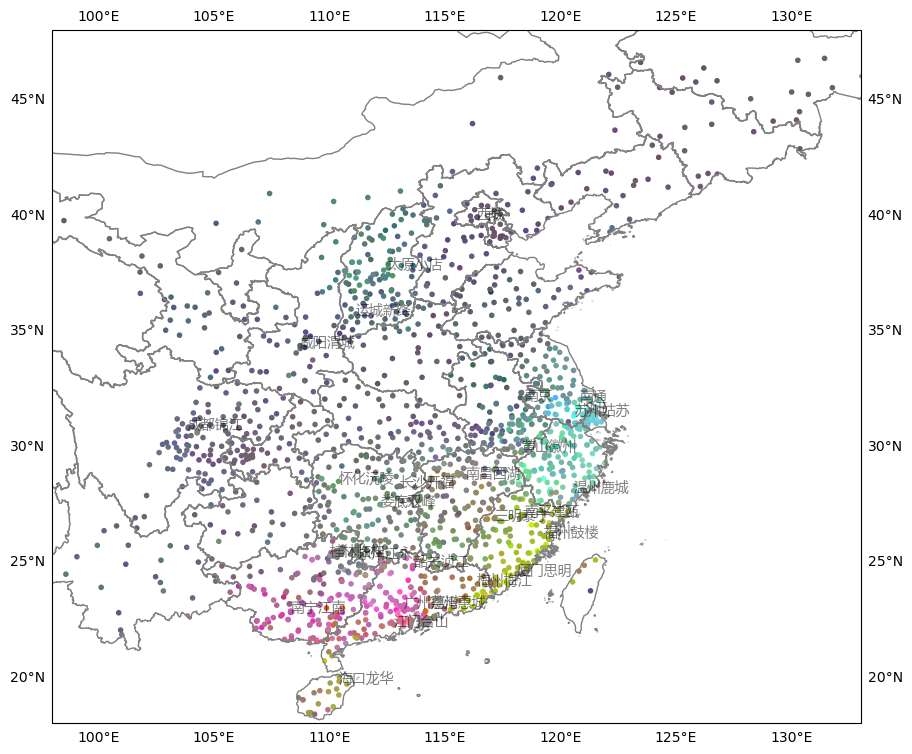

In [11]:
extent=(98, 133, 18, 48)

plt.figure(figsize=(16, 9))
ax, _, _ = sinetym.plot.geography.scatter(
    dialect['latitude'],
    dialect['longitude'],
    sinetym.auxiliary.pc2color(dialect[['pc1', 'pc2', 'pc3']].values),
    extent=extent,
    scale=3,
    clip=china,
    marker='.'
)
ax.add_geometries(province, ax.projection, edgecolor='gray', facecolor='none')

for _, r in dialect[dialect['representative']].iterrows():
    ax.annotate(r['spot'], xy=r[['longitude', 'latitude']], alpha=0.5)

gl = ax.gridlines(draw_labels=True)
gl.xlines = False
gl.ylines = False
plt.show()
plt.close()

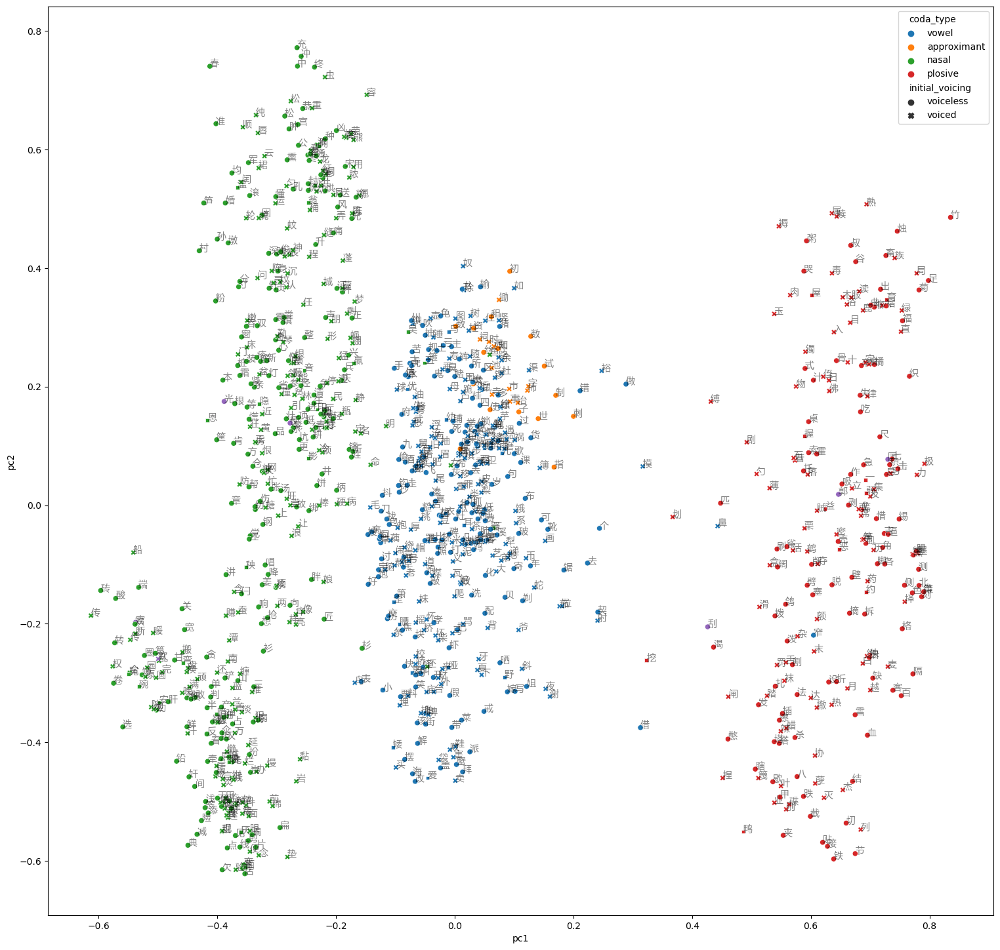

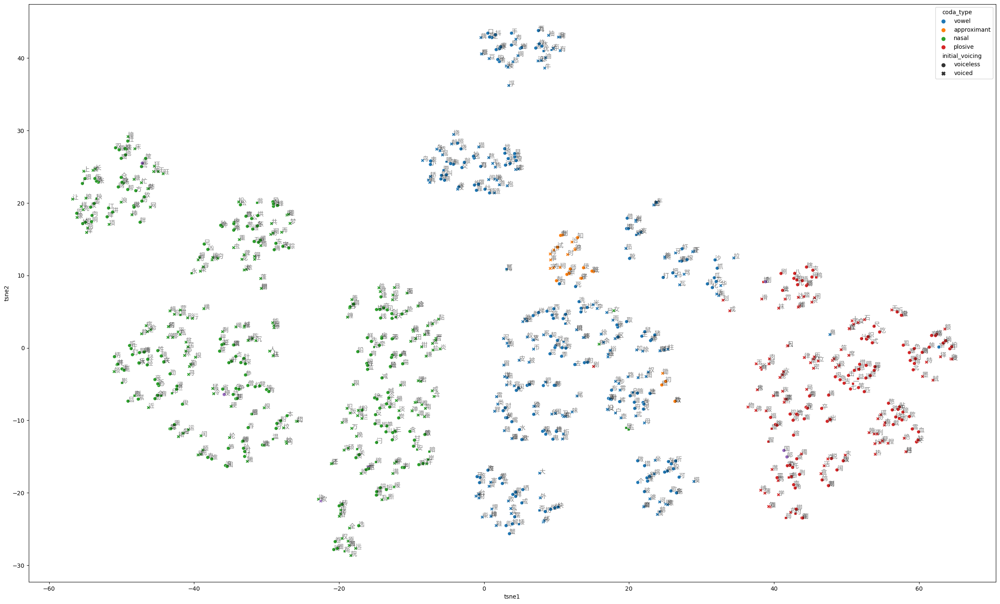

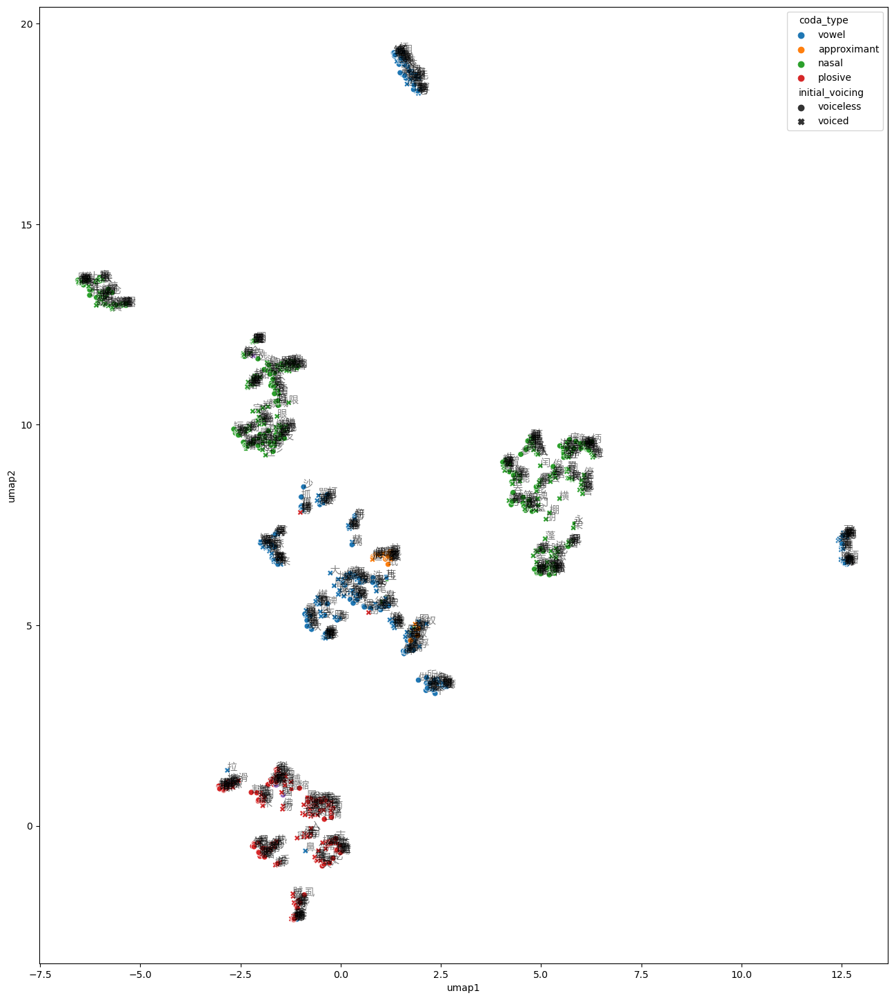

In [12]:
char_emb = get_emb(input_embs, char[input_columns])
char_pca = PCA(4)

for prefix, transformer in (('pc', char_pca), ('tsne', TSNE(2)), ('umap', umap.UMAP(n_components=2))):
    char[[f'{prefix}{i + 1}' for i in range(transformer.n_components)]] = transformer.fit_transform(char_emb)

    plt.figure(figsize=(32, 18))
    ax = plt.axes(aspect='equal')

    sns.scatterplot(char, x=f'{prefix}1', y=f'{prefix}2', hue='coda_type', style='initial_voicing', palette='tab10', ax=ax)
    for _, r in char[char['character'].notna()].iterrows():
        ax.annotate(r['character'], xy=r[[f'{prefix}1', f'{prefix}2']], alpha=0.5)

    plt.show()
    plt.close()

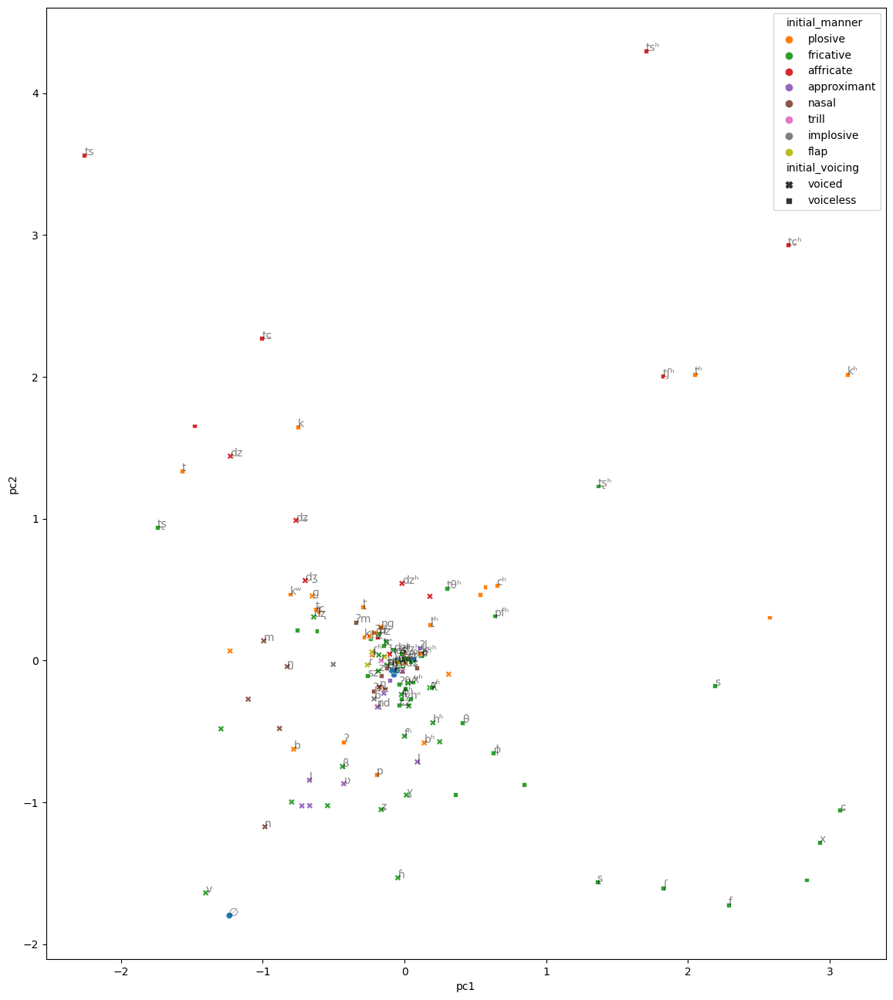

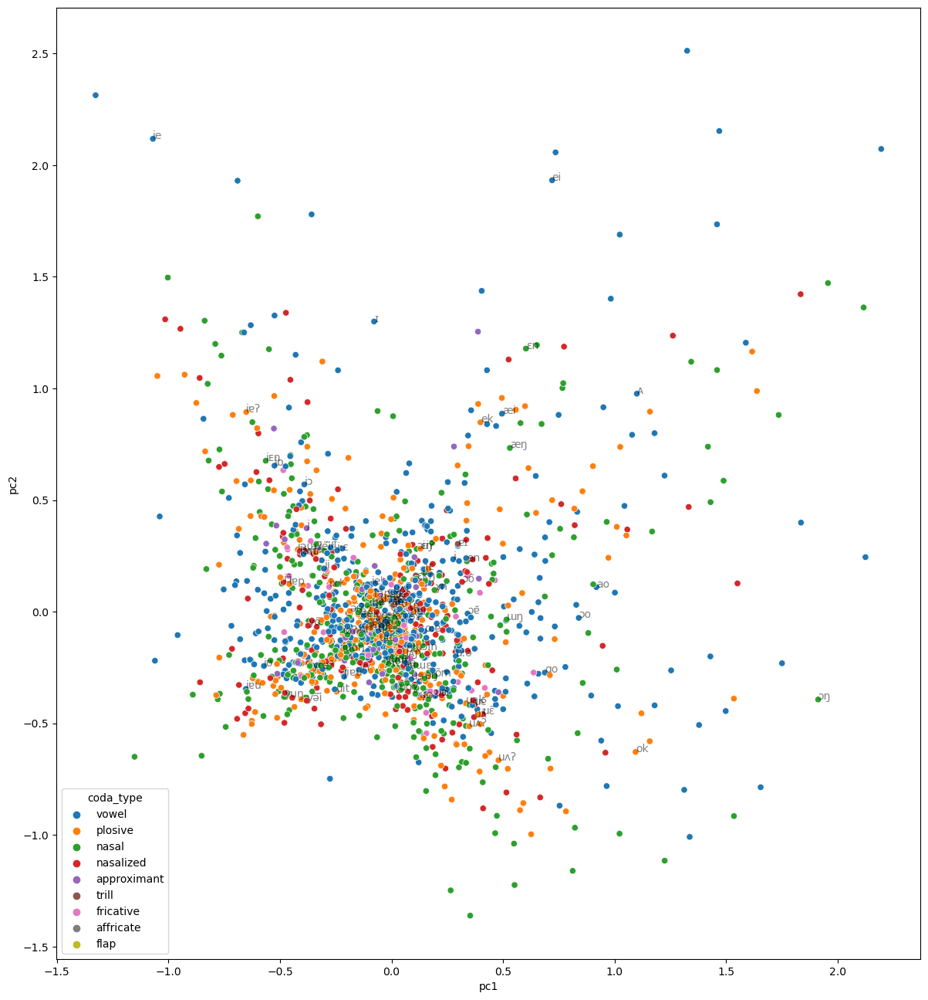

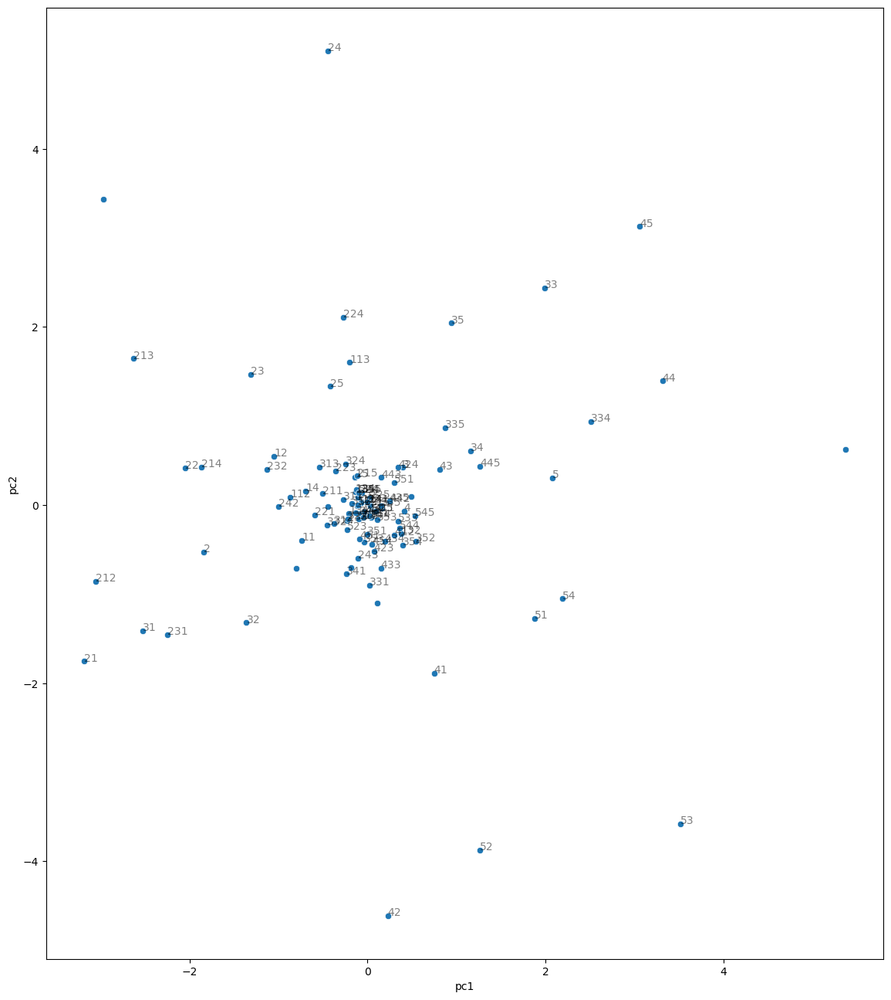

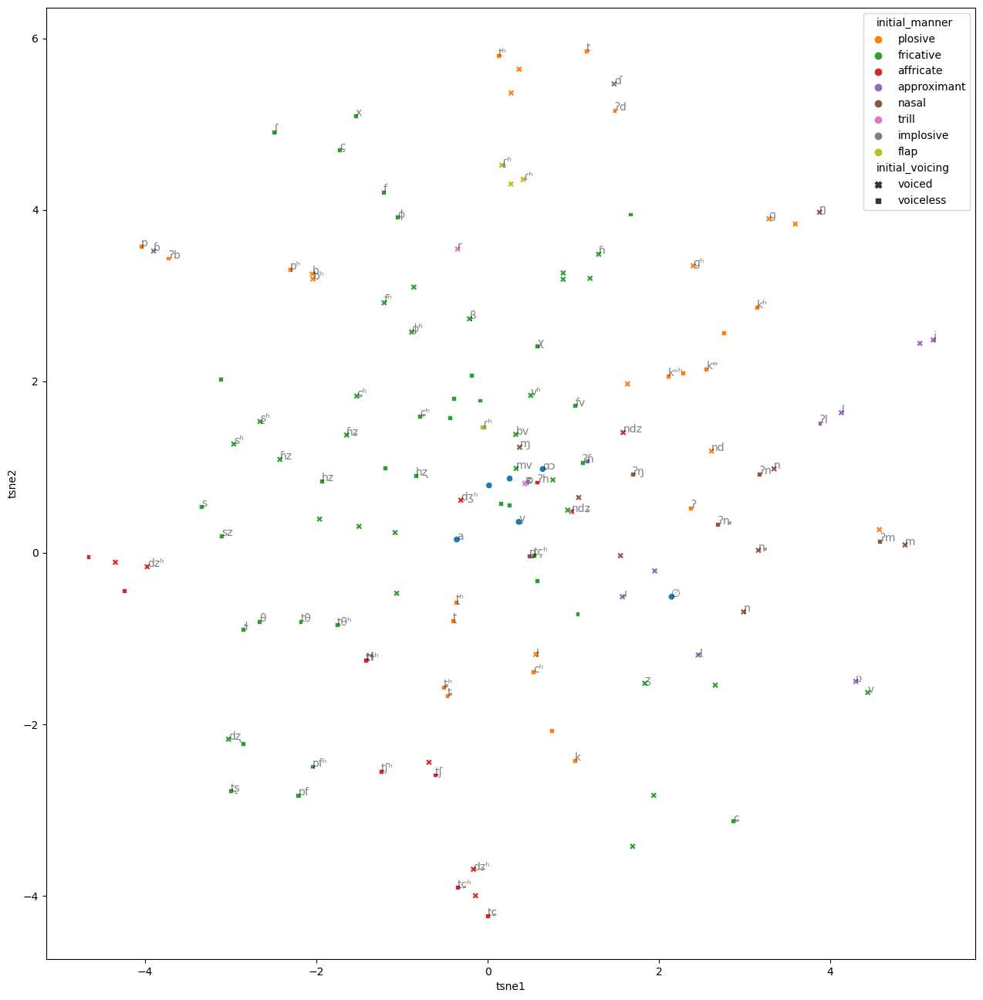

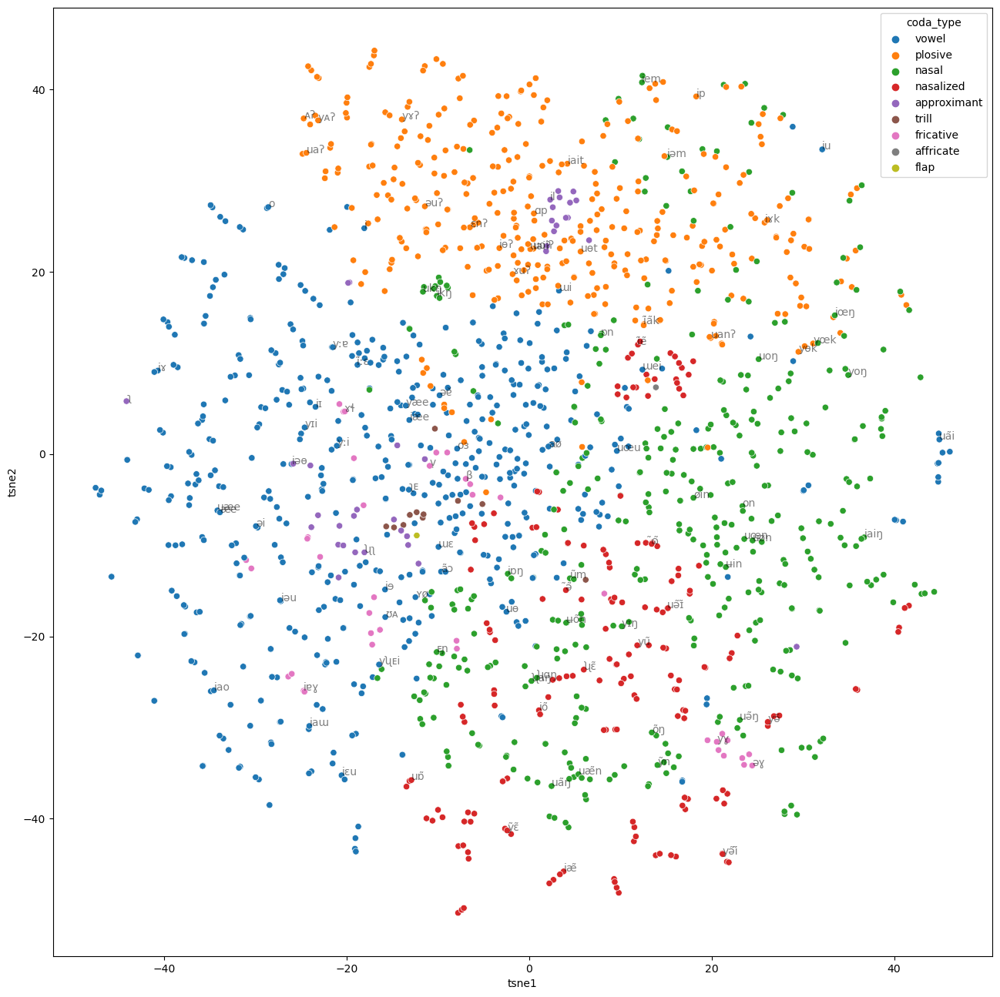

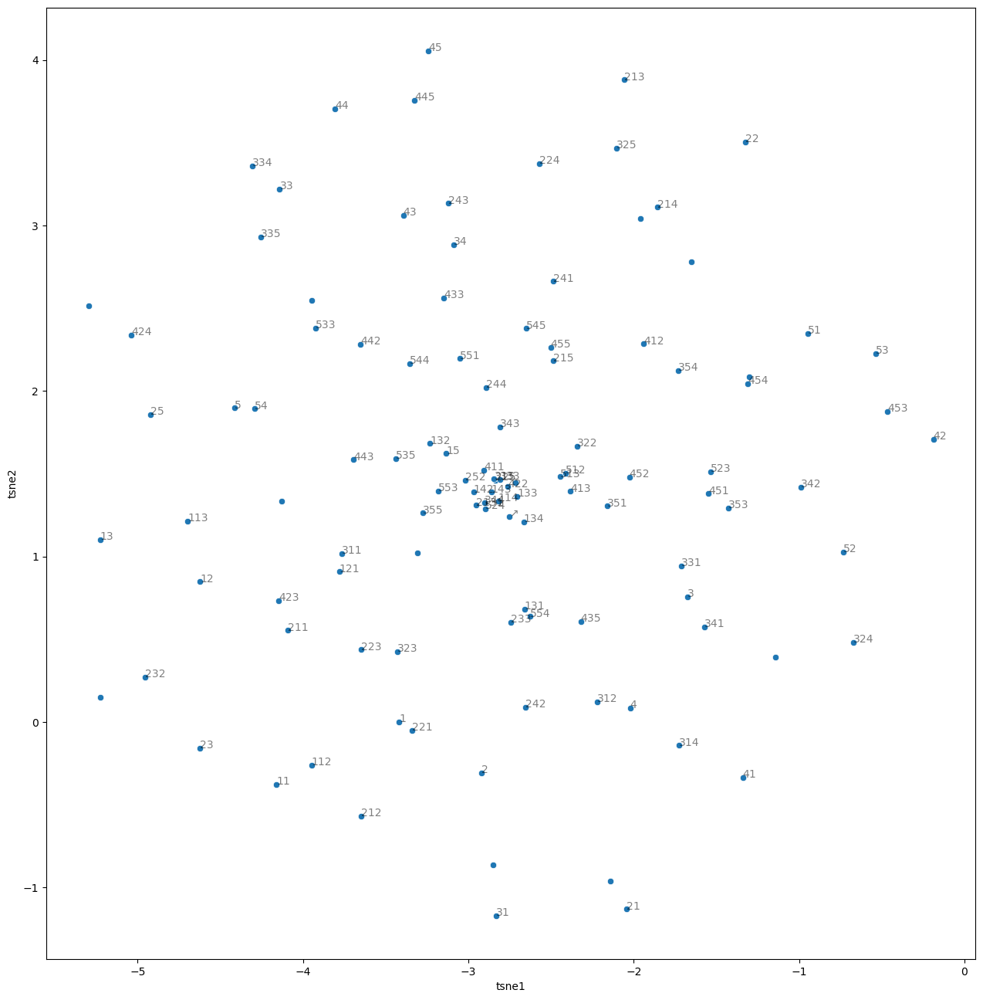

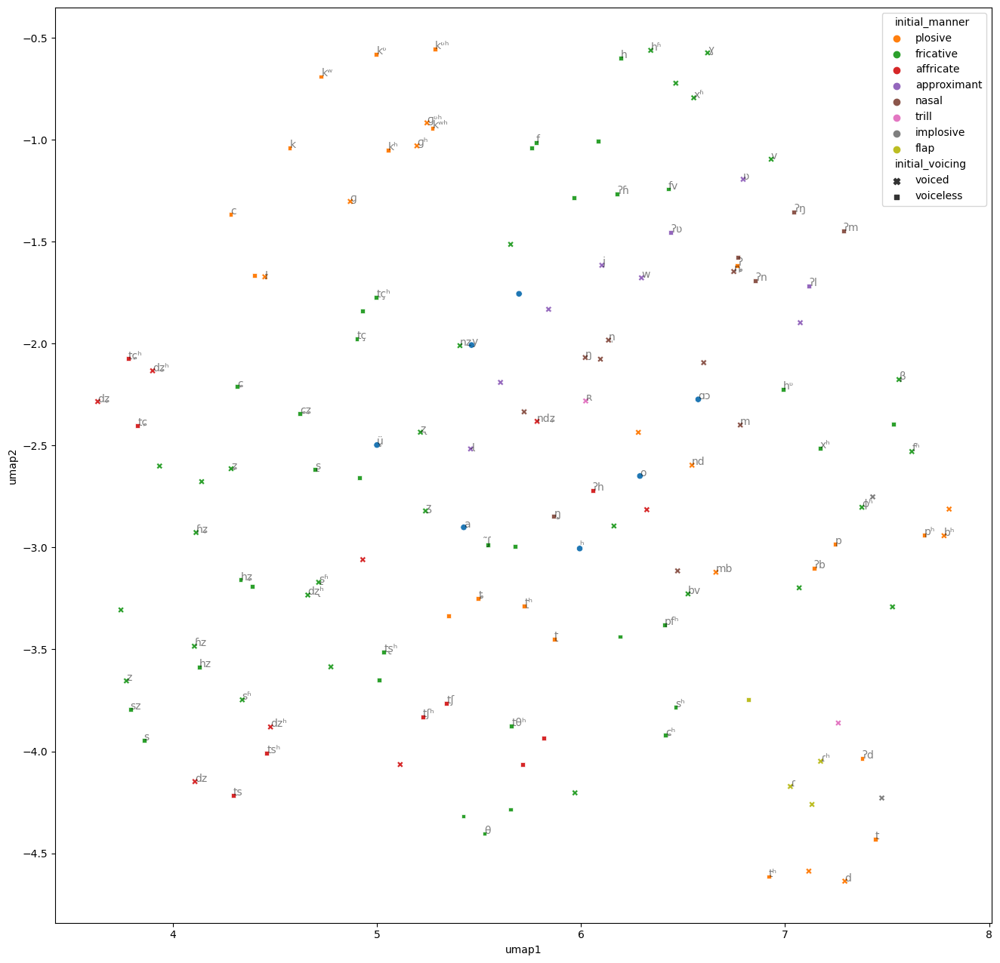

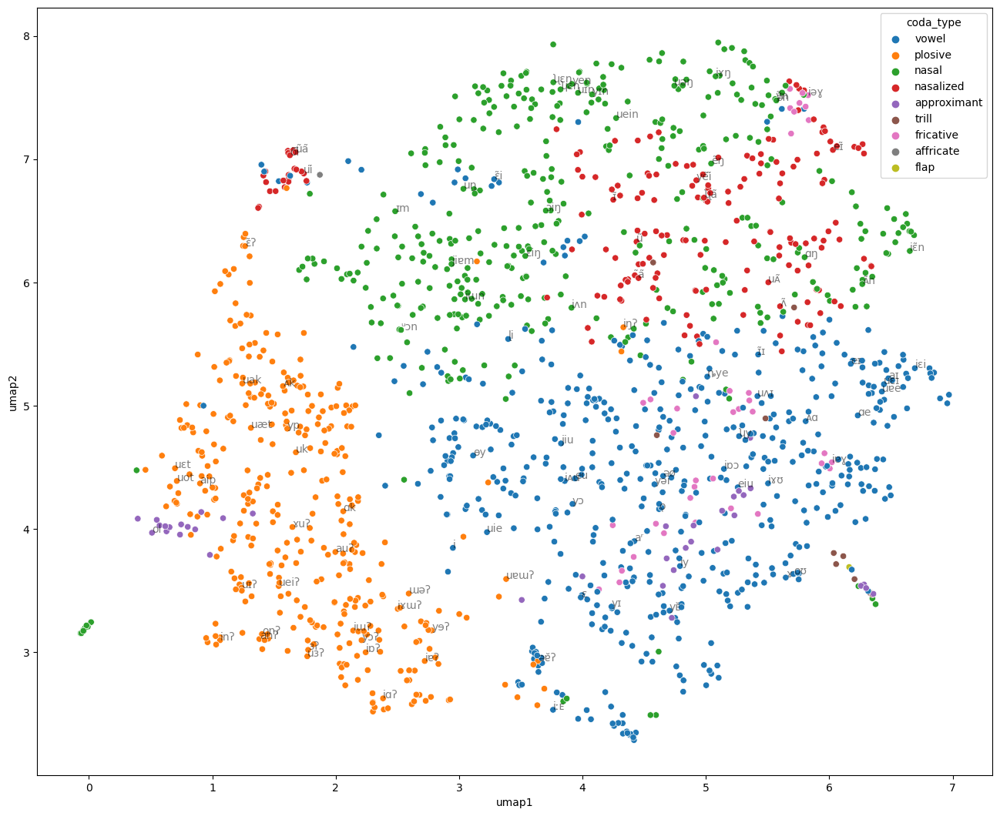

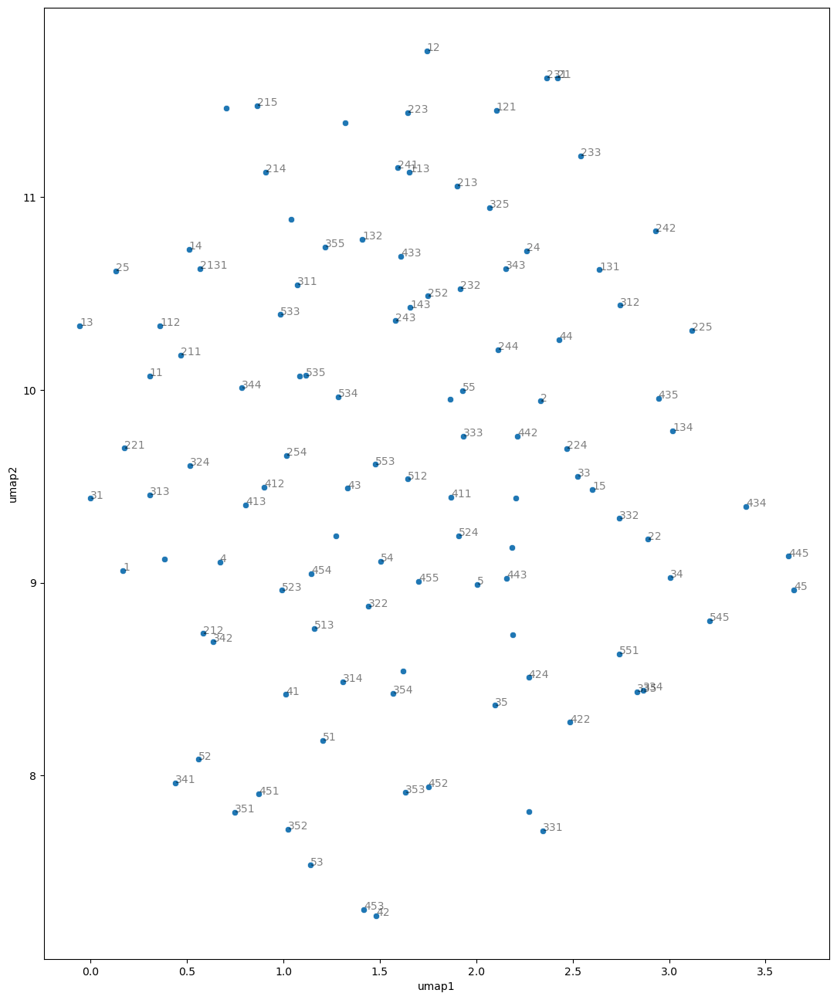

In [13]:
initial = pd.DataFrame({
    'initial_voicing': initial_emb.index[:-1].map(sinetym.phonology.get_voicing).fillna(''),
    'initial_manner': initial_emb.index[:-1].map(sinetym.phonology.get_manner).fillna('')
}, index=initial_emb.index[:-1])
final = pd.DataFrame({'coda_type': final_emb.index[:-1].map(sinetym.phonology.get_coda_type).fillna('')}, index=final_emb.index[:-1])
tone = pd.DataFrame(index=tone_emb.index[:-1])

initial_pca, final_pca, tone_pca = PCA(2), PCA(2), PCA(2)

for i, t in enumerate(('initial', 'final', 'tone')):
    target = globals()[t]
    emb = globals()[f'{t}_emb']

    for prefix, transformer in (('pc', globals()[f'{t}_pca']), ('tsne', TSNE(2)), ('umap', umap.UMAP(n_components=2))):
        target[[f'{prefix}1', f'{prefix}2']] = transformer.fit_transform(emb.values[:-1])

for prefix in ('pc', 'tsne', 'umap'):
    plt.figure(figsize=(16, 16))
    ax = plt.axes(aspect='equal')
    sns.scatterplot(initial, x=f'{prefix}1', y=f'{prefix}2', hue='initial_manner', style='initial_voicing', palette='tab10', ax=ax)
    for i, r in initial.sample(100).iterrows():
        ax.annotate(i, xy=r[[f'{prefix}1', f'{prefix}2']], alpha=0.5)
    plt.show()
    plt.close()

    plt.figure(figsize=(16, 16))
    ax = plt.axes(aspect='equal')
    sns.scatterplot(final, x=f'{prefix}1', y=f'{prefix}2', hue='coda_type', palette='tab10', ax=ax)
    for i, r in final.sample(100).iterrows():
        ax.annotate(i, xy=r[[f'{prefix}1', f'{prefix}2']], alpha=0.5)
    plt.show()
    plt.close()

    plt.figure(figsize=(16, 16))
    ax = plt.axes(aspect='equal')
    sns.scatterplot(tone, x=f'{prefix}1', y=f'{prefix}2', ax=ax)
    for i, r in tone.sample(100).iterrows():
        ax.annotate(i, xy=r[[f'{prefix}1', f'{prefix}2']], alpha=0.5)
    plt.show()
    plt.close()

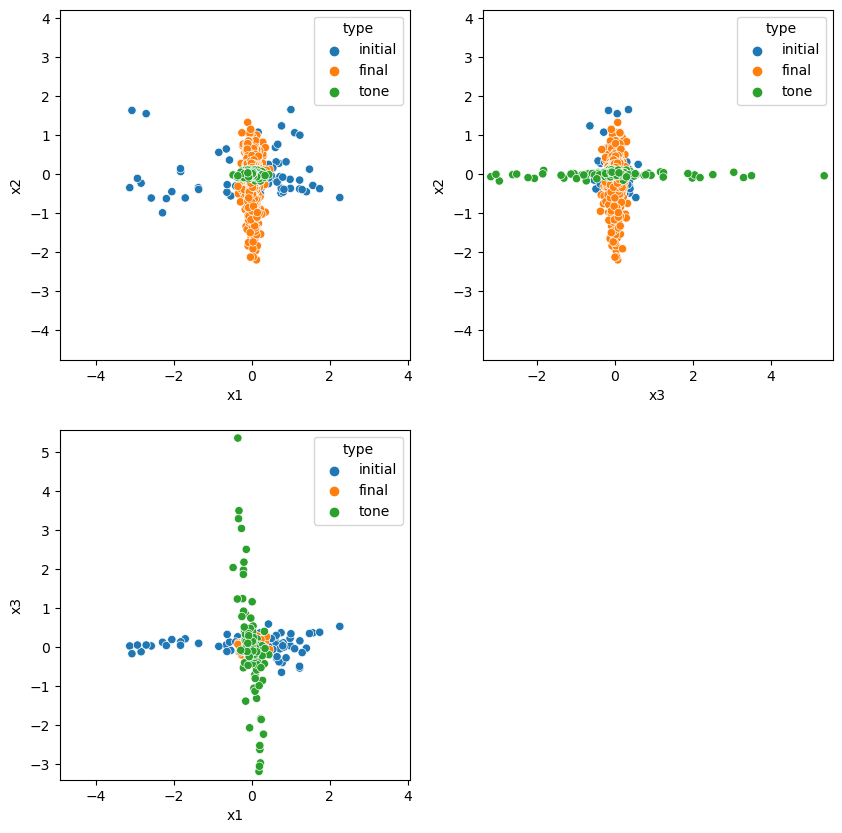

In [14]:
q, _ = np.linalg.qr(np.stack([initial_pca.components_[0], final_pca.components_[0], tone_pca.components_[0]], axis=1))
output = pd.concat([initial.assign(type='initial'), final.assign(type='final'), tone.assign(type='tone')], axis=0, ignore_index=True)
output[['x1', 'x2', 'x3']] = pd.concat(output_embs, axis=0, ignore_index=True) @ q

scale = (output[['x1', 'x2', 'x3']].max() - output[['x1', 'x2', 'x3']].min()).max() * 1.05
lim1, lim2, lim3 = (np.min(output[['x1', 'x2', 'x3']].values, axis=0, keepdims=True).T \
    + np.max(output[['x1', 'x2', 'x3']].values, axis=0, keepdims=True).T \
    + np.asarray([[-1, 1]]) * scale) / 2

fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(2, 2, 1, aspect='equal')
sns.scatterplot(output, x='x1', y='x2', hue='type', palette='tab10', ax=ax)
ax.set_xlim(lim1)
ax.set_ylim(lim2)

ax = fig.add_subplot(2, 2, 2, aspect='equal')
sns.scatterplot(output, x='x3', y='x2', hue='type', palette='tab10', ax=ax)
ax.set_xlim(lim3)
ax.set_ylim(lim2)

ax = fig.add_subplot(2, 2, 3, aspect='equal')
sns.scatterplot(output, x='x1', y='x3', hue='type', palette='tab10', ax=ax)
ax.set_xlim(lim1)
ax.set_ylim(lim3)

plt.show()
plt.close()

C:\Users\lerna\AppData\Local\Temp\ipykernel_2124\3720101018.py:7: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(df['x1'], df['x2'], df['x3'], cmap='tab10', label=t)


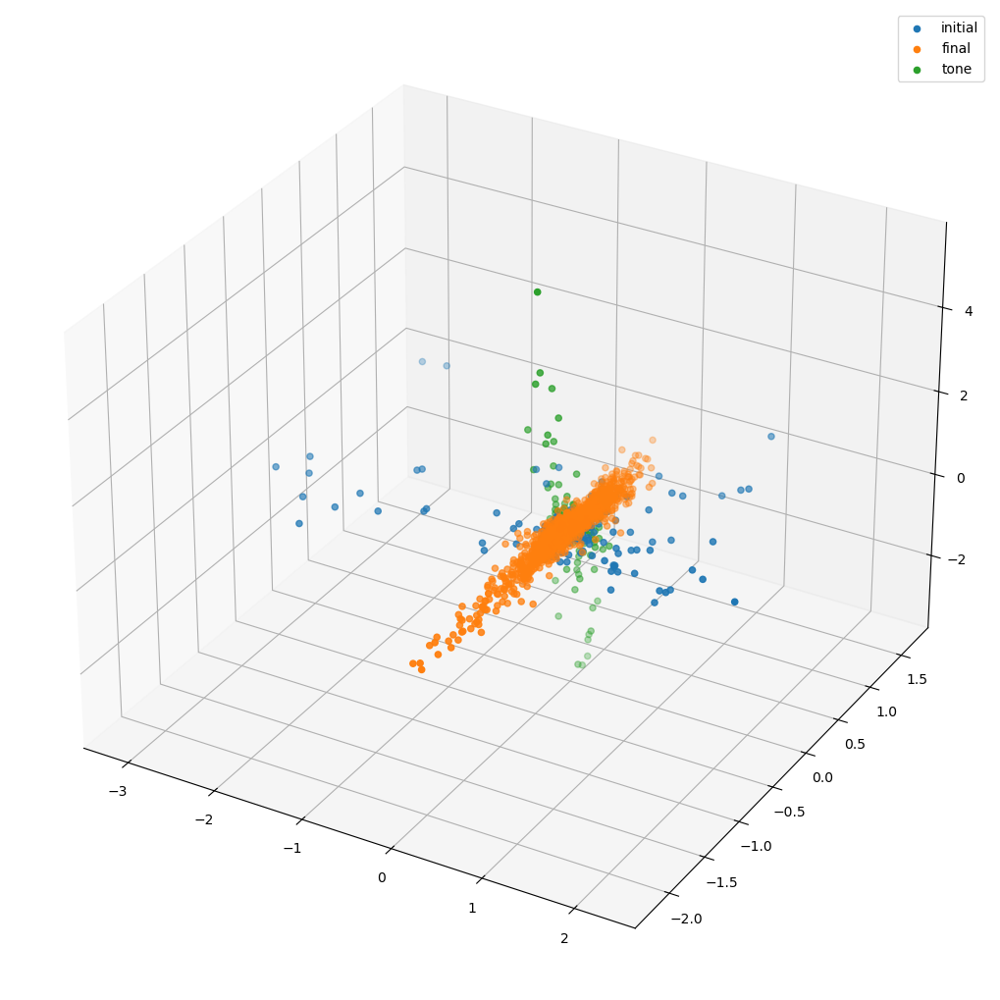

In [15]:
fig = plt.figure(figsize=(10, 10))
ax = mplot3d.Axes3D(fig)
fig.add_axes(ax)

for t in ('initial', 'final', 'tone'):
    df = output[output['type'] == t]
    ax.scatter(df['x1'], df['x2'], df['x3'], cmap='tab10', label=t)

ax.legend(loc='upper right')
plt.show()

ani = animation.FuncAnimation(
    fig,
    functools.partial(rotate, ax=ax),
    np.arange(45, 405, 5),
    interval=200,
    repeat_delay=200
)
# ani.save('声韵调向量投影三维散点图.gif')
plt.close()

In [16]:
zhongguoyuyan = dialect[dialect['dataset'] == 'zhongguoyuyan']
zhongguoyuyan_sample = pd.concat([
    zhongguoyuyan[zhongguoyuyan['representative']],
    zhongguoyuyan[~zhongguoyuyan['representative'] & (zhongguoyuyan['group'] != '')].groupby('group').sample(frac=0.09)
], axis=0)
data = sinetym.datasets.zhongguoyuyan.filter(id=zhongguoyuyan_sample['did'].str[1:]).copy()
data['did'] = data['did'] + data['variant']
data['initial_voicing'] = data['initial'].map(sinetym.phonology.get_voicing).fillna('')
data['initial_manner'] = data['initial'].map(sinetym.phonology.get_manner).fillna('')
data['coda_type'] = data['final'].map(sinetym.phonology.get_coda_type).fillna('')

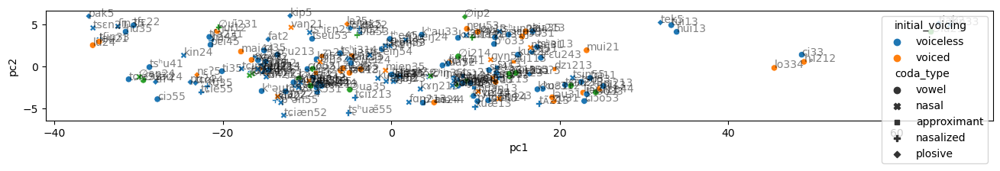

In [17]:
sample = data.sample(200)
output_emb = transform(
    get_emb(dialect_embs, sample[dialect_columns]),
    get_emb(input_embs, sample[input_columns]),
    weight
)
outputs = get_output(output_embs, output_emb)

output_pca = PCA(2)
sample[['pc1', 'pc2']] = output_pca.fit_transform(output_emb)

plt.figure(figsize=(16, 16))
ax = plt.axes(aspect='equal')

sns.scatterplot(data=sample, x='pc1', y='pc2', hue='initial_voicing', style='coda_type', palette='tab10', ax=ax)
for i, r in sample.iterrows():
    ax.annotate(f'{"".join(r[["initial", "final", "tone"]])}', xy=r[['pc1', 'pc2']], alpha=0.5)

plt.show()
plt.close()

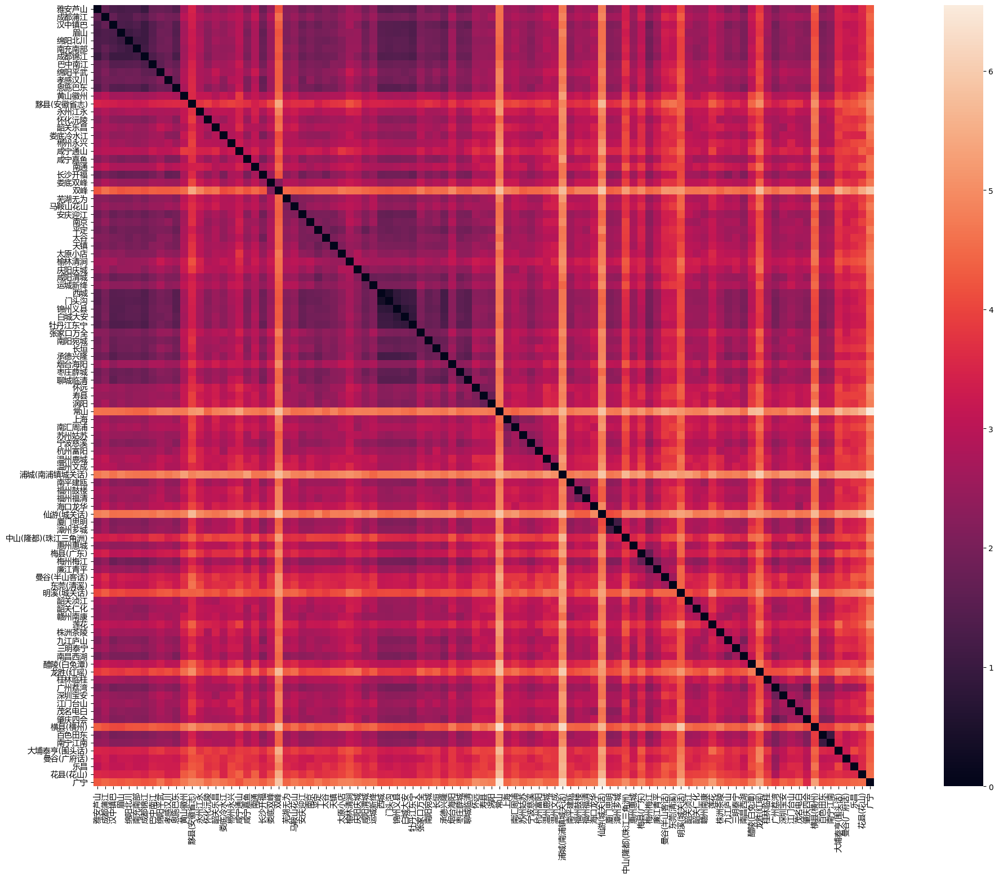

In [18]:
tree = hierarchy.linkage(dialect_emb, method='ward', optimal_ordering=True)
leaves = hierarchy.leaves_list(tree)
df = dialect.iloc[leaves]
df = df[df['sample']]
# dialect['order'] = pd.Series(np.arange(leaves.shape[0]), index=dialect.index[leaves])
# df = dialect[dialect['sample']].sort_values('order')
dist = pd.DataFrame(euclidean_distances(dialect_emb[df['idx']]), index=df.index, columns=df.index)

plt.figure(figsize=(32, 18))
plt.xticks(rotation='vertical', family='Microsoft Yahei')
plt.yticks(rotation='horizontal')
sns.heatmap(dist.values, square=True, xticklabels=df['spot'], yticklabels=df['spot'])
plt.show()
plt.close()

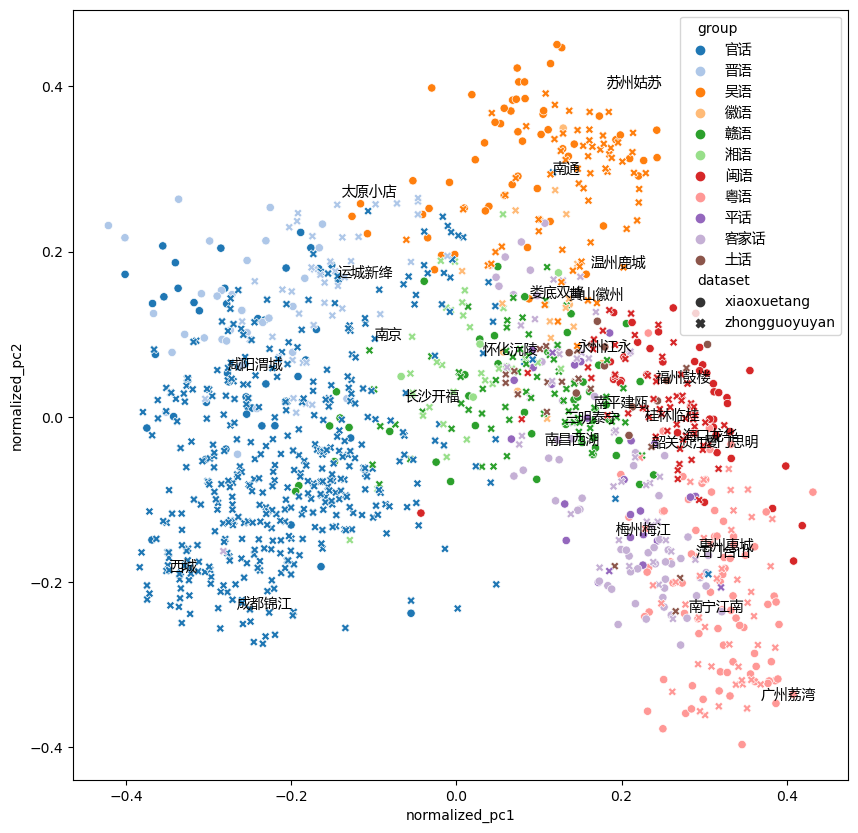

In [19]:
dialect[['normalized_pc1', 'normalized_pc2', 'normalized_pc3']] = PCA(3).fit_transform(normalize(dialect_emb))

plt.figure(figsize=(10, 10))
ax = plt.axes(aspect='equal')
sns.scatterplot(
    dialect[dialect['group'] != ''],
    x='normalized_pc1',
    y='normalized_pc2',
    hue='group',
    style='dataset',
    palette='tab20',
    ax=ax
)

for _, r in dialect[dialect['representative']].iterrows():
    ax.annotate(r['spot'], xy=r[['normalized_pc1', 'normalized_pc2']])

plt.show()
plt.close()

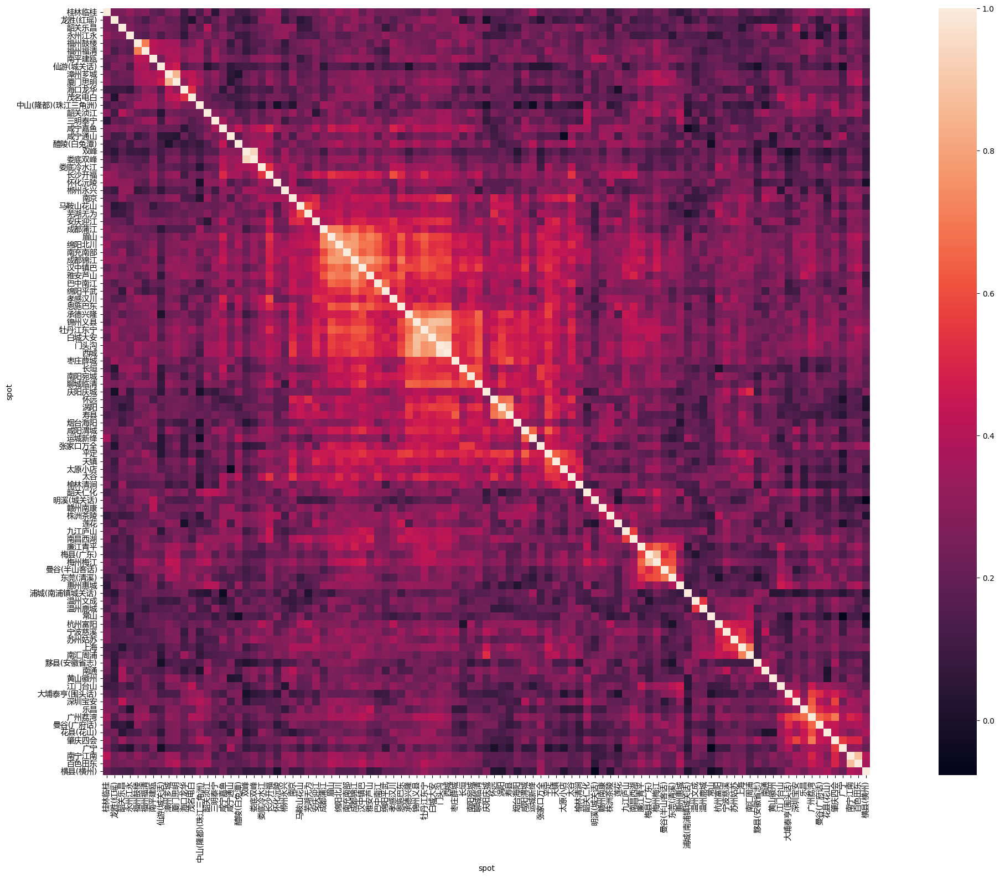

In [20]:
tree = hierarchy.linkage(dialect_emb, method='average', metric='cosine', optimal_ordering=True)
leaves = hierarchy.leaves_list(tree)
df = dialect.iloc[leaves]
df = df[df['sample']]
sim = pd.DataFrame(cosine_similarity(dialect_emb[df['idx']]), index=df['spot'], columns=df['spot'])

plt.figure(figsize=(32, 18))
plt.xticks(rotation='vertical')
plt.yticks(rotation='horizontal')
sns.heatmap(sim, square=True, xticklabels=True, yticklabels=True)
plt.show()
plt.close()

In [21]:
for dist in (
    euclidean_distances(dialect_emb[dialect.loc[dialect['representative'], 'idx']], dialect_emb),
    cosine_distances(dialect_emb[dialect.loc[dialect['representative'], 'idx']], dialect_emb)
):
    idx = np.argsort(dist, axis=1)[:, 1:11]
    display(pd.DataFrame(dialect['spot'].values[idx], index=dialect.loc[dialect['representative'], 'spot']))

,0,1,2,3,4,5,6,7,8,9
spot,,,,,,,,,,
厦门思明,厦门思明,泉州永春,台北新北,厦门同安,漳州芗城,泉州安溪,泉州南安,漳州芗城,泉州鲤城,漳州华安
三明泰宁,南平邵武,大田,宿迁宿城,巫溪,巫山,南充营山,奉节,沙坪坝,黔东南凯里,昌平
福州鼓楼,福州闽侯,福州长乐,福州连江,福州永泰,宁德古田,福州福清,宁德寿宁,平潭,福州罗源,大田
南平建瓯,南平政和,南平延平,大田,南平浦城,南平松溪,巫山,铜仁碧江,遵义仁怀,恩施咸丰,巫溪
怀化沅陵,湘西泸溪,大田,辽源龙山,荣昌,毕节七星关,巴中平昌,铜仁思南,鸡西密山,白城洮南,北碚
永州江永,大田,毕节七星关,巫溪,北碚,万州,万盛,荣昌,郑州金水,铜梁,郴州宜章
长沙开福,长沙,益阳南县,株洲,湘潭雨湖,岳阳岳阳楼,大田,怀化靖州,常德安乡,荆州,益阳沅江
娄底双峰,湘潭湘乡,双峰,湘潭韶山,大田,常德津市,荆州松滋,内江威远,株洲,娄底娄星,恩施
南昌西湖,南昌湾里,景德镇珠山,九江德安,抚州临川,抚州资溪,大田,青阳,广安武胜,沙坪坝,拉萨城关


,0,1,2,3,4,5,6,7,8,9
spot,,,,,,,,,,
厦门思明,厦门思明,泉州永春,台北新北,厦门同安,漳州芗城,泉州安溪,漳州,漳州芗城,泉州南安,泉州鲤城
三明泰宁,泰宁(城关话),南平邵武,邵武,宿迁宿城,南平延平,宁德柘荣,抚州南城,大田,吉安永丰,桂林兴安
福州鼓楼,福州闽侯,福州长乐,福州连江,福州永泰,福州,宁德古田,马祖,福州福清,古田,福清
南平建瓯,建瓯(市志),建瓯,南平政和,石陂,南平浦城,南平延平,南平松溪,松溪,南平武夷山,崇安(崇城镇城关话)
怀化沅陵,湘西泸溪,湘潭韶山,大田,湘西古丈,永州冷水滩,吉安,贺州钟山,广元苍溪,辽源龙山,杭州淳安
永州江永,江永城关(白水村),郴州宜章,大田,湘西泸溪,韶关南雄,贺州富川,贺州钟山,宣城旌德,三明大田,黔南平塘
长沙开福,长沙,益阳南县,长沙,湘潭雨湖,株洲,湘潭,益阳沅江,岳阳岳阳楼,岳阳,岳阳湘阴
娄底双峰,双峰,湘潭湘乡,娄底娄星,湘潭韶山,娄底涟源,株洲,邵阳隆回,常德津市,怀化芷江,邵阳城步
南昌西湖,南昌湾里,景德镇珠山,抚州临川,南昌,抚州资溪,上高,万载,九江德安,九江永修,临川


c:\Users\lerna\AppData\Local\miniconda3\lib\site-packages\sklearn\svm\_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
c:\Users\lerna\AppData\Local\miniconda3\lib\site-packages\sklearn\svm\_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(


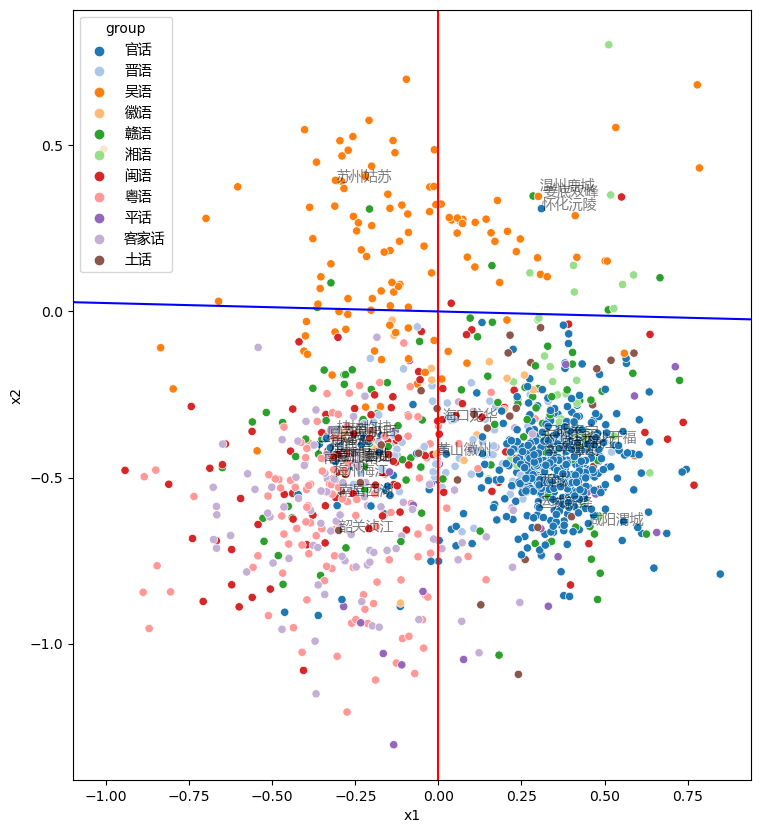

In [22]:
train_data = data[data['cid'].isin(['Z0434', 'Z0885']) & data['coda_type'].notna()]
plosive_svc = LinearSVC(fit_intercept=False).fit(get_emb(dialect_embs, train_data[dialect_columns]), np.where(train_data['coda_type'] == 'plosive', 1, 0))
train_data = data[data['cid'].isin(['Z0214', 'Z0923']) & data['initial_voicing'].notna()]
voiced_svc = LinearSVC(fit_intercept=False).fit(get_emb(dialect_embs, train_data[dialect_columns]), train_data['initial_voicing'])

q, _ = np.linalg.qr(np.stack([plosive_svc.coef_[0], voiced_svc.coef_[0]], axis=1))
dialect[['x1', 'x2']] = dialect_emb @ q

plt.figure(figsize=(10, 10))
ax = plt.axes(aspect='equal')

sns.scatterplot(dialect[dialect['group'] != ''], x='x1', y='x2', hue='group', palette='tab20', ax=ax)
for _, r in dialect[dialect['representative']].iterrows():
    ax.annotate(r['spot'], xy=r[['x1', 'x2']], alpha=0.5)

ax.axvline(0, color='red')
a = voiced_svc.coef_[0] @ q
ax.axline([0, 0], slope=-a[0] / a[1], color='blue')

plt.show()
plt.close()

In [23]:
df = dialect[~dialect['group'].isin(['', '土话'])]
group_train_data = df.groupby('group').sample(frac=0.8)
group_test_data = df[pd.Series(False, index=group_train_data.index).reindex(df.index, fill_value=True)]
train_emb, test_emb = dialect_emb[group_train_data['idx']], dialect_emb[group_test_data['idx']]

group_lr = LogisticRegression(fit_intercept=False)
group_svc = LinearSVC(fit_intercept=False)
group_tree = DecisionTreeClassifier()
group_knn = KNeighborsClassifier(metric='cosine')

for name, classifier in ('lr', group_lr), ('svc', group_svc), ('tree', group_tree), ('knn', group_knn):
    group_test_data[name] = classifier.fit(train_emb, group_train_data['group']).predict(test_emb)

for name in ('lr', 'svc', 'tree', 'knn'):
    print(classification_report(group_test_data['group'], group_test_data[name]))

c:\Users\lerna\AppData\Local\miniconda3\lib\site-packages\sklearn\svm\_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(


              precision    recall  f1-score   support

          吴语       0.96      1.00      0.98        24
          官话       0.91      0.99      0.95        92
         客家话       0.89      0.85      0.87        20
          平话       1.00      0.80      0.89         5
          徽语       1.00      0.75      0.86         4
          晋语       1.00      0.67      0.80        15
          湘语       1.00      0.71      0.83         7
          粤语       0.96      1.00      0.98        25
          赣语       0.86      0.78      0.82        23
          闽语       0.91      1.00      0.95        20

    accuracy                           0.92       235
   macro avg       0.95      0.86      0.89       235
weighted avg       0.93      0.92      0.92       235

              precision    recall  f1-score   support

          吴语       0.92      1.00      0.96        24
          官话       0.93      0.95      0.94        92
         客家话       0.94      0.80      0.86        20
          平话       1.00 

In [24]:
display(group_test_data.loc[
    np.any([group_test_data[n] != group_test_data['group'] for n in ('lr', 'svc', 'knn')], axis=0),
    ['dataset', 'group', 'subgroup', 'cluster', 'subcluster', 'spot', 'lr', 'svc', 'knn']
].sort_values('group'))

,dataset,group,subgroup,cluster,subcluster,spot,lr,svc,knn
did,,,,,,,,,
X153,xiaoxuetang,吴语,,宣州片,铜泾小片,铜陵县,吴语,吴语,官话
X048,xiaoxuetang,官话,西南官话,桂柳片,,桂林(临桂),官话,晋语,官话
Z10G60,zhongguoyuyan,官话,江淮官话,泰如片,,南通海安,官话,吴语,官话
Z10G69,zhongguoyuyan,官话,江淮官话,泰如片,,南通,吴语,徽语,官话
Z18E35,zhongguoyuyan,官话,江淮官话,黄孝片,,九江瑞昌,官话,赣语,官话
Z26J61,zhongguoyuyan,官话,,,,怀化沅陵,官话,湘语,官话
Z18J86,zhongguoyuyan,客家话,,宁龙片,宁石小片,赣州石城,客家话,赣语,赣语
Z02A10,zhongguoyuyan,客家话,,闽西片,,三明明溪,闽语,闽语,闽语
Z02A08,zhongguoyuyan,客家话,,闽西片,连城,龙岩连城,闽语,闽语,客家话


C:\Users\lerna\AppData\Local\Temp\ipykernel_2124\2673769086.py:9: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(pc[mask, 0], pc[mask, 1], pc[mask, 2], label=g, cmap='tab20')


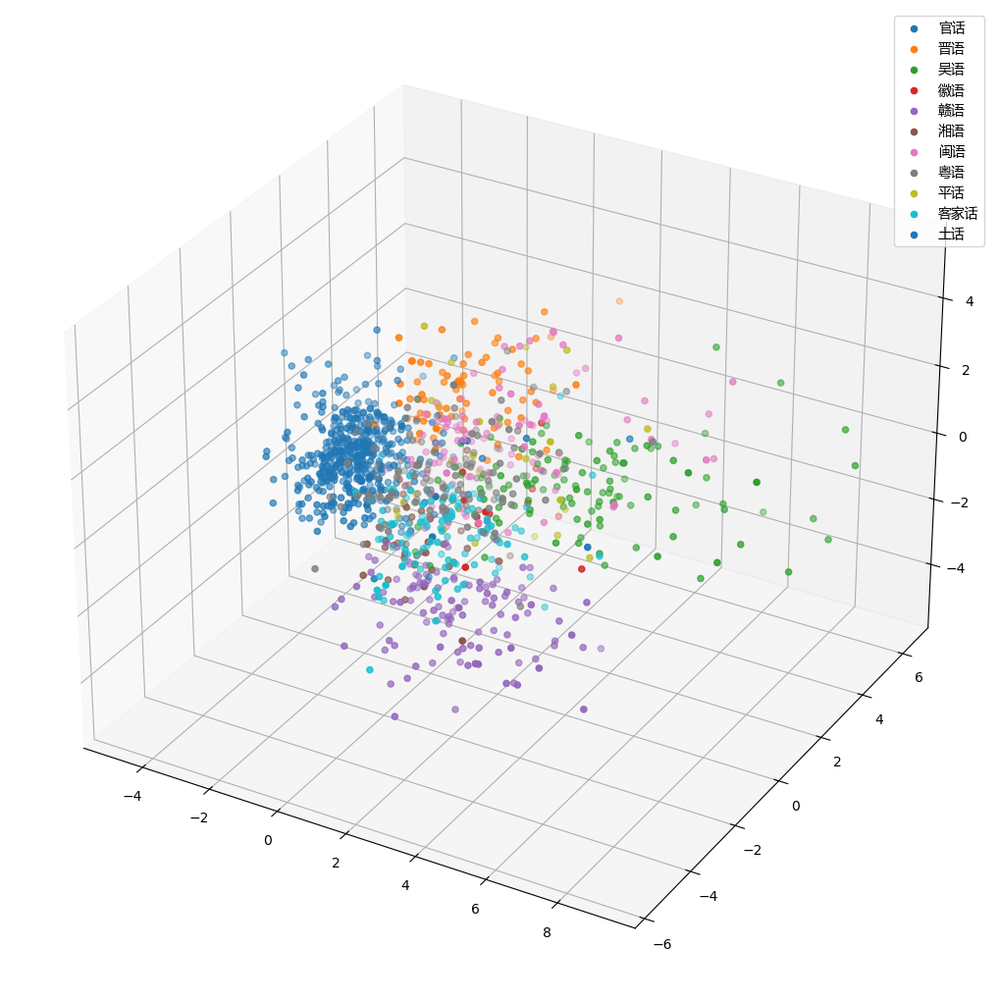

In [25]:
pc = PCA(3).fit_transform(group_svc.decision_function(dialect_emb))

fig = plt.figure(figsize=(10, 10))
ax = mplot3d.Axes3D(fig)
fig.add_axes(ax)

for g in dialect.loc[dialect['group'] != '', 'group'].unique():
    mask = (dialect['group'] == g)
    ax.scatter(pc[mask, 0], pc[mask, 1], pc[mask, 2], label=g, cmap='tab20')

ax.legend(loc='upper right')
plt.show()

ani = animation.FuncAnimation(
    fig,
    functools.partial(rotate, ax=ax),
    np.arange(45, 405, 5),
    interval=200,
    repeat_delay=200
)
# ani.save('方言编码SVM变换PCA降维三维散点图.gif')
plt.close()

C:\Users\lerna\AppData\Local\Temp\ipykernel_2124\1143733539.py:11: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(df['pc1'], df['pc2'], df['pc3'], cmap='tab10', label=g)


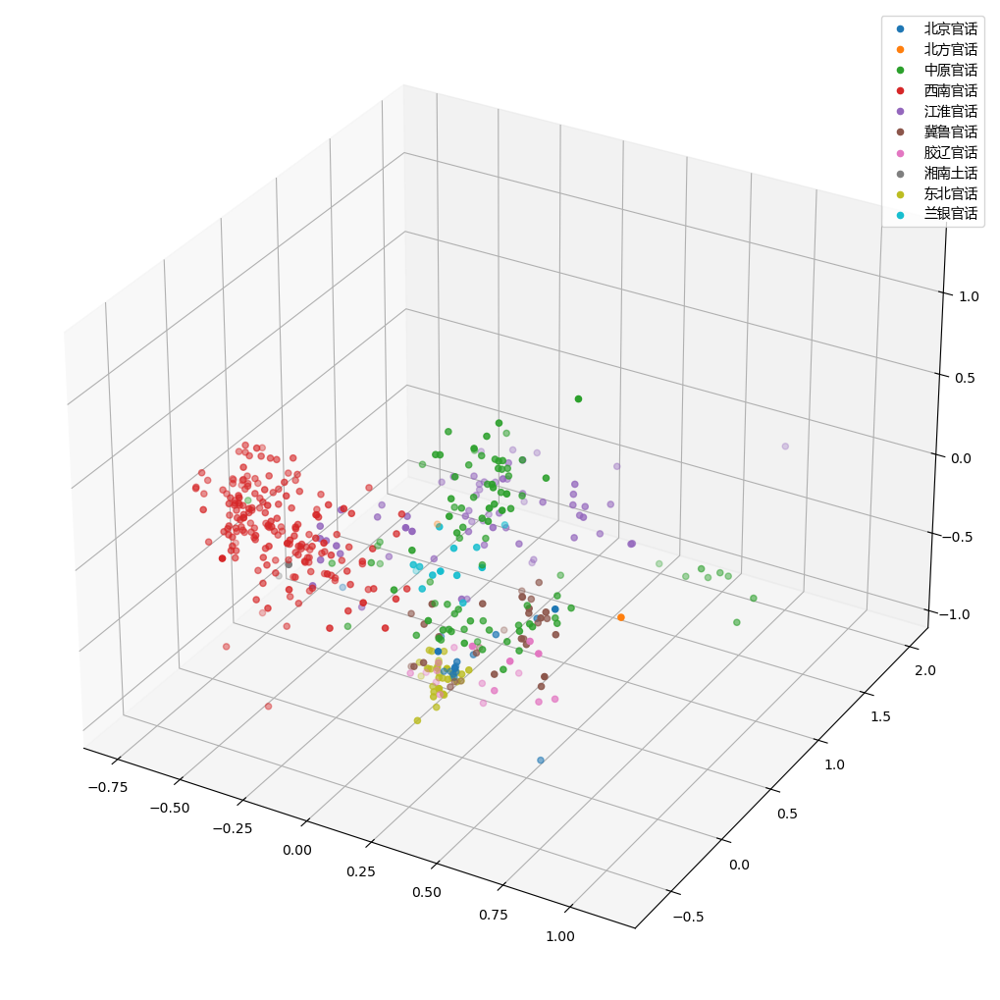

In [26]:
mandarin = dialect[(dialect['group'] == '官话') & (dialect['subgroup'] != '')].copy()
mandarin_emb = dialect_emb[mandarin['idx']]
mandarin[['pc1', 'pc2', 'pc3']] = PCA(3).fit_transform(mandarin_emb)

fig = plt.figure(figsize=(10, 10))
ax = mplot3d.Axes3D(fig)
fig.add_axes(ax)

for g in mandarin['subgroup'].unique():
    df = mandarin[mandarin['subgroup'] == g]
    ax.scatter(df['pc1'], df['pc2'], df['pc3'], cmap='tab10', label=g)

ax.legend(loc='upper right')
plt.show()

ani = animation.FuncAnimation(
    fig,
    functools.partial(rotate, ax=ax),
    np.arange(45, 405, 5),
    interval=200,
    repeat_delay=200
)
# ani.save('官话方言编码PCA降维三维散点图.gif')
plt.close()

In [27]:
subgroup_train_data = mandarin.groupby('subgroup').sample(frac=0.8)
subgroup_test_data = mandarin[pd.Series(False, index=subgroup_train_data.index).reindex(mandarin.index, fill_value=True)]
train_emb, test_emb = dialect_emb[subgroup_train_data['idx']], dialect_emb[subgroup_test_data['idx']]

subgroup_lr = LogisticRegression(fit_intercept=False)
subgroup_svc = LinearSVC(fit_intercept=False)
subgroup_tree = DecisionTreeClassifier()
subgroup_knn = KNeighborsClassifier(metric='cosine')

for name, classifier in ('lr', subgroup_lr), ('svc', subgroup_svc), ('tree', subgroup_tree), ('knn', subgroup_knn):
    subgroup_test_data[name] = classifier.fit(train_emb, subgroup_train_data['subgroup']).predict(test_emb)

for name in ('lr', 'svc', 'tree', 'knn'):
    print(classification_report(subgroup_test_data['subgroup'], subgroup_test_data[name]))

              precision    recall  f1-score   support

        东北官话       0.88      1.00      0.93         7
        中原官话       0.83      0.79      0.81        19
        兰银官话       1.00      0.33      0.50         3
        冀鲁官话       0.83      0.83      0.83         6
        北京官话       1.00      0.67      0.80         3
        江淮官话       1.00      0.92      0.96        12
        胶辽官话       0.75      1.00      0.86         3
        西南官话       0.93      1.00      0.96        37

    accuracy                           0.90        90
   macro avg       0.90      0.82      0.83        90
weighted avg       0.90      0.90      0.89        90

              precision    recall  f1-score   support

        东北官话       0.88      1.00      0.93         7
        中原官话       0.78      0.74      0.76        19
        兰银官话       1.00      0.33      0.50         3
        冀鲁官话       0.83      0.83      0.83         6
        北京官话       1.00      0.67      0.80         3
        江淮官话       0.92 

c:\Users\lerna\AppData\Local\miniconda3\lib\site-packages\sklearn\svm\_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
c:\Users\lerna\AppData\Local\miniconda3\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\lerna\AppData\Local\miniconda3\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\lerna\AppData\Local\miniconda3\lib\site-packages\sklearn\metrics\_classification.py:1469: Undefin

In [28]:
display(subgroup_test_data.loc[
    np.any([subgroup_test_data[n] != subgroup_test_data['subgroup'] for n in ('lr', 'svc', 'knn')], axis=0),
    ['dataset', 'group', 'subgroup', 'cluster', 'subcluster', 'spot', 'lr', 'svc', 'knn']
].sort_values('subgroup'))

,dataset,group,subgroup,cluster,subcluster,spot,lr,svc,knn
did,,,,,,,,,
Z28E70,zhongguoyuyan,官话,中原官话,,,安康白河,中原官话,江淮官话,中原官话
Z35H15,zhongguoyuyan,官话,中原官话,信蚌片,,吉首古丈,西南官话,西南官话,西南官话
Z35H19,zhongguoyuyan,官话,中原官话,信蚌片,,苏州吴江,西南官话,胶辽官话,中原官话
Z35H12,zhongguoyuyan,官话,中原官话,信蚌片,,东方,胶辽官话,胶辽官话,胶辽官话
Z28993,zhongguoyuyan,官话,中原官话,秦陇片,,汉中汉台,中原官话,中原官话,东北官话
Z29A63,zhongguoyuyan,官话,中原官话,秦陇片,西宁方言小片,西宁城东,中原官话,中原官话,江淮官话
Z24J26,zhongguoyuyan,官话,中原官话,关中片,,三门峡灵宝,中原官话,中原官话,兰银官话
Z06F97,zhongguoyuyan,官话,中原官话,兖菏片,,临沂郯城,冀鲁官话,冀鲁官话,冀鲁官话
Z14E69,zhongguoyuyan,官话,兰银官话,河西片,武威小片,金昌永昌,中原官话,中原官话,中原官话


C:\Users\lerna\AppData\Local\Temp\ipykernel_2124\3736150610.py:9: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(pc[mask, 0], pc[mask, 1], pc[mask, 2], label=g, cmap='tab10')


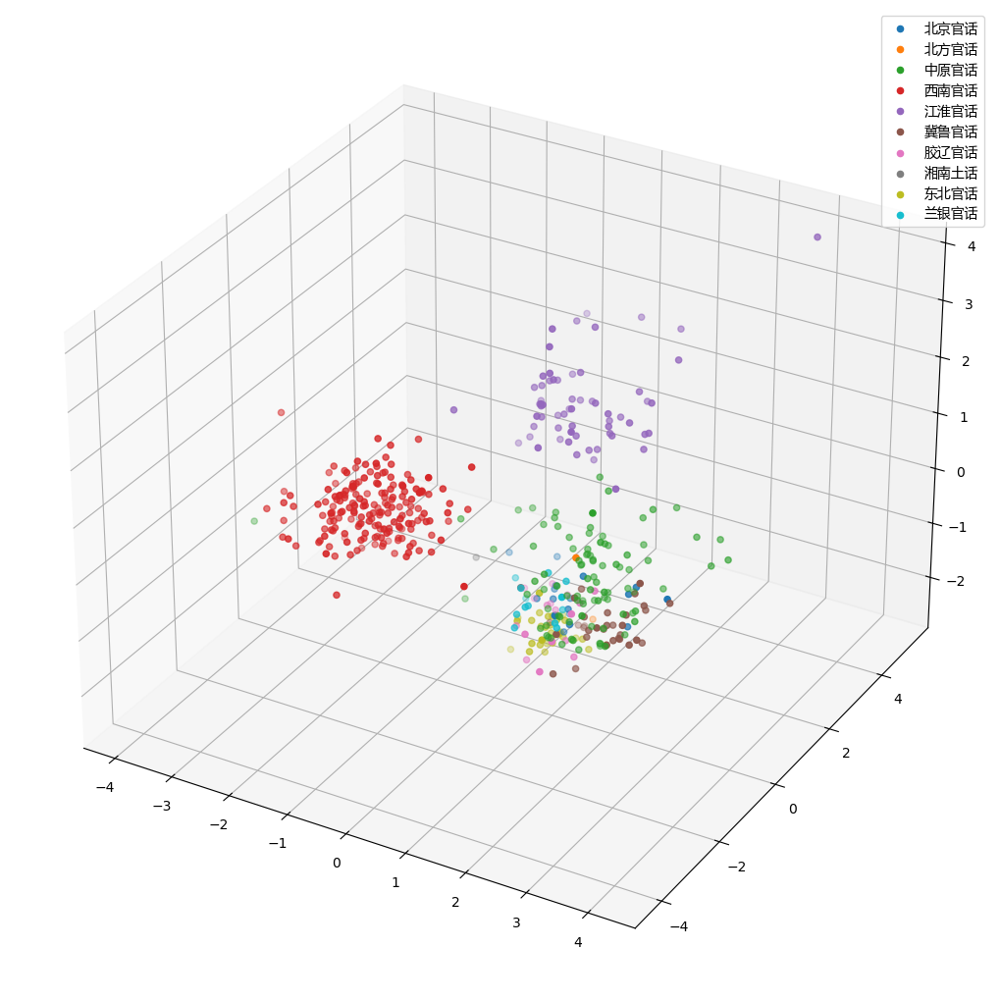

In [29]:
pc = PCA(3).fit_transform(subgroup_svc.decision_function(mandarin_emb))

fig = plt.figure(figsize=(10, 10))
ax = mplot3d.Axes3D(fig)
fig.add_axes(ax)

for g in mandarin['subgroup'].unique():
    mask = (mandarin['subgroup'] == g)
    ax.scatter(pc[mask, 0], pc[mask, 1], pc[mask, 2], label=g, cmap='tab10')

ax.legend(loc='upper right')
plt.show()

ani = animation.FuncAnimation(
    fig,
    functools.partial(rotate, ax=ax),
    np.arange(45, 405, 5),
    interval=200,
    repeat_delay=200
)
# ani.save('官话方言编码SVM变换PCA降维三维散点图.gif')
plt.close()

In [30]:
for classifier in (group_svc, subgroup_svc):
    output_emb = transform(
        np.tile(classifier.coef_, [char[char['sample']].shape[0], 1]),
        np.repeat(char_emb[char.loc[char['sample'], 'idx']], classifier.coef_.shape[0], axis=0),
        weight
    )
    output = get_output(output_embs, output_emb)
    display(pd.DataFrame(
        np.apply_along_axis(''.join, -1, output).reshape([-1, classifier.coef_.shape[0]]),
        index=char.loc[char['sample'], 'character'],
        columns=classifier.classes_
    )[:20])

,吴语,官话,客家话,平话,徽语,晋语,湘语,粤语,赣语,闽语
character,,,,,,,,,,
锣,dʑam231,tɕʰuŋ5,tɕʰuŋ51,tɕʰuŋ52,tɕʰiɛn4,ti24,tɕiɛn13,tʃʰam22,tɕʰuŋ32,ti24
鹅,dʑuŋ231,tɕʰuŋ52,tɕʰuŋ51,xuŋ52,tɕʰam41,ti24,tɕiɛn13,fuŋ22,xuŋ324,ti24
婆,dʑam231,xuŋ52,tɕʰam51,tɕuŋ52,tɕʰam41,ti24,tɕiɛn13,θuŋ22,tɕʰyɛn3,ti24
骂,dʑuŋ231,xuŋ52,θam51,xuŋ52,tɕʰuŋ4,ti24,ʑyn45,fuŋ22,xam324,ti24
杜,dʑam231,xuŋ51,tsʰuŋ51,xuŋ52,tɕʰam41,ti24,ʑin45,ʃam22,tɕʰyɛn2,ti24
古,dʑam52,tɕʰuŋ5,tɕʰuŋ31,xuŋ33,tɕʰam4,ti24,ʑin42,fam5,tɕʰyɛn3,ti24
苦,dʑam231,tɕʰuŋ5,ɬuŋ31,xuŋ33,tɕam4,ti24,dʑin42,fam5,dʑyɛn31,ti24
如,dʑam231,tɕʰuŋ52,tɕʰuŋ51,xuŋ52,tɕʰam41,ti24,tɕiɛn13,ham22,tɕʰuŋ44,ti24
柱,dʑaʔ231,xuŋ51,tʃʰuŋ51,xuŋ52,tɕʰam41,ti24,ɣin45,ʃam5,tɕʰyɛn3,ti24


,东北官话,中原官话,兰银官话,冀鲁官话,北京官话,北方官话,江淮官话,湘南土话,胶辽官话,西南官话
character,,,,,,,,,,
锣,piau35,tɕʰuɤ1,vuŋ51,ti24,tɕʰuŋ5,tɕʰuŋ3,tɕʰuŋ5,ti24,ti24,zo23
鹅,ti35,tɕʰuɤ1,tɕʰuŋ5,ti24,tɕʰuŋ5,tʰuŋ31,xuŋ5,ti24,ti24,to23
婆,ti35,pfʰuɤ1,dʑuŋ51,ti24,tɕʰuŋ5,tɕuŋ31,xuŋ5,ti24,ti24,zo23
骂,ji11,pʰɛŋ55,dʑuŋ51,ti24,tɕʰuŋ5,tɕʰuŋ3,tɕʰuŋ5,ti24,ti24,zo23
杜,jiŋ11,tɕʰɛŋ5,ɦuŋ51,ti24,θuŋ51,ɡuŋ213,tɕʰuŋ5,ji24,pi21,zo23
古,ji213,ʔdeŋ11,tɕʰuŋ5,ti24,tɕʰuŋ5,tɕʰuŋ5,tɕʰuŋ4,ti24,ti24,zo23
苦,ji213,veŋ11,dʑuŋ52,ti24,θuŋ55,tɕʰuŋ5,tɕʰuŋ4,ti24,ti24,zo23
如,təŋ35,vɛ̃11,dʑuŋ51,ti24,tʰuŋ55,tʰuŋ55,xuŋ5,ti24,ti24,zo23
柱,həŋ11,fɛ̃54,vuŋ51,ti24,θuŋ51,ɣuŋ412,tɕʰuŋ5,ti24,ti21,zi23


In [31]:
train_data, test_data = train_test_split(char[char['coda_type'] != ''], train_size=0.05)
plosive_svc = LinearSVC(fit_intercept=False).fit(char_emb[train_data['idx']], train_data['coda_type'] == 'plosive')
print(classification_report(test_data['coda_type'] == 'plosive', plosive_svc.predict(char_emb[test_data['idx']])))

train_data, test_data = train_test_split(char[char['initial_voicing'] != ''], train_size=0.05)
voiced_svc = LinearSVC(fit_intercept=False).fit(char_emb[train_data['idx']], train_data['initial_voicing'])
print(classification_report(test_data['initial_voicing'], voiced_svc.predict(char_emb[test_data['idx']])))

              precision    recall  f1-score   support

       False       1.00      1.00      1.00       752
        True       0.99      1.00      0.99       192

    accuracy                           1.00       944
   macro avg       0.99      1.00      1.00       944
weighted avg       1.00      1.00      1.00       944

              precision    recall  f1-score   support

      voiced       0.98      0.95      0.96       424
   voiceless       0.96      0.98      0.97       483

    accuracy                           0.96       907
   macro avg       0.97      0.96      0.96       907
weighted avg       0.96      0.96      0.96       907



c:\Users\lerna\AppData\Local\miniconda3\lib\site-packages\sklearn\svm\_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
c:\Users\lerna\AppData\Local\miniconda3\lib\site-packages\sklearn\svm\_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(


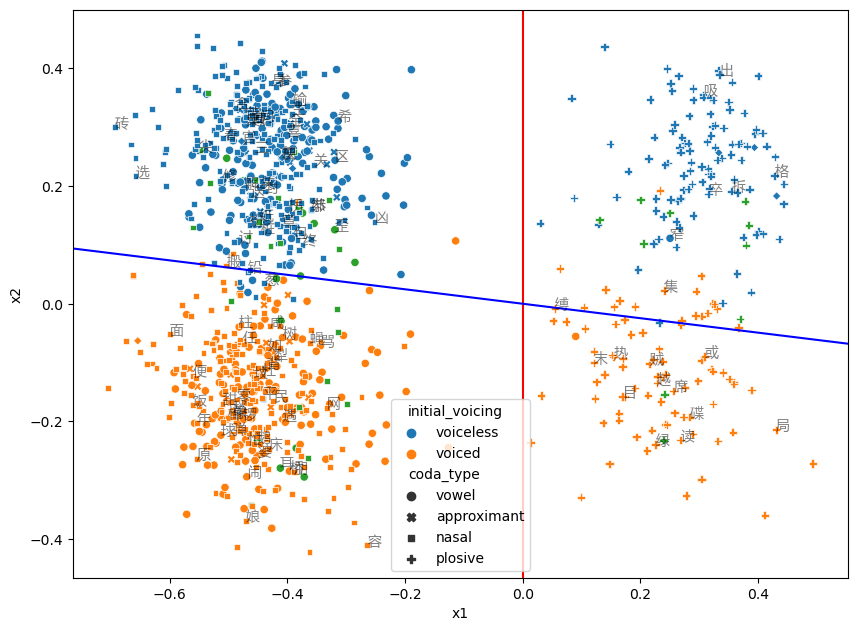

In [32]:
q, _ = np.linalg.qr(np.stack([plosive_svc.coef_[0], voiced_svc.coef_[0]], axis=1))
char[['x1', 'x2']] = char_emb @ q

plt.figure(figsize=(10, 10))
ax = plt.axes(aspect='equal')

sns.scatterplot(char, x='x1', y='x2', hue='initial_voicing', style='coda_type', palette='tab10', ax=ax)
for _, r in char[char['sample']].iterrows():
    ax.annotate(r['character'], xy=r[['x1', 'x2']], alpha=0.5)

ax.axvline(0, color='red')
a = voiced_svc.coef_[0] @ q
ax.axline([0, 0], slope=-a[0] / a[1], color='blue')

plt.show()
plt.close()

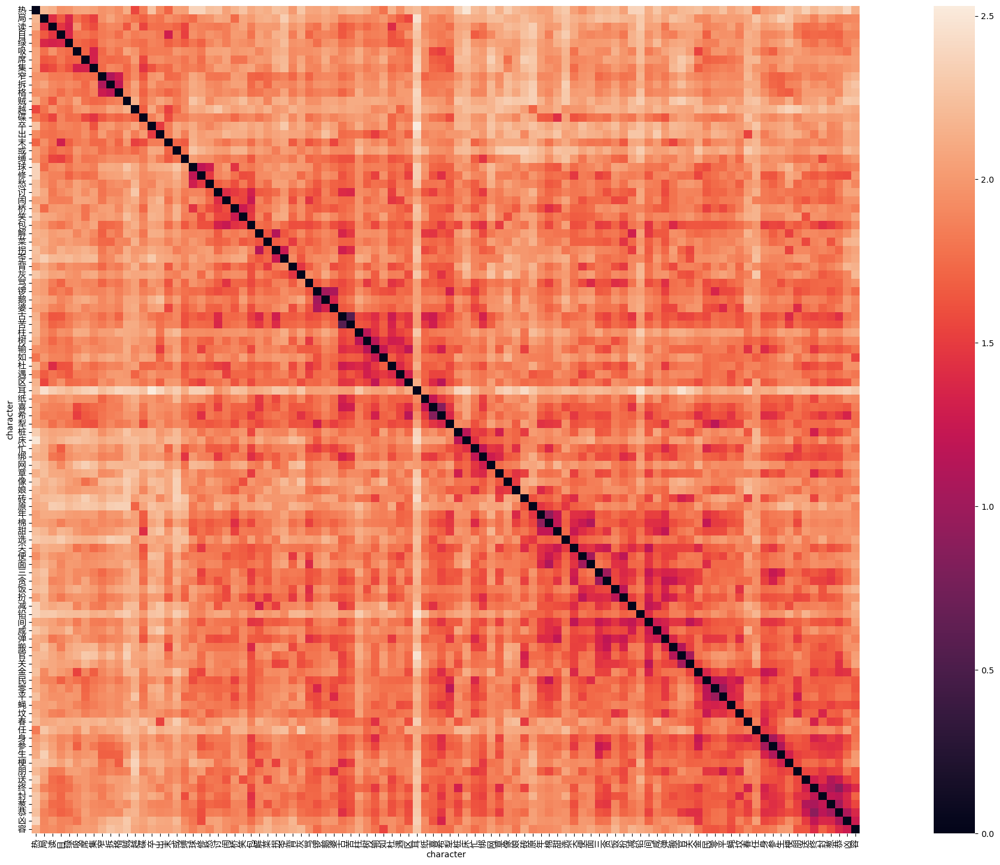

In [33]:
tree = hierarchy.linkage(char_emb, method='ward', optimal_ordering=True)
leaves = hierarchy.leaves_list(tree)
df = char.iloc[leaves]
df = df[df['sample']]
dist = pd.DataFrame(euclidean_distances(char_emb[df['idx']]), index=df['character'], columns=df['character'])

plt.figure(figsize=(32, 18))
plt.xticks(rotation='vertical')
plt.yticks(rotation='horizontal')
sns.heatmap(dist, square=True, xticklabels=True, yticklabels=True)
plt.show()
plt.close()

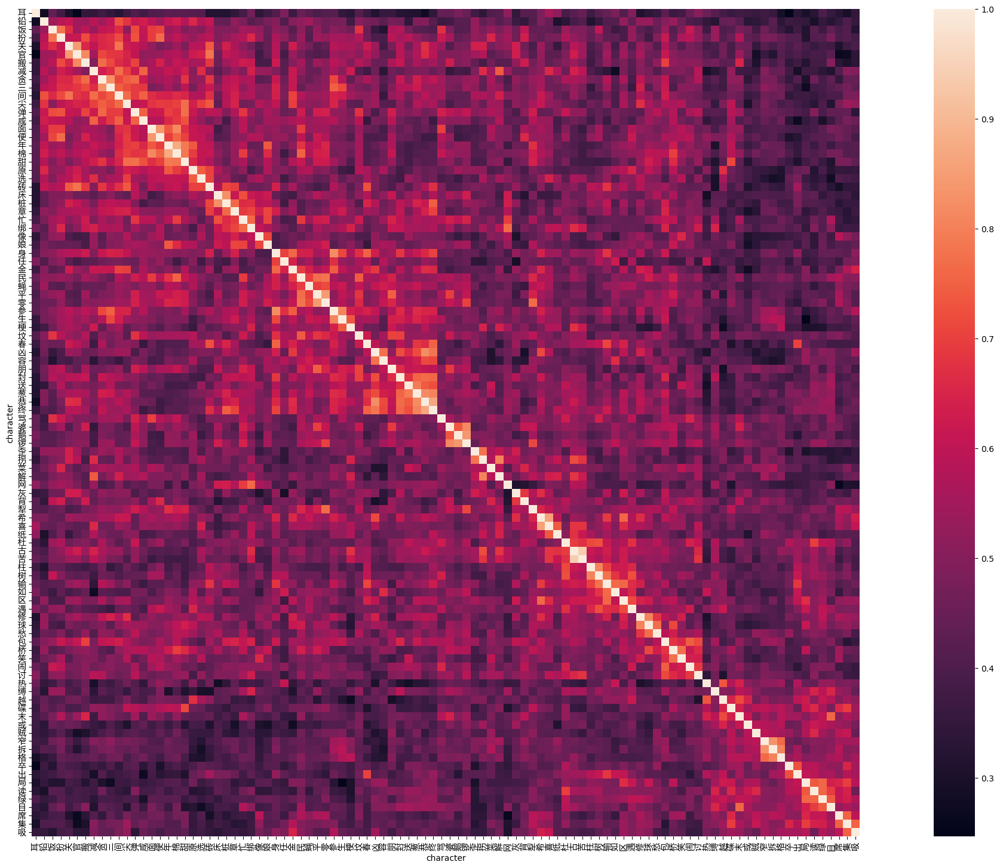

In [34]:
tree = hierarchy.linkage(char_emb, method='average', metric='cosine', optimal_ordering=True)
leaves = hierarchy.leaves_list(tree)
df = char.iloc[leaves]
df = df[df['sample']]
sim = pd.DataFrame(cosine_similarity(char_emb[df['idx']]), index=df['character'], columns=df['character'])

plt.figure(figsize=(32, 18))
plt.xticks(rotation='vertical')
plt.yticks(rotation='horizontal')
sns.heatmap(sim, square=True, xticklabels=True, yticklabels=True)
plt.show()
plt.close()

c:\Users\lerna\AppData\Local\miniconda3\lib\site-packages\matplotlib\animation.py:892: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


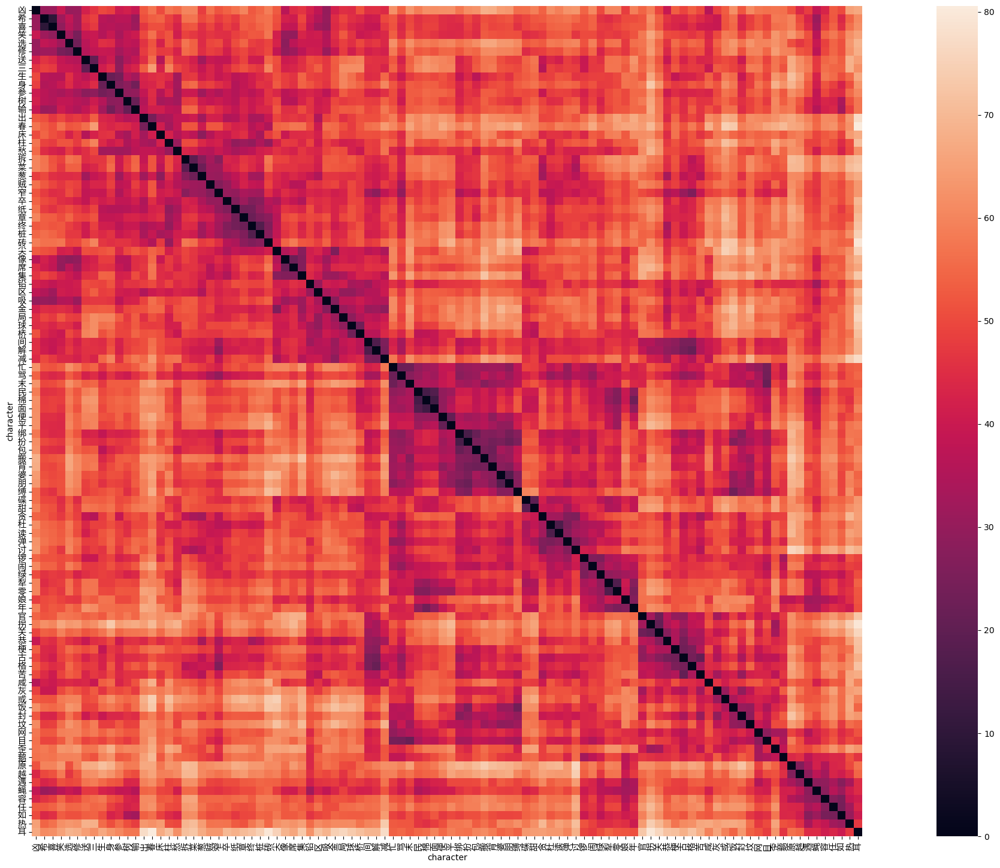

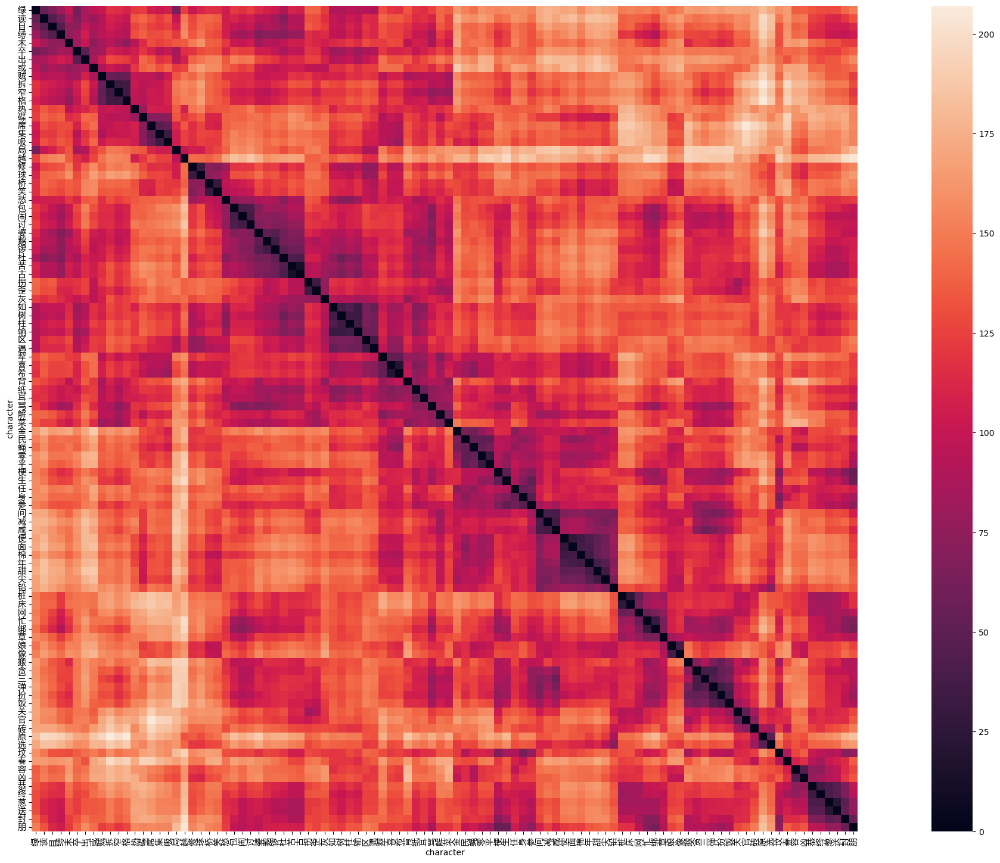

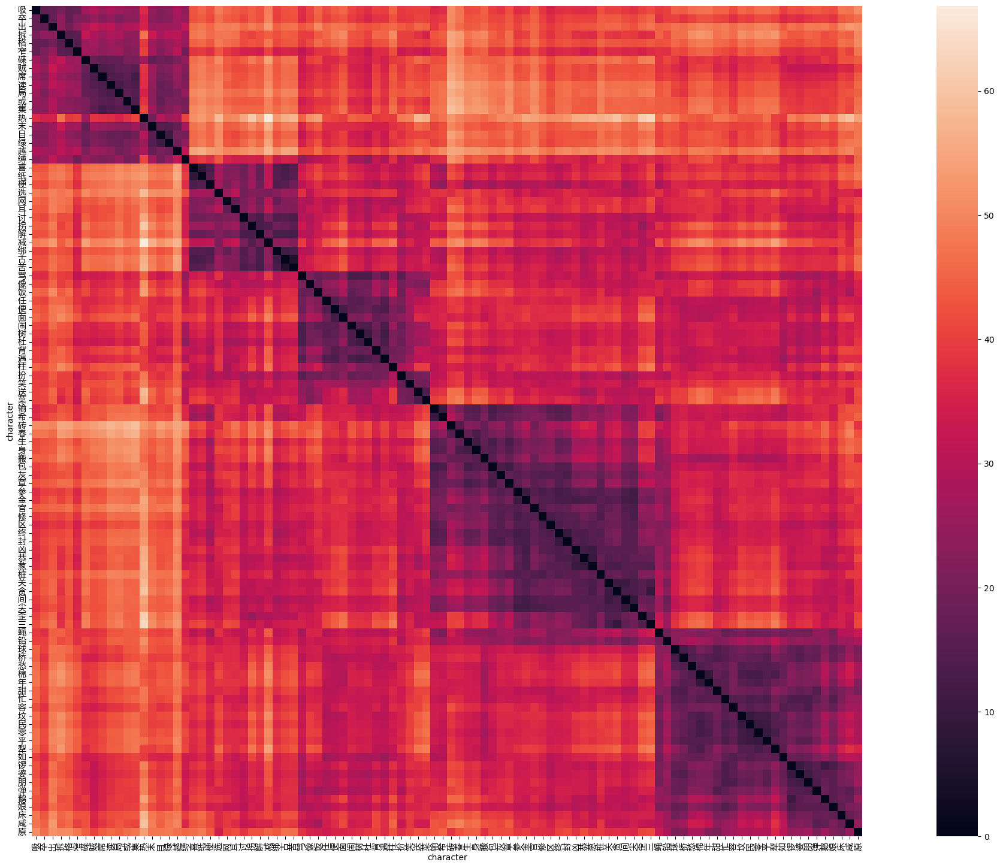

In [35]:
trans = get_trans(dialect_emb, weight)

for t in ('initial', 'final', 'tone'):
    u, s, _ = np.linalg.svd(globals()[f'{t}_emb'].T, full_matrices=False)
    m = u * s[None, :]
    a = trans @ m
    # eig_val, eig_vec = np.linalg.eig(np.tensordot(a, a, ((0, -1), (0, -1))))
    eig_val, eig_vec = np.linalg.eig(np.mean(a @ np.swapaxes(a, -1, -2), axis=0))
    emb = char_emb @ (eig_vec * np.sqrt(eig_val)[None, :])
    globals()[f'{t}_trans'] = m
    char[[f'{t}_pc1', f'{t}_pc2']] = PCA(2).fit_transform(emb)

    tree = hierarchy.linkage(emb, method='ward', optimal_ordering=True)
    leaves = hierarchy.leaves_list(tree)
    df = char.iloc[leaves]
    df = df[df['sample']]
    dist = pd.DataFrame(euclidean_distances(emb[df['idx']]), index=df['character'], columns=df['character'])

    plt.figure(figsize=(32, 18))
    plt.xticks(rotation='vertical')
    plt.yticks(rotation='horizontal')
    sns.heatmap(dist, square=True, xticklabels=True, yticklabels=True)
    plt.show()
    plt.close()

1.217800433681388

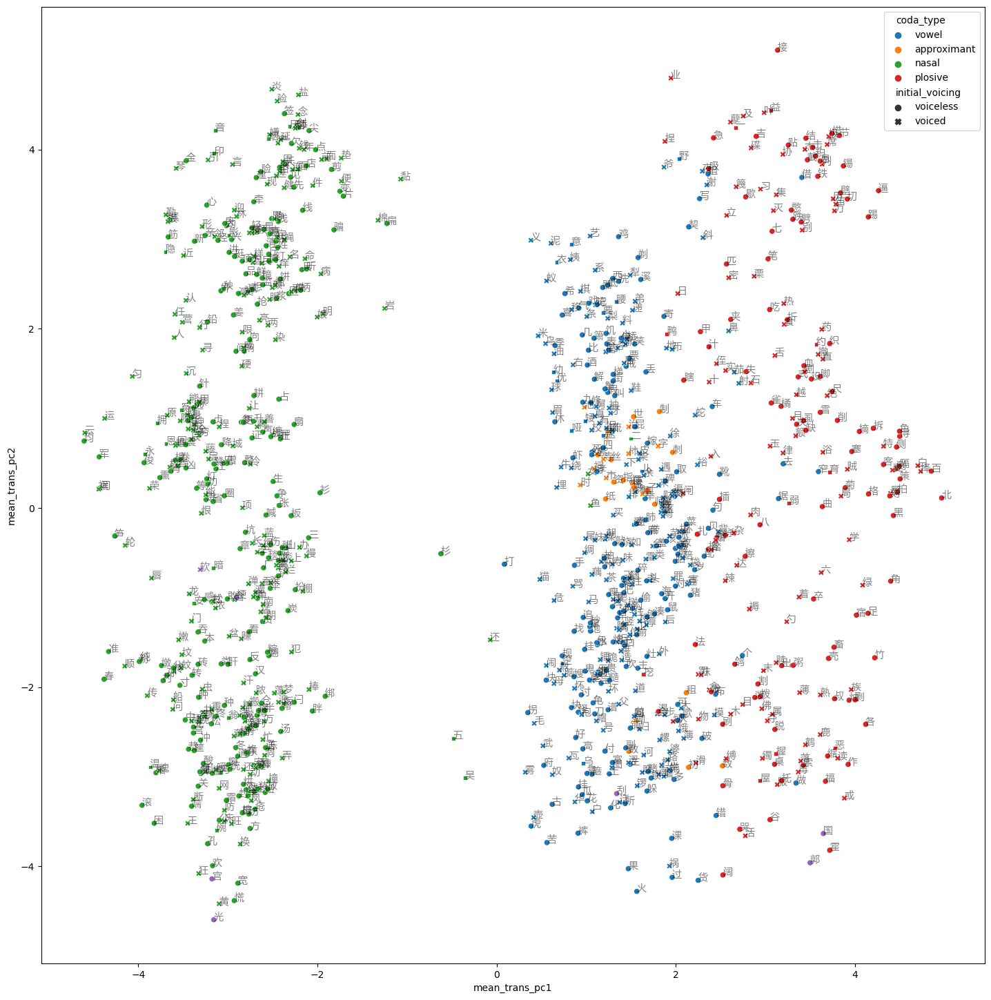

In [36]:
# mean_dialect_emb = np.mean(dialect_emb, axis=0)
mean_dialect_emb = np.mean([np.mean(e, axis=0) for e in dialect_embs], axis=0)
display(np.linalg.norm(mean_dialect_emb))

mean_trans_emb = char_emb @ get_trans(mean_dialect_emb, weight)
char[['mean_trans_pc1', 'mean_trans_pc2']] = PCA(2).fit_transform(mean_trans_emb)

plt.figure(figsize=(32, 18))
ax = plt.axes(aspect='equal')

sns.scatterplot(char, x='mean_trans_pc1', y='mean_trans_pc2', hue='coda_type', style='initial_voicing', palette='tab10', ax=ax)
for _, r in char[char['character'].notna()].iterrows():
    ax.annotate(r['character'], xy=r[['mean_trans_pc1', 'mean_trans_pc2']], alpha=0.5)

plt.show()
plt.close()

In [37]:
input_emb = get_emb(input_embs, data[input_columns])
output_emb = np.stack([get_emb((e,), data[[c]]) for e, c in zip(output_embs, output_columns)], axis=1)
trans = np.swapaxes(np.tensordot(np.linalg.pinv(input_emb), output_emb, (-1, 0)), 0, 1)

for i, t in enumerate(('initial', 'final', 'tone')):
    char[[f'trans1_{t}_pc1', f'trans1_{t}_pc2']] = globals()[f'{t}_pca'].transform(char_emb @ trans[i])

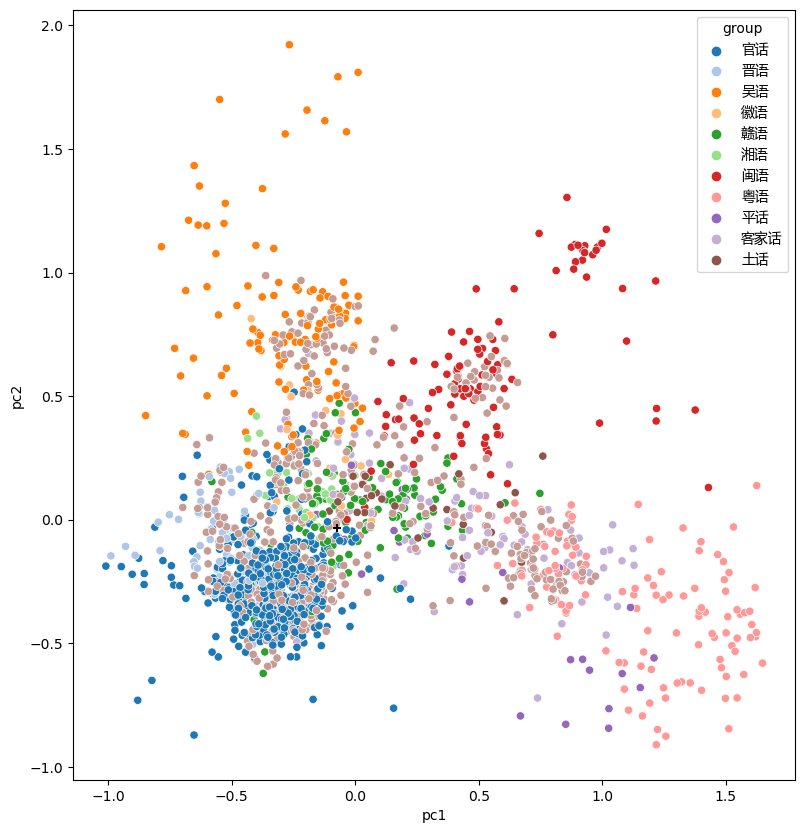

In [38]:
xtx = input_emb.T @ input_emb
ata = np.tensordot(np.tensordot(weight, xtx, [1, 0]), weight, [[1, 2], [2, 1]])
xty = input_emb.T @ np.mean(output_emb, axis=1)
atb = np.tensordot(weight, xty, [[1, 2], [0, 1]])
normal_dialect_emb = np.tensordot(np.linalg.inv(ata), atb, [-1, 0])
pc = dialect_pca.transform([normal_dialect_emb])

plt.figure(figsize=(10, 10))
ax = plt.axes(aspect='equal')
sns.scatterplot(dialect, x='pc1', y='pc2', hue='group', palette='tab20', ax=ax)
ax.scatter(pc[:, 0], pc[:, 1], color='black', marker='+')
plt.show()
plt.close()

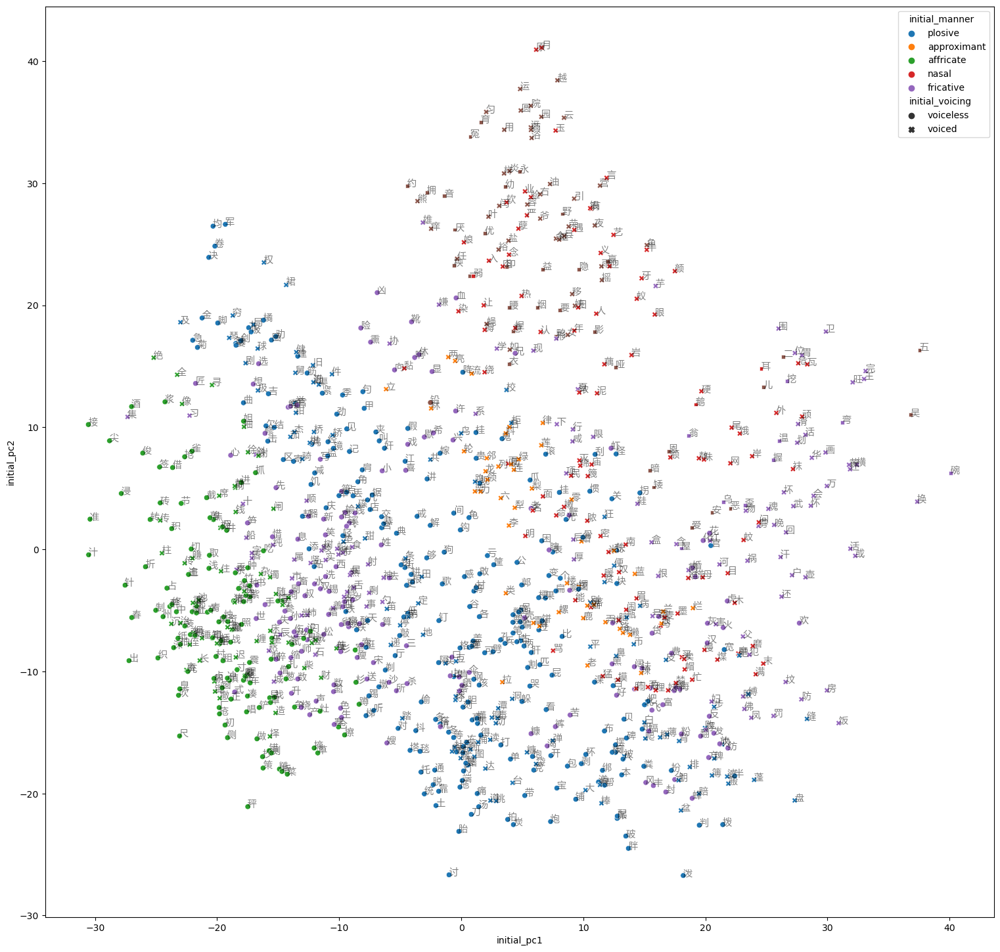

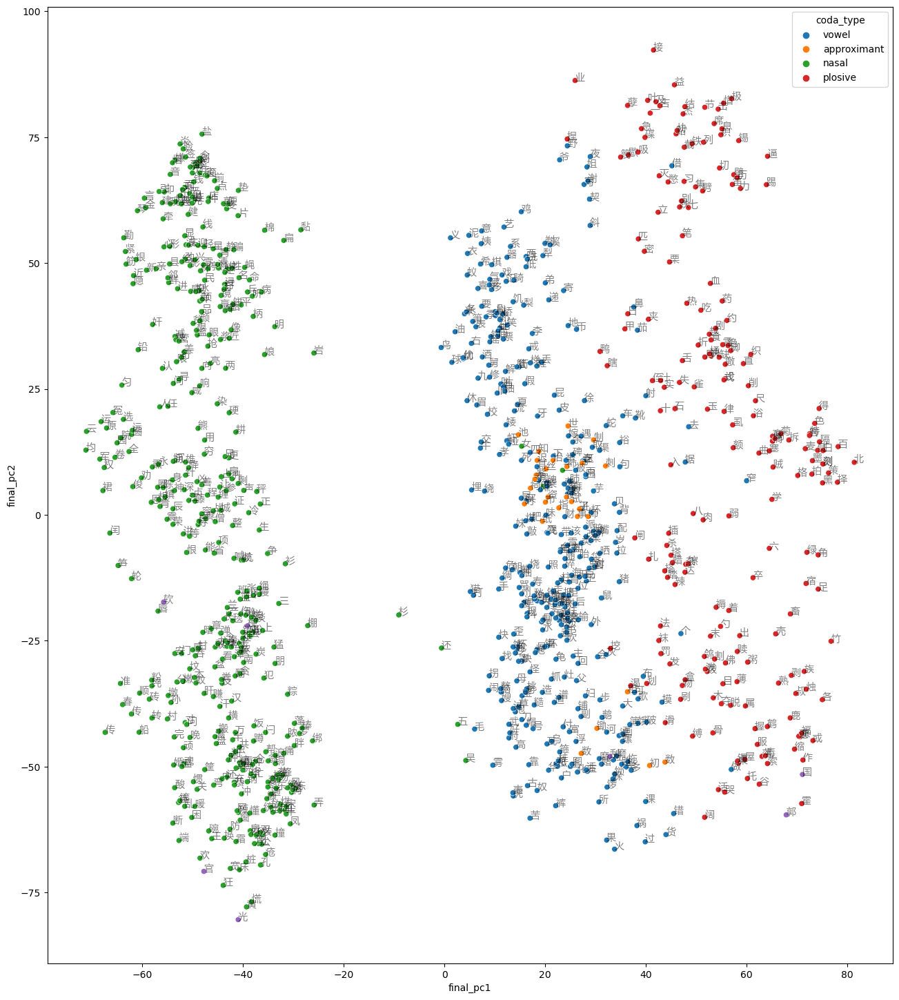

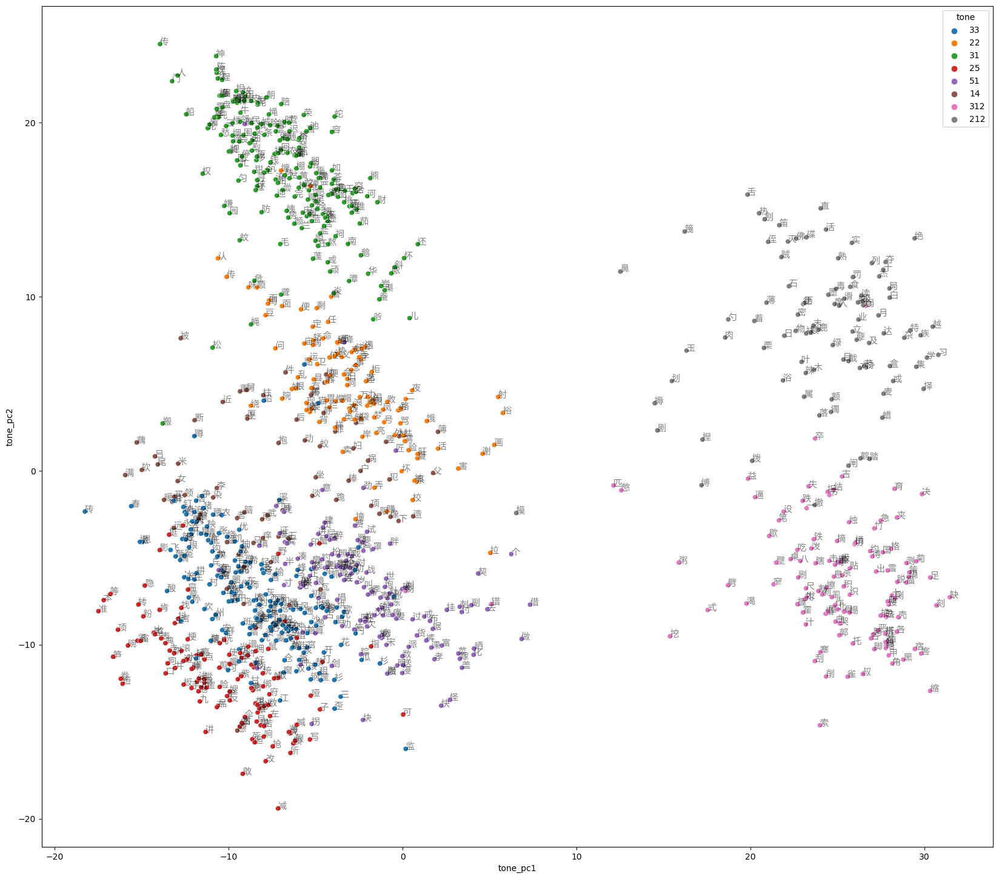

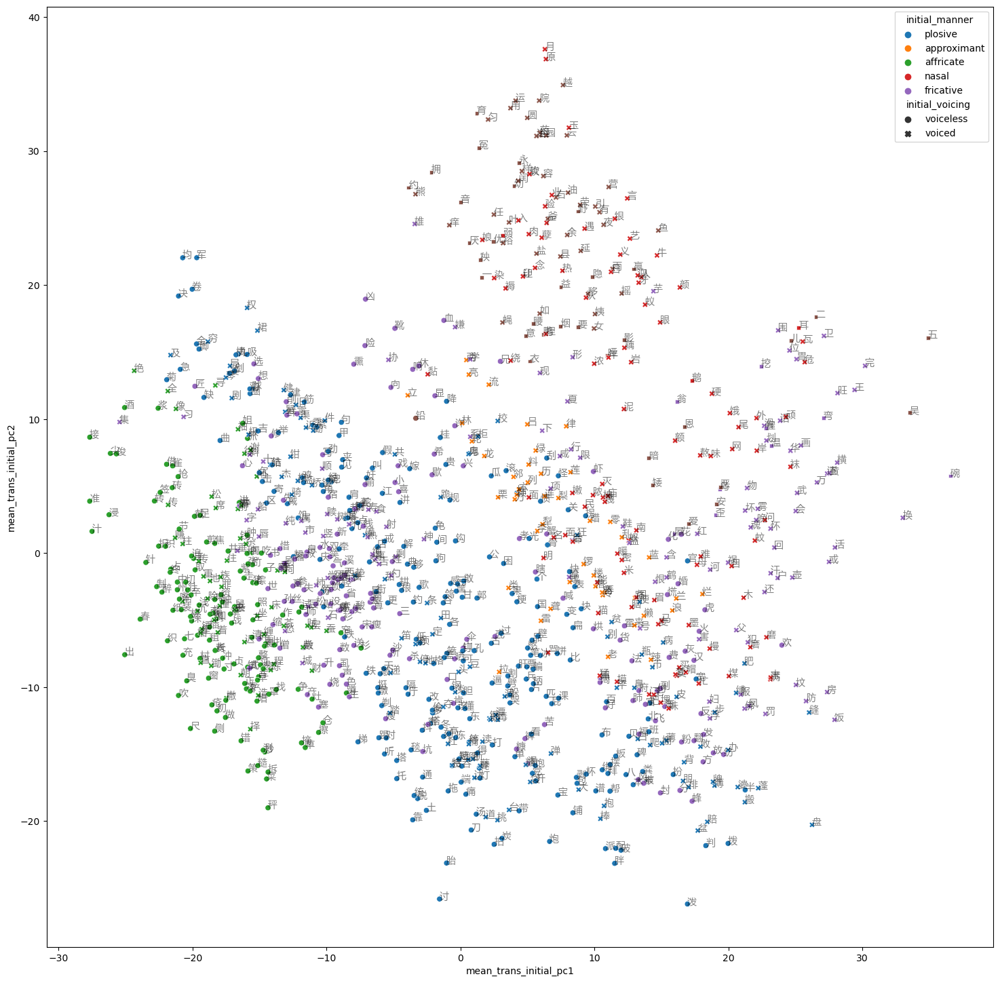

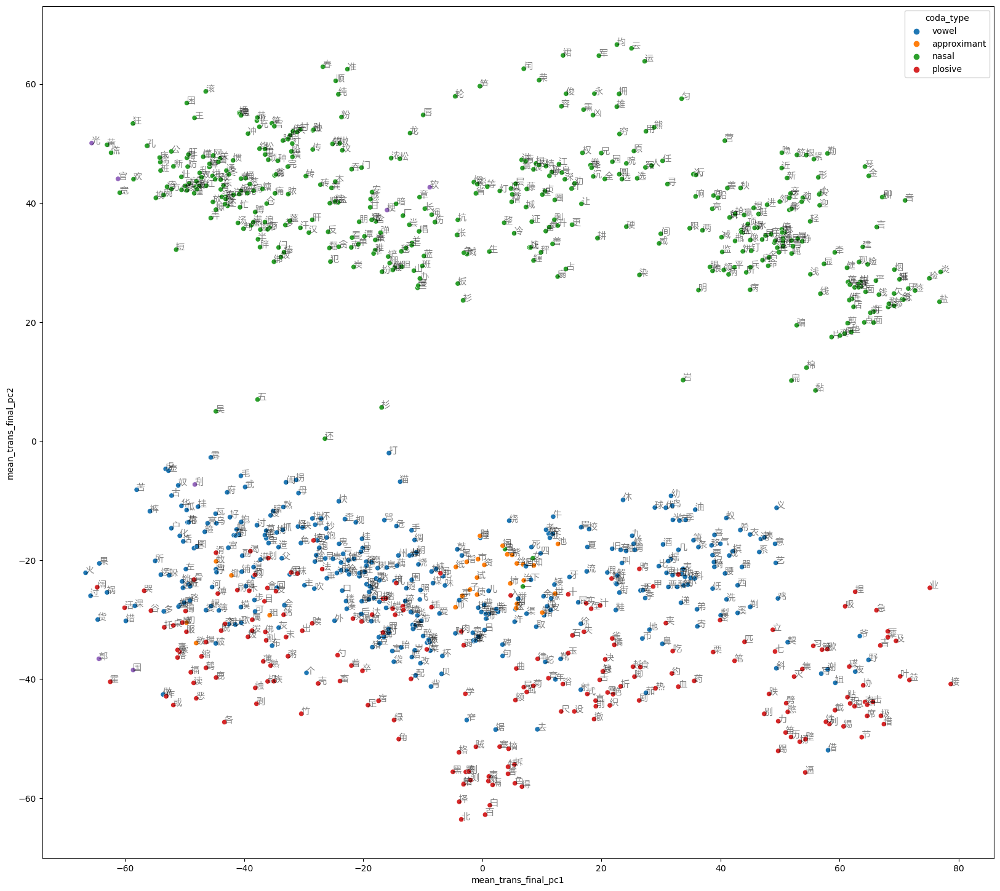

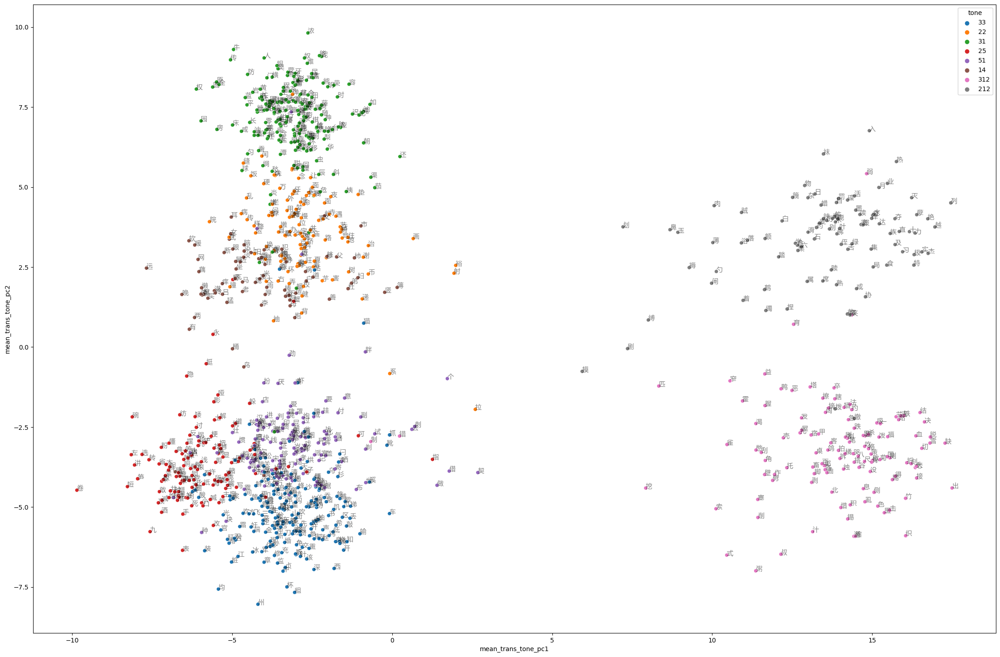

In [39]:
for t in ('initial', 'final', 'tone'):
    # char[[f'{t}_pc1', f'{t}_pc2']] = globals()[f'{t}_pca'].transform(char_emb)
    # char[[f'mean_trans_{t}_pc1', f'mean_trans_{t}_pc2']] = globals()[f'{t}_pca'].transform(mean_trans_emb)
    char[[f'mean_trans_{t}_pc1', f'mean_trans_{t}_pc2']] = PCA(2).fit_transform(mean_trans_emb @ globals()[f'{t}_trans'])

for prefix in ('', 'mean_trans_'):
    plt.figure(figsize=(32, 18))
    ax = plt.axes(aspect='equal')

    sns.scatterplot(
        char,
        x=f'{prefix}initial_pc1',
        y=f'{prefix}initial_pc2',
        hue='initial_manner',
        style='initial_voicing',
        palette='tab10',
        ax=ax
    )
    for _, r in char[char['character'].notna()].iterrows():
        ax.annotate(r['character'], xy=r[[f'{prefix}initial_pc1', f'{prefix}initial_pc2']], alpha=0.5)

    plt.show()
    plt.close()

    plt.figure(figsize=(32, 18))
    ax = plt.axes(aspect='equal')

    sns.scatterplot(
        char,
        x=f'{prefix}final_pc1',
        y=f'{prefix}final_pc2',
        hue='coda_type',
        palette='tab10',
        ax=ax
    )
    for _, r in char[char['character'].notna()].iterrows():
        ax.annotate(r['character'], xy=r[[f'{prefix}final_pc1', f'{prefix}final_pc2']], alpha=0.5)

    plt.show()
    plt.close()

    plt.figure(figsize=(32, 18))
    ax = plt.axes(aspect='equal')

    sns.scatterplot(
        char,
        x=f'{prefix}tone_pc1',
        y=f'{prefix}tone_pc2',
        hue='tone',
        palette='tab10',
        ax=ax
    )
    for _, r in char[char['character'].notna()].iterrows():
        ax.annotate(r['character'], xy=r[[f'{prefix}tone_pc1', f'{prefix}tone_pc2']], alpha=0.5)

    plt.show()
    plt.close()

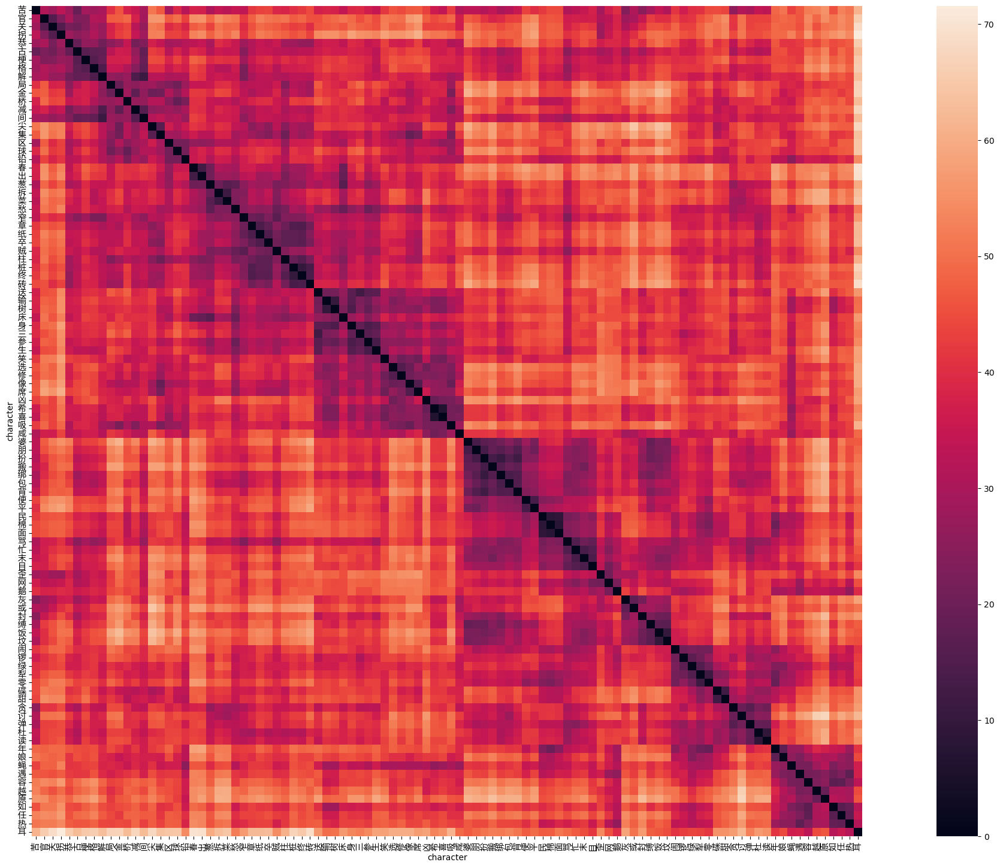

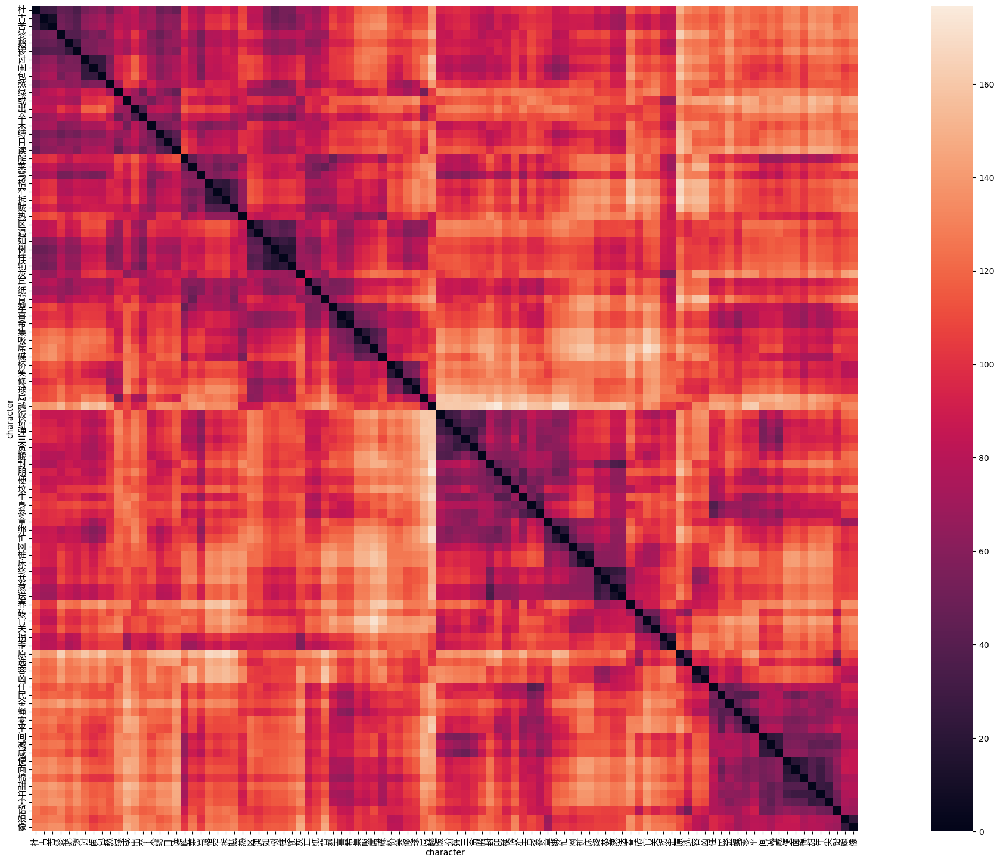

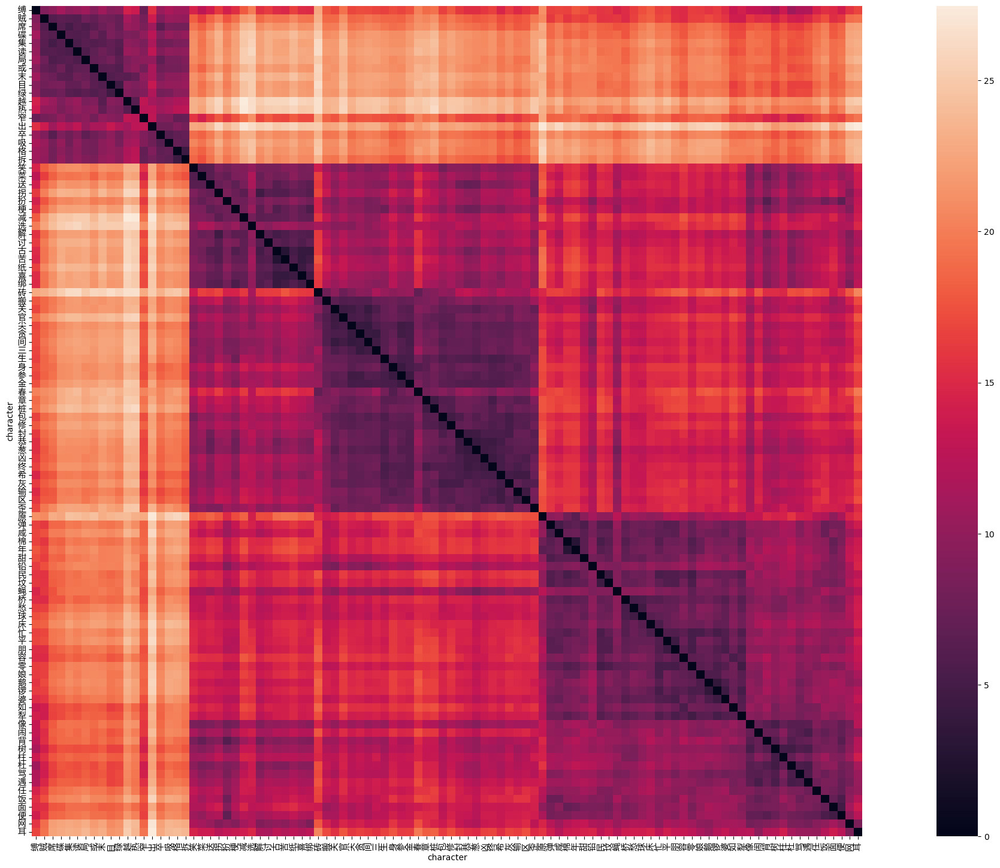

In [40]:
for e in (initial_emb, final_emb, tone_emb):
    u, s, _ = np.linalg.svd(e.T, full_matrices=False)
    emb = char_emb @ get_trans(mean_dialect_emb, weight) @ (u * s[None, :])

    tree = hierarchy.linkage(emb, method='ward', optimal_ordering=True)
    leaves = hierarchy.leaves_list(tree)
    df = char.iloc[leaves]
    df = df[df['sample']]
    dist = pd.DataFrame(euclidean_distances(emb[df['idx']]), index=df['character'], columns=df['character'])

    plt.figure(figsize=(32, 18))
    plt.xticks(rotation='vertical')
    plt.yticks(rotation='horizontal')
    sns.heatmap(dist, square=True, xticklabels=True, yticklabels=True)
    plt.show()
    plt.close()

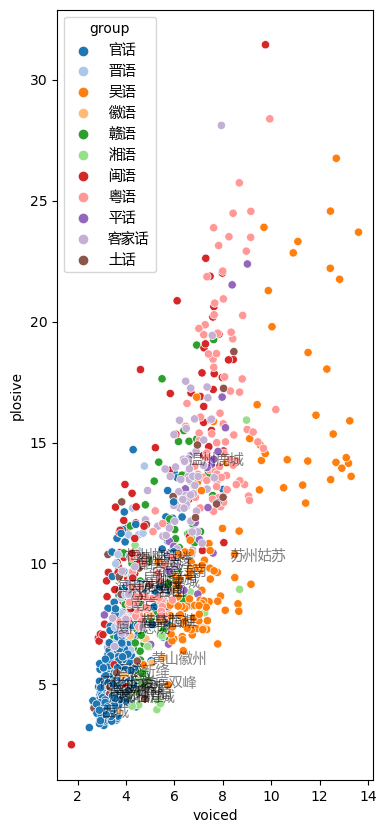

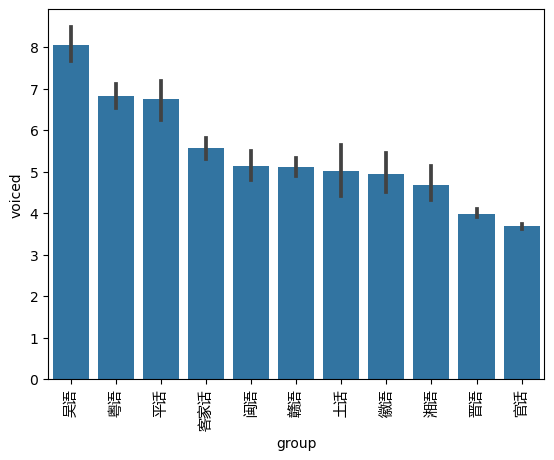

In [41]:
trans = get_trans(dialect_emb, weight)
w = normalize([voiced_svc.coef_[0], plosive_svc.coef_[0]])
voiced_char_dir, plosive_char_dir = w
dialect[['voiced', 'plosive']] = np.linalg.norm(np.tensordot(trans, w, [1, 1]), axis=1)

plt.figure(figsize=(10, 10))
ax = plt.axes(aspect='equal')
sns.scatterplot(dialect[dialect['group'] != ''], x='voiced', y='plosive', hue='group', palette='tab20', ax=ax)
for _, r in dialect[dialect['representative']].iterrows():
    ax.annotate(r['spot'], xy=r[['voiced', 'plosive']], alpha=0.5)
plt.show()
plt.close()

sns.barplot(
    data=dialect[dialect['group'] != ''],
    x='group',
    y='voiced',
    order=dialect[dialect['group'] != ''].groupby('group')['voiced'].mean().sort_values(ascending=False).index,
    color='tab:blue'
)
plt.xticks(rotation='vertical')
plt.show()
plt.close()

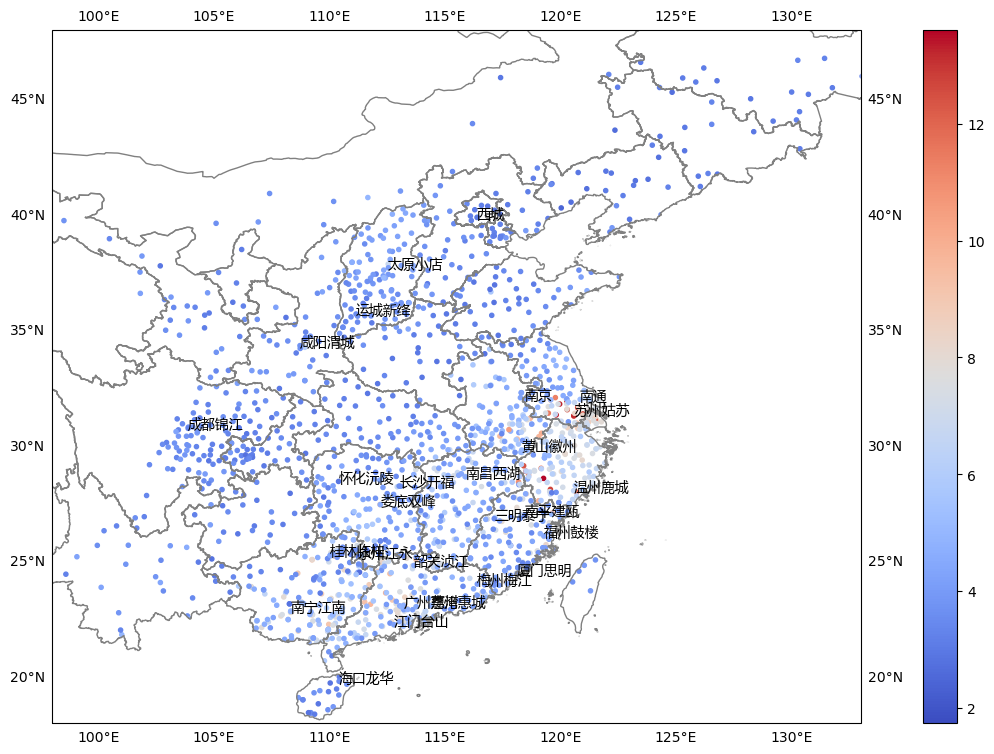

In [42]:
plt.figure(figsize=(16, 9))
ax, _, cs = sinetym.plot.geography.scatter(
    dialect['latitude'],
    dialect['longitude'],
    dialect['voiced'],
    extent=extent,
    scale=3,
    clip=china,
    marker='.',
    cmap='coolwarm'
)
ax.add_geometries(province, ax.projection, edgecolor='gray', facecolor='none')

for _, r in dialect[dialect['representative']].iterrows():
    ax.annotate(r['spot'], xy=r[['longitude', 'latitude']])

gl = ax.gridlines(draw_labels=True)
gl.xlines = False
gl.ylines = False
plt.colorbar(cs)
plt.show()
plt.close()

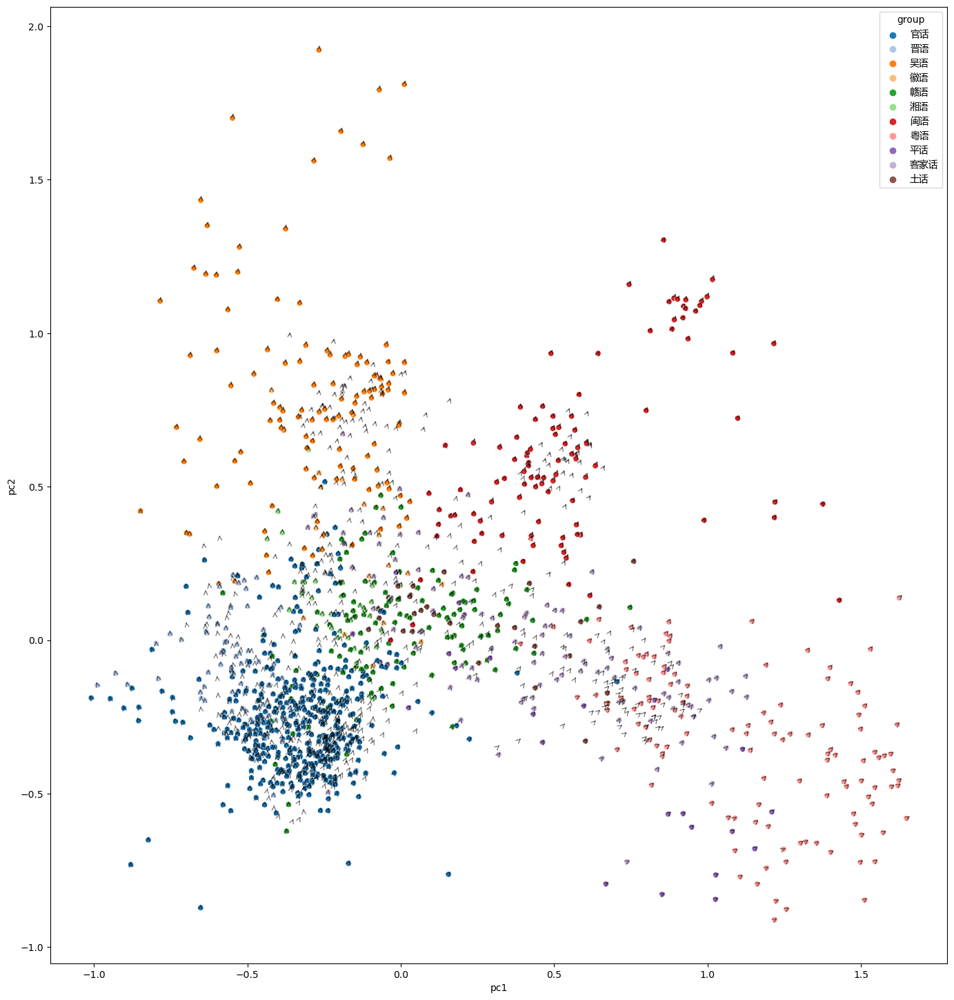

In [43]:
w = np.tensordot(weight, voiced_char_dir, [1, 0])
voiced_dialect_dir = (dialect_emb @ w + voiced_char_dir) @ w.T
voiced_dialect_dir /= np.linalg.norm(voiced_dialect_dir, axis=1, keepdims=True)

pc = dialect_pca.transform(dialect_emb + 0.05 * voiced_dialect_dir)

plt.figure(figsize=(32, 18))
ax = plt.axes(aspect='equal')
sns.scatterplot(dialect[dialect['group'] != ''], x='pc1', y='pc2', hue='group', palette='tab20', ax=ax)
for i, (_, r) in enumerate(dialect.iterrows()):
    ax.annotate('', xy=pc[i, :2], xytext=r[['pc1', 'pc2']], arrowprops={'arrowstyle': '->', 'alpha': 0.5})
plt.show()
plt.close()

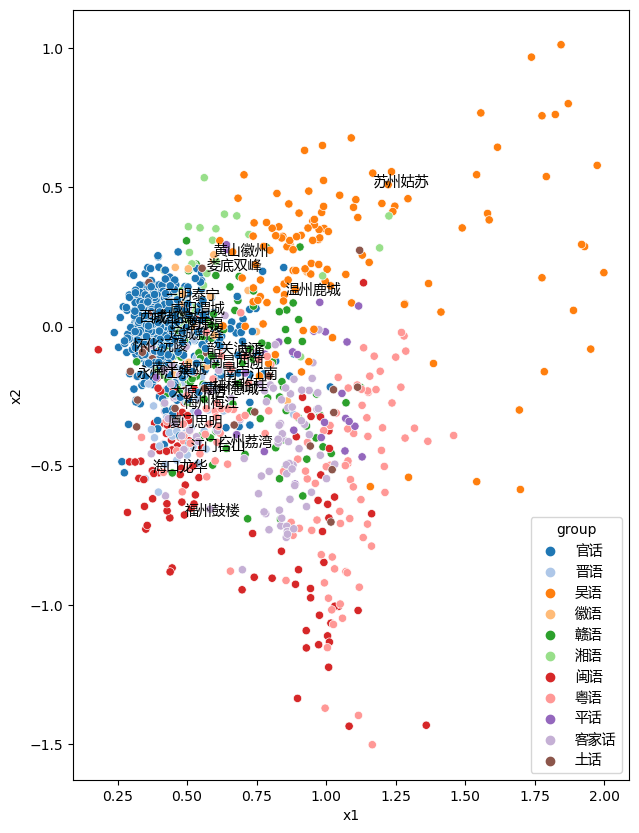

In [44]:
lr = LinearRegression().fit(dialect_emb, dialect[['voiced', 'plosive']])
q, _ = np.linalg.qr(np.stack(lr.coef_, axis=1))

dialect[['x1', 'x2']] = dialect_emb @ q

plt.figure(figsize=(10, 10))
ax = plt.axes(aspect='equal')

sns.scatterplot(dialect[dialect['group'] != ''], x='x1', y='x2', hue='group', palette='tab20', ax=ax)
for _, r in dialect[dialect['representative']].iterrows():
    ax.annotate(r['spot'], xy=r[['x1', 'x2']])

plt.show()
plt.close()

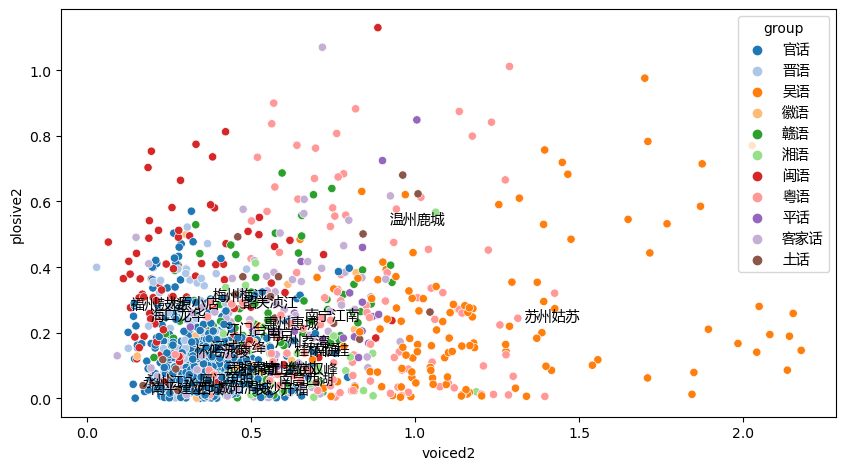

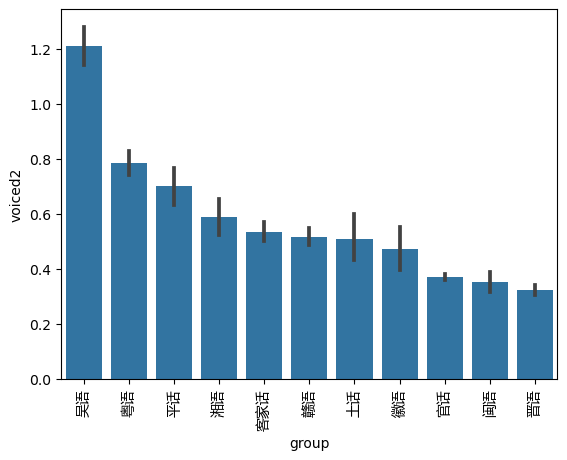

In [45]:
y = np.tensordot(weight, voiced_char_dir, [1, 0])
a = y @ y.T
s, q = np.linalg.eig(a)
voiced_dialect_dir = q[:, np.argmax(s)]
voiced_dialect_dir /= np.linalg.norm(voiced_dialect_dir)
dialect['voiced2'] = np.abs(np.tensordot(dialect_emb, voiced_dialect_dir, [-1, 0]))

y = np.tensordot(weight, plosive_char_dir, [1, 0])
a = y @ y.T
s, q = np.linalg.eig(a)
plosive_dialect_dir = q[:, np.argmax(s)]
plosive_dialect_dir /= np.linalg.norm(plosive_dialect_dir)
dialect['plosive2'] = np.abs(np.tensordot(dialect_emb, plosive_dialect_dir, [-1, 0]))

plt.figure(figsize=(10, 10))
ax = plt.axes(aspect='equal')
sns.scatterplot(dialect[dialect['group'] != ''], x='voiced2', y='plosive2', hue='group', palette='tab20', ax=ax)
for _, r in dialect[dialect['representative']].iterrows():
    ax.annotate(r['spot'], xy=r[['voiced2', 'plosive2']])
plt.show()
plt.close()

sns.barplot(
    data=dialect[dialect['group'] != ''],
    x='group',
    y='voiced2',
    order=dialect[dialect['group'] != ''].groupby('group')['voiced2'].mean().sort_values(ascending=False).index,
    color='tab:blue'
)
plt.xticks(rotation='vertical')
plt.show()
plt.close()

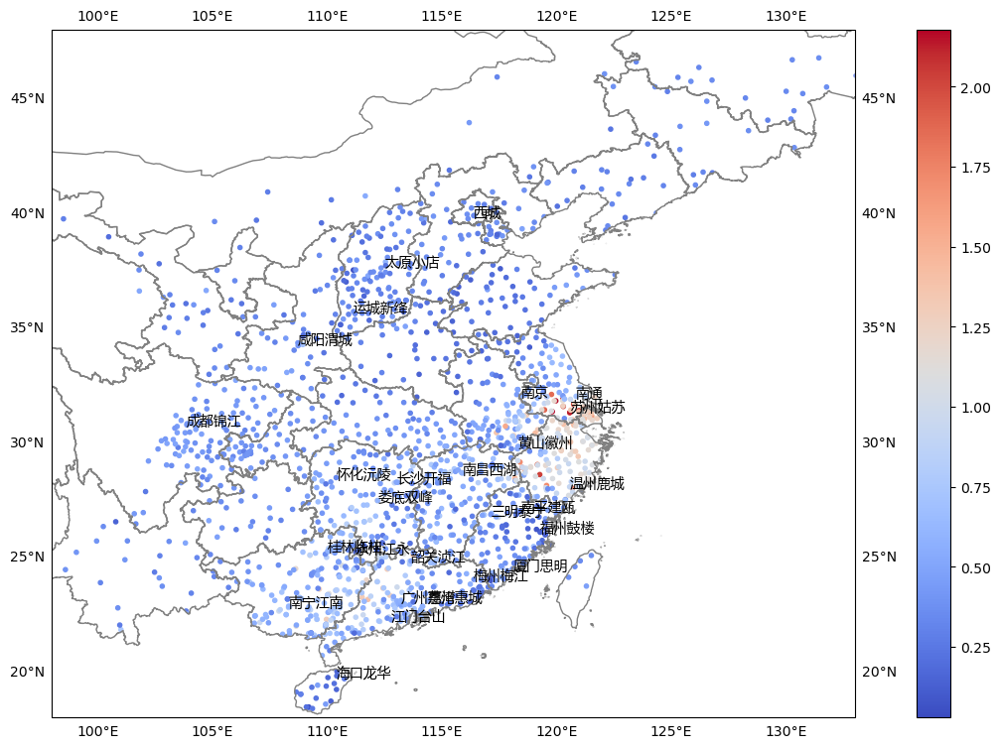

In [46]:
plt.figure(figsize=(16, 9))
ax, _, cs = sinetym.plot.geography.scatter(
    dialect['latitude'],
    dialect['longitude'],
    dialect['voiced2'],
    extent=extent,
    scale=3,
    clip=china,
    marker='.',
    cmap='coolwarm'
)
ax.add_geometries(province, ax.projection, edgecolor='gray', facecolor='none')

for _, r in dialect[dialect['representative']].iterrows():
    ax.annotate(r['spot'], xy=r[['longitude', 'latitude']])

gl = ax.gridlines(draw_labels=True)
gl.xlines = False
gl.ylines = False
plt.colorbar(cs)
plt.show()
plt.close()

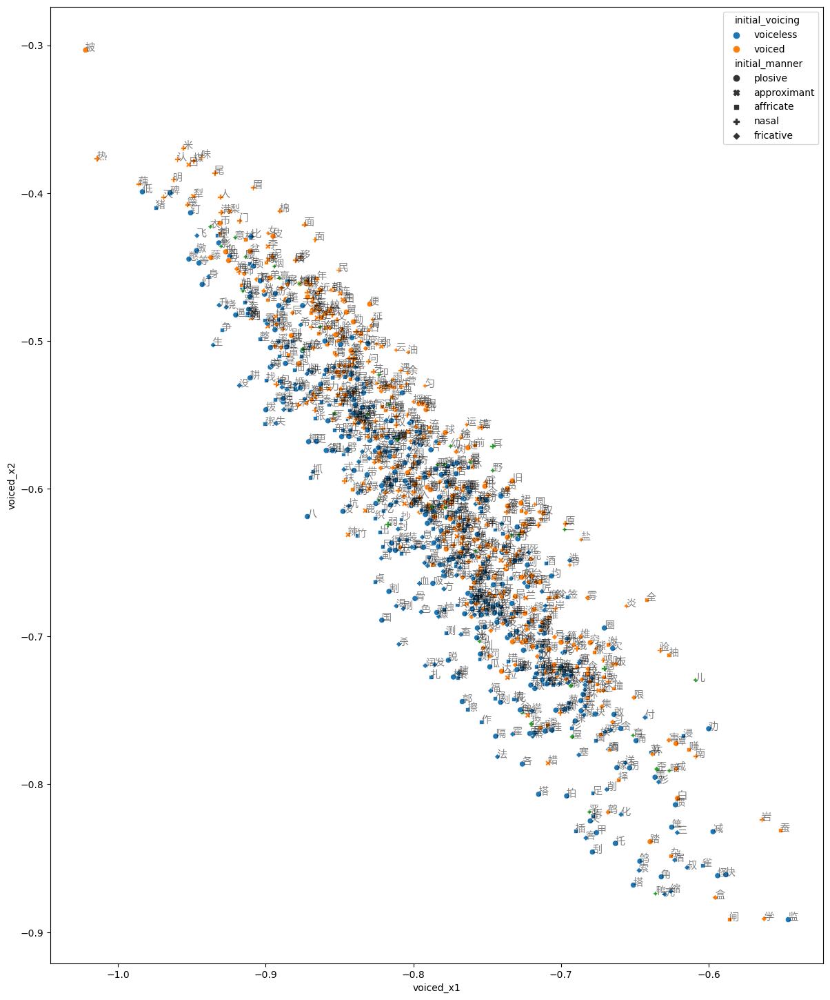

In [47]:
voiced_trans = get_trans(voiced_dialect_dir, weight)
s, q = np.linalg.eig(voiced_trans @ voiced_trans.T)
char[['voiced_x1', 'voiced_x2']] = (char_emb @ np.take(q, np.argsort(s)[::-1][:2], axis=-1))

plt.figure(figsize=(32, 18))
ax = plt.axes(aspect='equal')

sns.scatterplot(char, x='voiced_x1', y='voiced_x2', hue='initial_voicing', style='initial_manner', palette='tab10', ax=ax)
for _, r in char[char['character'].notna()].iterrows():
    ax.annotate(r['character'], xy=r[['voiced_x1', 'voiced_x2']], alpha=0.5)

plt.show()
plt.close()

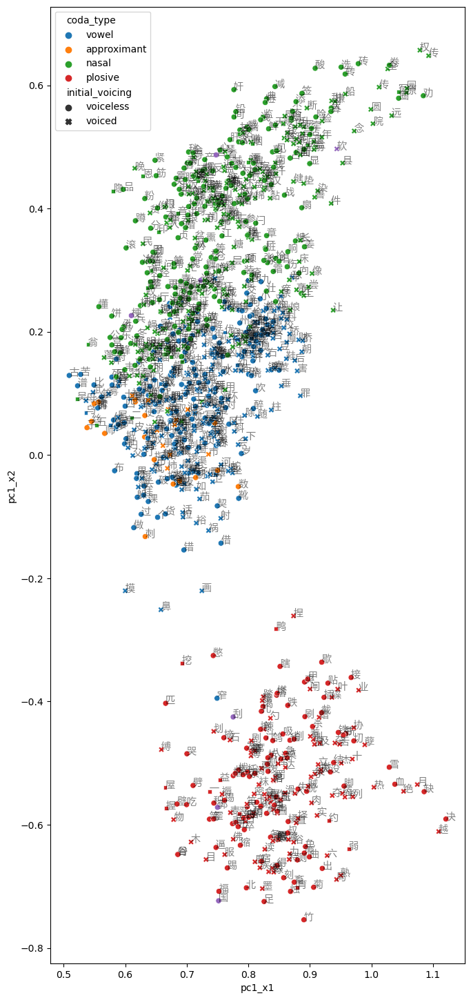

In [48]:
trans = get_trans(dialect_pca.components_[0], weight)
s, q = np.linalg.eig(trans @ trans.T)
char[['pc1_x1', 'pc1_x2']] = (char_emb @ np.take(q, np.argsort(s)[::-1][:2], axis=-1))

plt.figure(figsize=(32, 18))
ax = plt.axes(aspect='equal')

sns.scatterplot(char, x='pc1_x1', y='pc1_x2', hue='coda_type', style='initial_voicing', palette='tab10', ax=ax)
for _, r in char[char['character'].notna()].iterrows():
    ax.annotate(r['character'], xy=r[['pc1_x1', 'pc1_x2']], alpha=0.5)

plt.show()
plt.close()

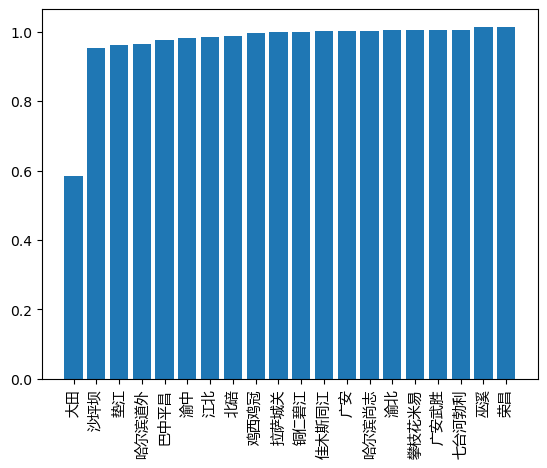

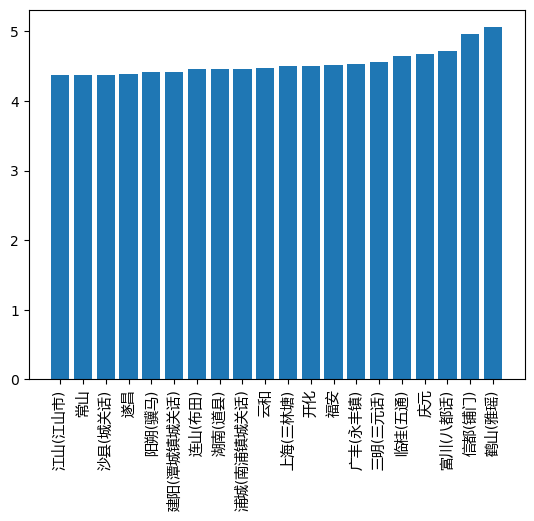

In [49]:
dialect['dist'] = np.linalg.norm(dialect_emb - mean_dialect_emb[None, :], axis=1)
dialect_sort = dialect.sort_values('dist')

plt.bar(dialect_sort[:20].index, dialect_sort[:20]['dist'], tick_label=dialect_sort[:20]['spot'])
plt.xticks(rotation='vertical')
plt.show()
plt.close()

plt.bar(dialect_sort[-20:].index, dialect_sort[-20:]['dist'], tick_label=dialect_sort[-20:]['spot'])
plt.xticks(rotation='vertical')
plt.show()
plt.close()

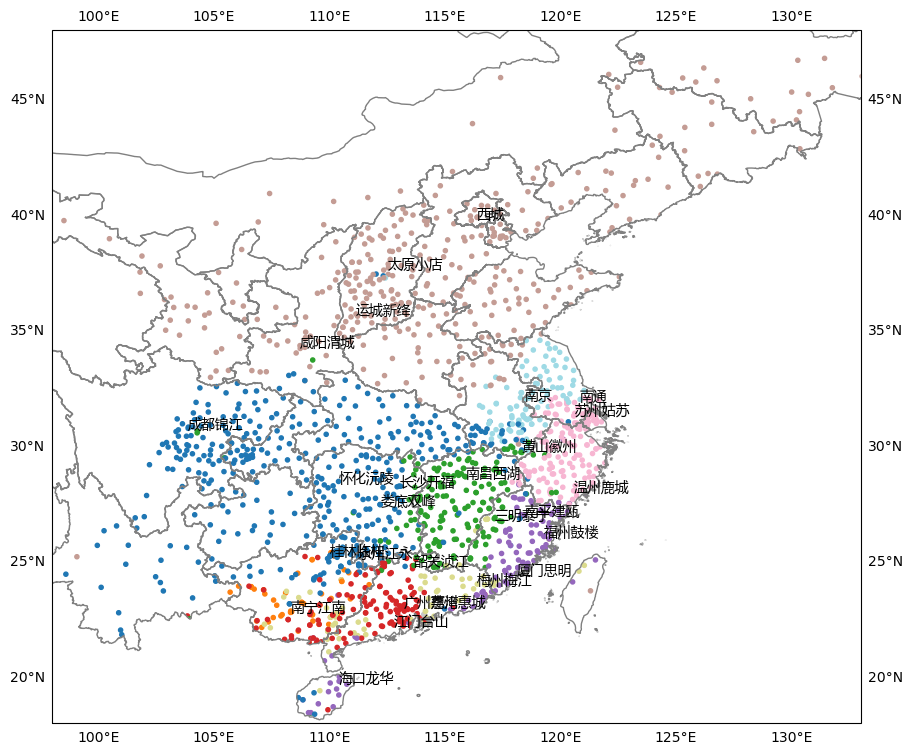

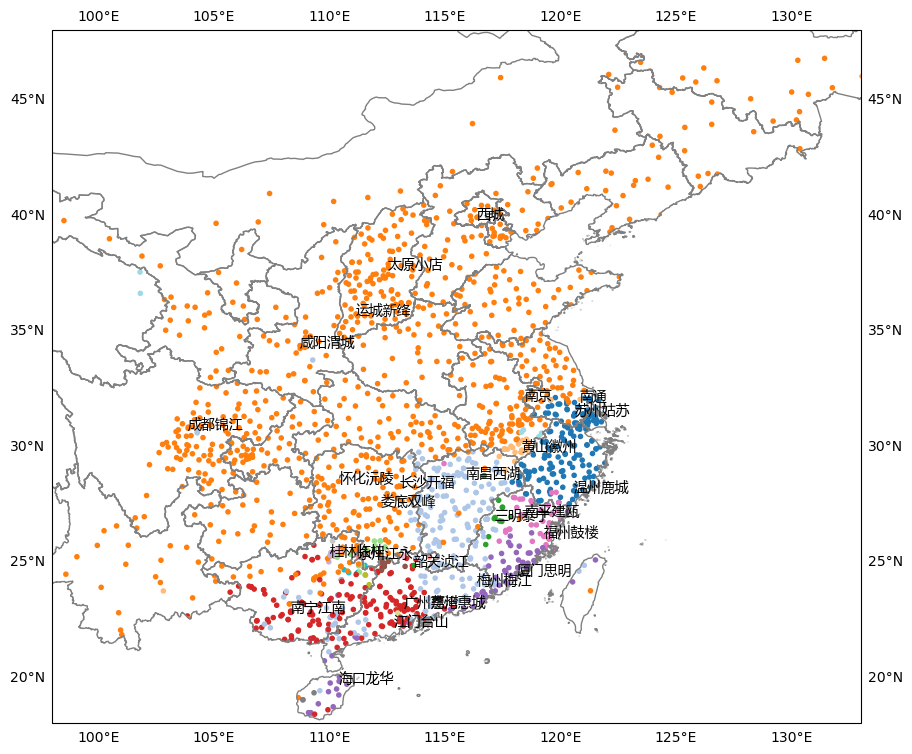

In [50]:
dialect['cluster1'] = KMeans(10, n_init='auto').fit_predict(dialect_emb)
dialect['cluster2'] = AgglomerativeClustering(20, metric='cosine', linkage='average').fit_predict(dialect_emb)

for c in ('cluster1', 'cluster2'):
    plt.figure(figsize=(16, 9))
    ax, _, _ = sinetym.plot.geography.scatter(
        dialect['latitude'],
        dialect['longitude'],
        dialect[c],
        extent=extent,
        scale=3,
        clip=china,
        marker='.',
        cmap='tab20'
    )
    ax.add_geometries(province, ax.projection, edgecolor='gray', facecolor='none')

    for _, r in dialect[dialect['representative']].iterrows():
        ax.annotate(r['spot'], xy=r[['longitude', 'latitude']])

    gl = ax.gridlines(draw_labels=True)
    gl.xlines = False
    gl.ylines = False
    plt.show()
    plt.close()

In [51]:
input_mean = np.mean(char_emb, axis=0)
s = char_emb - input_mean[None, :]
input_cov = s.T @ s / (s.shape[0] - 1)

trans = get_trans(dialect_emb[dialect.loc[dialect['sample'], 'idx']], weight)
wtw_eig_val, wtw_eig_vec = np.linalg.eig(trans @ np.swapaxes(trans, -1, -2))
trans2 = wtw_eig_vec * np.sqrt(np.maximum(wtw_eig_val, 0))[:, None, :] @ np.swapaxes(wtw_eig_vec, -1, -2)

d = trans2[:, None, ...] - trans2[None, :, ...]
a = np.swapaxes(d, -1, -2) @ d
a_eig_val, a_eig_vec = np.linalg.eig(a)
b = a_eig_vec * np.sqrt(np.maximum(a_eig_val, 0))[:, :, None, :]
cov = np.swapaxes(b, -1, -2) @ np.swapaxes(np.tensordot(b, input_cov, [2, 0]), -1, -2)
dist = np.sum(np.linalg.eigvals(cov), axis=-1) \
    + np.tensordot(np.tensordot(input_mean, a, [-1, 2]), input_mean, [-1, -1])

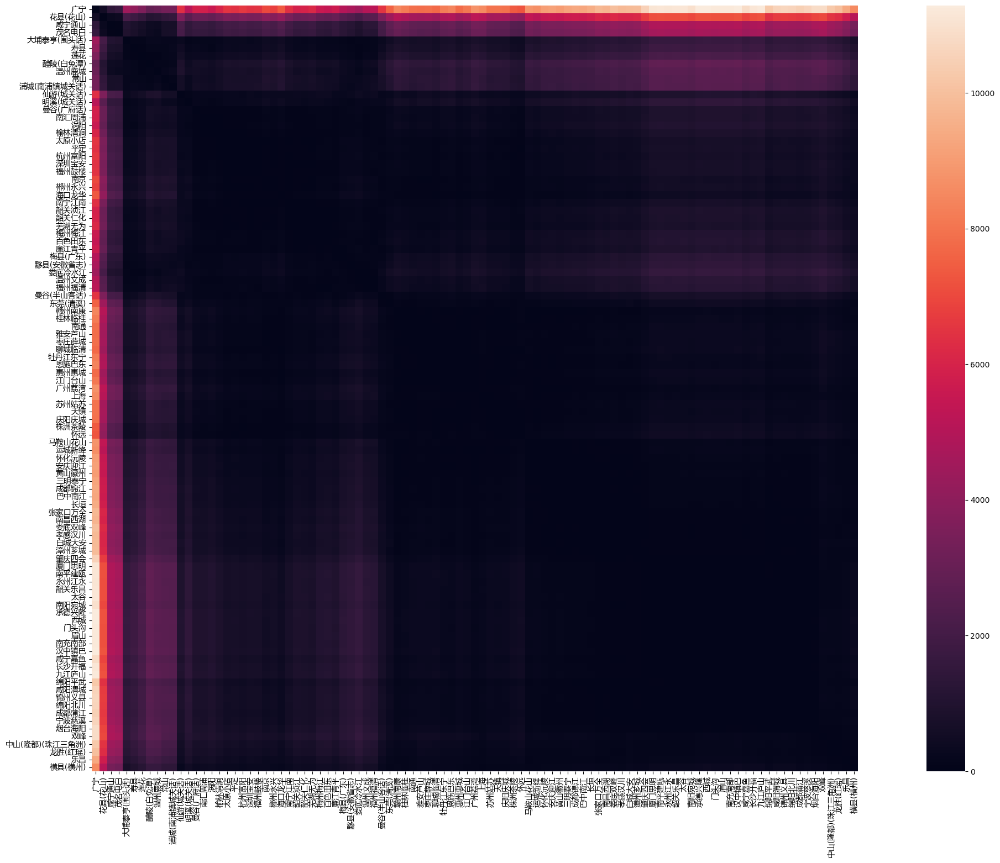

In [52]:
plt.figure(figsize=(32, 18))
plt.xticks(rotation='vertical')
plt.yticks(rotation='horizontal')
sinetym.plot.heatmap(dist, dialect.loc[dialect['sample'], 'spot'])
plt.show()
plt.close()

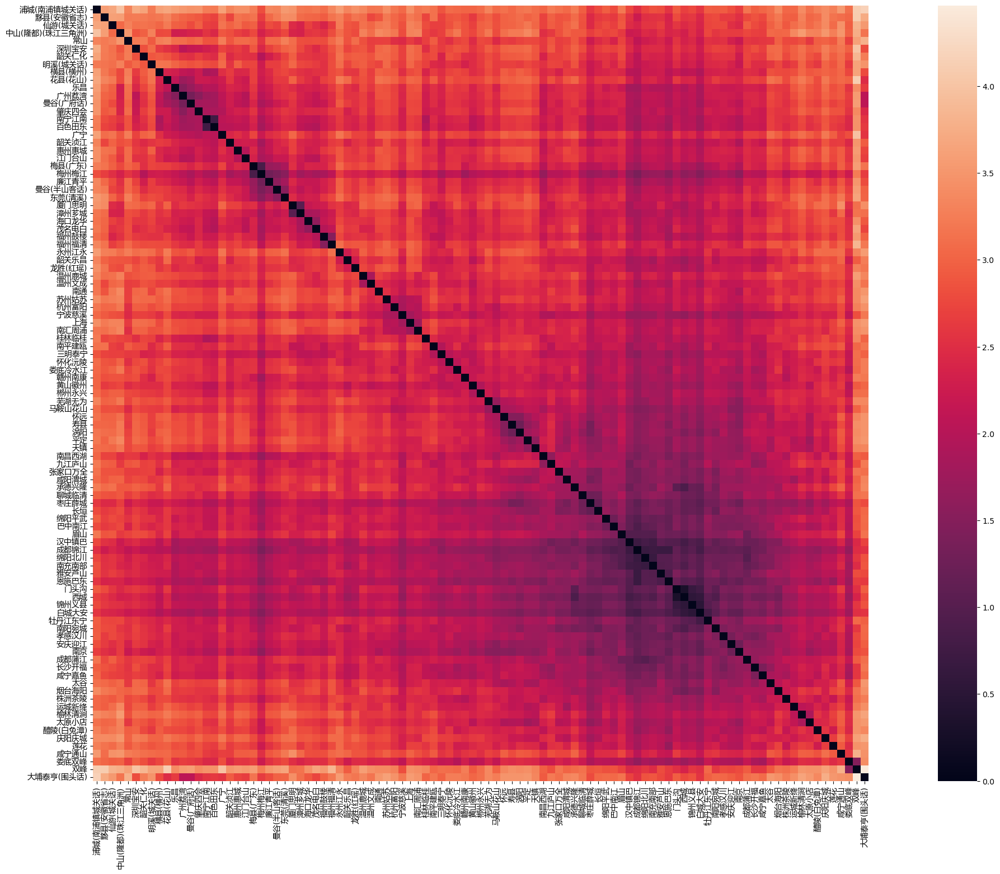

In [53]:
trans = get_trans(dialect_emb[dialect.loc[dialect['sample'], 'idx']], weight)
inv = np.linalg.inv(trans)
_, s, _ = np.linalg.svd(trans[:, None, ...] @ inv[None, :, ...])
dist = np.var(np.log(s), axis=-1)

plt.figure(figsize=(32, 18))
plt.xticks(rotation='vertical')
plt.yticks(rotation='horizontal')
sinetym.plot.heatmap(dist, dialect.loc[dialect['sample'], 'spot'])
plt.show()
plt.close()

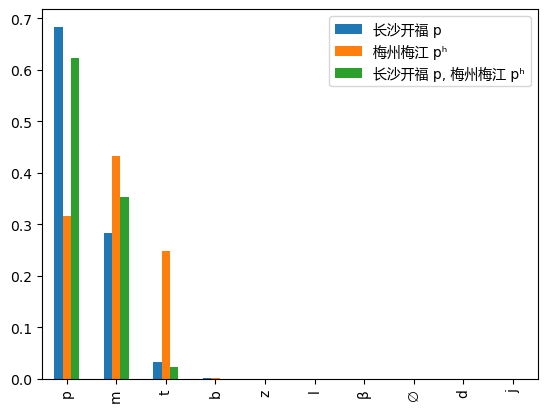

In [54]:
idx = ['Z26516', 'Z15233', 'Z10G71']
demb = np.repeat(get_emb(dialect_embs, dialect.loc[idx, dialect_columns]), char_emb.shape[0], axis=0)
cemb = np.tile(char_emb, (3, 1))
oemb = transform(demb, cemb, weight)
prob = get_prob(output_embs, oemb)[0].set_index(pd.MultiIndex.from_product((idx, char.index)))
df = prob.stack().unstack(1).loc[[('Z26516', 'p'), ('Z15233', 'pʰ')]] @ prob.loc['Z10G71']
df.set_index(dialect.loc[df.index.get_level_values(0), 'spot'].values + ' ' + df.index.get_level_values(1), inplace=True)
df.loc[', '.join(df.index)] = df.prod(axis=0)
df.loc[:, :] = normalize(df, norm='l1')

df.T.sort_values(df.index[-1], ascending=False)[:10].plot.bar()
plt.show()
plt.close()

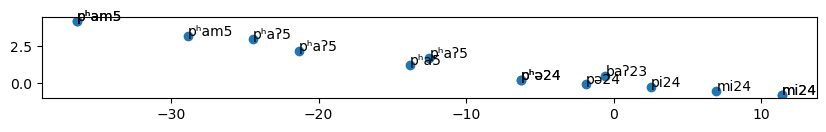

In [55]:
demb = get_emb(dialect_embs, dialect.loc[idx, dialect_columns])
demb = np.concatenate([
    np.linspace(demb[0], demb[1], 5),
    np.linspace(demb[1], demb[2], 5),
    np.linspace(demb[2], demb[0], 5)
], axis=0)
output_emb = transform(
    demb,
    np.repeat(get_emb(input_embs, char.loc[['Z0843'], input_columns]), demb.shape[0], axis=0),
    weight
)
outputs = get_output(output_embs, output_emb)
pc = output_pca.transform(output_emb)

plt.figure(figsize=(10, 10))
ax = plt.axes(aspect='equal')

ax.scatter(x=pc[:, 0], y=pc[:, 1])
for i in range(outputs.shape[0]):
    ax.annotate(''.join(outputs[i]), xy=pc[i, :2])

plt.show()
plt.close()

In [56]:
dist = euclidean_distances(dialect_emb[dialect.loc[dialect['representative'], 'idx']], dialect_emb)
idx = np.argsort(dist, axis=1)[:, 1:11]
pyperclip.copy(pd.DataFrame(
    np.where(dialect['spot'] != '', dialect['spot'], dialect['did'])[idx],
    index=dialect.loc[dialect['representative'], 'spot'].rename('方言'),
    columns=np.arange(1, 11)
).to_markdown())
display_markdown(pyperclip.paste(), raw=True)

| 方言     | 1        | 2            | 3          | 4        | 5          | 6        | 7            | 8          | 9          | 10         |
|:---------|:---------|:-------------|:-----------|:---------|:-----------|:---------|:-------------|:-----------|:-----------|:-----------|
| 厦门思明 | 厦门思明 | 泉州永春     | 台北新北   | 厦门同安 | 漳州芗城   | 泉州安溪 | 泉州南安     | 漳州芗城   | 泉州鲤城   | 漳州华安   |
| 三明泰宁 | 南平邵武 | 大田         | 宿迁宿城   | 巫溪     | 巫山       | 南充营山 | 奉节         | 沙坪坝     | 黔东南凯里 | 昌平       |
| 福州鼓楼 | 福州闽侯 | 福州长乐     | 福州连江   | 福州永泰 | 宁德古田   | 福州福清 | 宁德寿宁     | 平潭       | 福州罗源   | 大田       |
| 南平建瓯 | 南平政和 | 南平延平     | 大田       | 南平浦城 | 南平松溪   | 巫山     | 铜仁碧江     | 遵义仁怀   | 恩施咸丰   | 巫溪       |
| 怀化沅陵 | 湘西泸溪 | 大田         | 辽源龙山   | 荣昌     | 毕节七星关 | 巴中平昌 | 铜仁思南     | 鸡西密山   | 白城洮南   | 北碚       |
| 永州江永 | 大田     | 毕节七星关   | 巫溪       | 北碚     | 万州       | 万盛     | 荣昌         | 郑州金水   | 铜梁       | 郴州宜章   |
| 长沙开福 | 长沙     | 益阳南县     | 株洲       | 湘潭雨湖 | 岳阳岳阳楼 | 大田     | 怀化靖州     | 常德安乡   | 荆州       | 益阳沅江   |
| 娄底双峰 | 湘潭湘乡 | 双峰         | 湘潭韶山   | 大田     | 常德津市   | 荆州松滋 | 内江威远     | 株洲       | 娄底娄星   | 恩施       |
| 南昌西湖 | 南昌湾里 | 景德镇珠山   | 九江德安   | 抚州临川 | 抚州资溪   | 大田     | 青阳         | 广安武胜   | 沙坪坝     | 拉萨城关   |
| 海口龙华 | 屯昌     | 东方         | 定安       | 琼海     | 文昌       | 海口美兰 | 万宁         | 五指山     | 澄迈       | 三亚崖州   |
| 咸阳渭城 | 咸阳旬邑 | 西安莲湖     | 庆阳宁县   | 商洛商州 | 运城       | 铜川耀州 | 宝鸡千阳     | 咸阳三原   | 渭南韩城   | 固原西吉   |
| 韶关浈江 | 梅州五华 | 大田         | 宜春铜鼓   | 韶关翁源 | 东莞       | 苗栗     | 中山石歧     | 河源龙川   | 临沂兰山   | 房山       |
| 苏州姑苏 | 苏州太仓 | 苏州吴江     | 苏州昆山   | 嘉兴平湖 | 湖州吴兴   | 嘉兴海宁 | 无锡梁溪     | 嘉兴桐乡   | 上海       | 湖州双林   |
| 南京     | 南京浦口 | 南京六合     | 大田       | 淮安楚州 | 淮安金湖   | 西城     | 巴音郭楞焉耆 | 房山       | 门头沟     | 淮安清浦   |
| 南通     | 上饶弋阳 | 盐城东台     | 南通如东   | 南通海安 | 大田       | 盐城建湖 | 南通如皋     | 盐城亭湖   | 响水       | 姜堰       |
| 黄山徽州 | 大田     | 铜仁碧江     | 达州渠县   | 垫江     | 沙坪坝     | 绵阳涪城 | 百色隆林     | 攀枝花米易 | 万州       | 长春南关   |
| 运城新绛 | 渭南韩城 | 运城垣曲     | 运城稷山   | 咸阳渭城 | 临汾侯马   | 运城万荣 | 商洛商州     | 新绛       | 吉县       | 运城       |
| 太原小店 | 朔州怀仁 | 乌拉察布集宁 | 晋中寿阳   | 平定     | 忻州定襄   | 忻州繁峙 | 大田         | 包头东河   | 黔东南凯里 | 孝义       |
| 成都锦江 | 南充阆中 | 内江资中     | 资阳雁江   | 内江市中 | 资阳安岳   | 荣昌     | 巴中平昌     | 德阳旌阳   | 攀枝花米易 | 广安武胜   |
| 温州鹿城 | 温州永嘉 | 温州瑞安     | 温州乐清   | 温州苍南 | 大田       | 嵊县崇仁 | 邵阳新宁     | 温州平阳   | 温州文成   | 牡丹江林口 |
| 南宁江南 | 南宁江南 | 南宁隆安     | 百色田东   | 百色田阳 | 百色平果   | 文山富宁 | 崇左扶绥     | 南宁       | 南宁横县   | 南宁宾阳   |
| 桂林临桂 | 桂林临桂 | 大田         | Z13326mb01 | 内江威远 | 百色田林   | 百色凌云 | 南充阆中     | 柳州       | 崇左凭祥   | 长寿       |
| 江门台山 | 江门开平 | 大田         | 百色田东   | 茂名化州 | 云浮罗定   | 南宁     | 南宁         | 百色右江   | Z32C89mb01 | 南宁横县   |
| 广州荔湾 | 澳门     | Z32C89mb01   | 广州番禺   | 云浮郁南 | 佛山南海   | 云浮罗定 | 南宁         | 梧州万秀   | 南宁       | 南宁横县   |
| 惠州惠城 | 大田     | 河源源城     | 惠州龙门   | 广安岳池 | 惠州博罗   | 玉林博白 | 南宁         | 南充营山   | 贵港桂平   | 沙坪坝     |
| 梅州梅江 | 苗栗     | 玉林博白     | 崇左宁明   | 梅州丰顺 | 宜春铜鼓   | 南宁马山 | 河源连平     | 贺州八步   | 大田       | 梅州五华   |
| 西城     | 门头沟   | 昌平         | 房山       | 怀柔     | 密云       | 武清     | 阜新细河     | 承德平泉   | 承德滦平   | 哈尔滨道外 |

In [57]:
dist = cosine_distances(dialect_emb[dialect.loc[dialect['representative'], 'idx']], dialect_emb)
idx = np.argsort(dist, axis=1)[:, 1:11]
pyperclip.copy(pd.DataFrame(
    np.where(dialect['spot'] != '', dialect['spot'], dialect['did'])[idx],
    index=dialect.loc[dialect['representative'], 'spot'].rename('方言'),
    columns=np.arange(1, 11)
).to_markdown())
display_markdown(pyperclip.paste(), raw=True)

| 方言     | 1                | 2                | 3            | 4              | 5          | 6                | 7                            | 8          | 9                    | 10                 |
|:---------|:-----------------|:-----------------|:-------------|:---------------|:-----------|:-----------------|:-----------------------------|:-----------|:---------------------|:-------------------|
| 厦门思明 | 厦门思明         | 泉州永春         | 台北新北     | 厦门同安       | 漳州芗城   | 泉州安溪         | 漳州                         | 漳州芗城   | 泉州南安             | 泉州鲤城           |
| 三明泰宁 | 泰宁(城关话)     | 南平邵武         | 邵武         | 宿迁宿城       | 南平延平   | 宁德柘荣         | 抚州南城                     | 大田       | 吉安永丰             | 桂林兴安           |
| 福州鼓楼 | 福州闽侯         | 福州长乐         | 福州连江     | 福州永泰       | 福州       | 宁德古田         | 马祖                         | 福州福清   | 古田                 | 福清               |
| 南平建瓯 | 建瓯(市志)       | 建瓯             | 南平政和     | 石陂           | 南平浦城   | 南平延平         | 南平松溪                     | 松溪       | 南平武夷山           | 崇安(崇城镇城关话) |
| 怀化沅陵 | 湘西泸溪         | 湘潭韶山         | 大田         | 湘西古丈       | 永州冷水滩 | 吉安             | 贺州钟山                     | 广元苍溪   | 辽源龙山             | 杭州淳安           |
| 永州江永 | 江永城关(白水村) | 郴州宜章         | 大田         | 湘西泸溪       | 韶关南雄   | 贺州富川         | 贺州钟山                     | 宣城旌德   | 三明大田             | 黔南平塘           |
| 长沙开福 | 长沙             | 益阳南县         | 长沙         | 湘潭雨湖       | 株洲       | 湘潭             | 益阳沅江                     | 岳阳岳阳楼 | 岳阳                 | 岳阳湘阴           |
| 娄底双峰 | 双峰             | 湘潭湘乡         | 娄底娄星     | 湘潭韶山       | 娄底涟源   | 株洲             | 邵阳隆回                     | 常德津市   | 怀化芷江             | 邵阳城步           |
| 南昌西湖 | 南昌湾里         | 景德镇珠山       | 抚州临川     | 南昌           | 抚州资溪   | 上高             | 万载                         | 九江德安   | 九江永修             | 临川               |
| 海口龙华 | 屯昌             | 东方             | 文昌         | 定安           | 琼海       | 海口美兰         | 万宁                         | 五指山     | 澄迈                 | 乐东               |
| 咸阳渭城 | 咸阳旬邑         | 西安莲湖         | 渭南韩城     | 铜川耀州       | 商洛商州   | 运城             | 庆阳宁县                     | 咸阳三原   | 宝鸡千阳             | 渭南临渭           |
| 韶关浈江 | 韶关翁源         | 梅州五华         | 河源龙川     | 宜春铜鼓       | 东莞       | 翁源(广东)       | 株洲攸县                     | 龙岩连城   | 赣州龙南             | 苗栗               |
| 苏州姑苏 | 苏州太仓         | 苏州吴江         | 苏州昆山     | 苏州(当代吴语) | 昆山       | 无锡梁溪         | 吴江盛泽                     | 嘉兴平湖   | 苏州                 | 湖州吴兴           |
| 南京     | 南京浦口         | 南京六合         | 镇江句容     | 淮安楚州       | 淮安清浦   | 淮安金湖         | 芜湖                         | 淮安盱眙   | 淮安洪泽             | 滁县(滁州)         |
| 南通     | 上饶弋阳         | 盐城东台         | 南通如东     | 南通海安       | 南通通州   | 响水             | 盐城大丰                     | 南通如皋   | 姜堰                 | 盐城亭湖           |
| 黄山徽州 | 宣州绩溪         | 绩溪(安徽省志)   | 嵊县太平     | 郴州宜章       | 黄山屯溪   | 屯溪(安徽省志)   | 杭州建德                     | 柳州三江   | 九江浔阳             | 百色隆林           |
| 运城新绛 | 渭南韩城         | 运城稷山         | 临汾侯马     | 运城垣曲       | 运城万荣   | 咸阳渭城         | 新绛                         | 万荣       | 吉县                 | 咸阳旬邑           |
| 太原小店 | 晋中寿阳         | 朔州怀仁         | 乌拉察布集宁 | 忻州定襄       | 平定       | 太谷             | 长治屯留                     | 忻州繁峙   | 孝义                 | 忻州               |
| 成都锦江 | 南充阆中         | 内江市中         | 内江资中     | 资阳雁江       | 资阳安岳   | 德阳旌阳         | 荣昌                         | 绵阳涪城   | 巴中平昌             | 眉山仁寿           |
| 温州鹿城 | 温州             | 温州永嘉         | 温州瑞安     | 温州乐清       | 温州平阳   | 温州苍南         | 丽水青田                     | 温州文成   | 嵊县崇仁             | 邵阳新宁           |
| 南宁江南 | 南宁江南         | 南宁隆安         | 百色田东     | 百色田阳       | 百色平果   | 百色(那毕)(平话) | 南宁(沙井)(平话)             | 崇左扶绥   | 文山富宁             | 南宁宾阳           |
| 桂林临桂 | 桂林临桂         | 临桂(五通)(土话) | 临桂(五通)   | Z13326mb01     | 柳州融水   | 桂林临桂         | 肇庆怀集                     | 柳州融安   | 崇左凭祥             | 大田               |
| 江门台山 | 台山(台城)       | 江门开平         | 开平(赤坎)   | 茂名化州       | 百色田东   | 河源源城         | 东莞(清溪)(客赣方言调查报告) | 阳春三甲   | 云浮罗定             | 江门恩平           |
| 广州荔湾 | 澳门             | Z32C89mb01       | 广州番禺     | 云浮郁南       | 佛山南海   | 云浮罗定         | 南宁                         | 梧州万秀   | 澳门(市区)           | 佛山高明           |
| 惠州惠城 | 惠州(市区)       | 惠州博罗         | 河源源城     | 惠州龙门       | 河源龙川   | 韶关新丰         | 玉林博白                     | 韶关翁源   | 茂名高州             | 江门新会           |
| 梅州梅江 | 梅县(广东)       | 苗栗             | 玉林博白     | 香港           | 梅州丰顺   | 贺州八步         | 河源连平                     | 崇左宁明   | 西贡荔枝庄(香港新界) | 揭阳揭西           |
| 西城     | 门头沟           | 昌平             | 房山         | 怀柔           | 密云       | 武清             | 北京                         | 承德平泉   | 阜新细河             | 承德滦平           |

In [58]:
pyperclip.copy(group_test_data \
    .assign(dataset=group_test_data['dataset'].map({'xiaoxuetang': '小学堂', 'zhongguoyuyan': '语保'})) \
    .loc[group_test_data['svc'] != group_test_data['group'], ['dataset', 'spot', 'group', 'svc']] \
    .sort_values('group') \
    .rename(columns={'dataset': '数据集', 'spot': '方言', 'group': '标注分类', 'svc': '预测分类'}) \
    .to_markdown(index=False))
display_markdown(pyperclip.paste(), raw=True)

| 数据集   | 方言         | 标注分类   | 预测分类   |
|:---------|:-------------|:-----------|:-----------|
| 小学堂   | 桂林(临桂)   | 官话       | 晋语       |
| 语保     | 南通海安     | 官话       | 吴语       |
| 语保     | 南通         | 官话       | 徽语       |
| 语保     | 九江瑞昌     | 官话       | 赣语       |
| 语保     | 怀化沅陵     | 官话       | 湘语       |
| 语保     | 赣州石城     | 客家话     | 赣语       |
| 小学堂   | 宁化(福建)   | 客家话     | 赣语       |
| 语保     | 龙岩连城     | 客家话     | 闽语       |
| 语保     | 三明明溪     | 客家话     | 闽语       |
| 语保     | 南宁横县     | 平话       | 粤语       |
| 小学堂   | 龙州(上龙)   | 平话       | 闽语       |
| 小学堂   | 融水(融水镇) | 平话       | 粤语       |
| 语保     | 上饶德兴     | 徽语       | 赣语       |
| 语保     | 邢台沙河     | 晋语       | 官话       |
| 语保     | 延安宝塔     | 晋语       | 官话       |
| 小学堂   | 和顺         | 晋语       | 官话       |
| 小学堂   | 平顺         | 晋语       | 官话       |
| 语保     | 石家庄赞皇   | 晋语       | 官话       |
| 小学堂   | 灌阳(文市)   | 湘语       | 赣语       |
| 语保     | 湘西龙山     | 湘语       | 官话       |
| 语保     | 安庆怀宁     | 赣语       | 官话       |
| 语保     | 郴州安仁     | 赣语       | 湘语       |
| 语保     | 吉安遂川     | 赣语       | 客家话     |
| 语保     | 吉安万安     | 赣语       | 吴语       |

In [59]:
pyperclip.copy(subgroup_test_data \
    .assign(dataset=subgroup_test_data['dataset'].map({'xiaoxuetang': '小学堂', 'zhongguoyuyan': '语保'})) \
    .loc[subgroup_test_data['subgroup'] != subgroup_test_data['svc'], ['dataset', 'spot', 'subgroup', 'svc']] \
    .sort_values('subgroup') \
    .rename(columns={'dataset': '数据集', 'spot': '方言', 'subgroup': '标注分类', 'svc': '预测分类'}) \
    .to_markdown(index=False))
display_markdown(pyperclip.paste(), raw=True)

| 数据集   | 方言     | 标注分类   | 预测分类   |
|:---------|:---------|:-----------|:-----------|
| 语保     | 临沂郯城 | 中原官话   | 冀鲁官话   |
| 语保     | 安康白河 | 中原官话   | 江淮官话   |
| 语保     | 东方     | 中原官话   | 胶辽官话   |
| 语保     | 苏州吴江 | 中原官话   | 胶辽官话   |
| 语保     | 吉首古丈 | 中原官话   | 西南官话   |
| 语保     | 金昌永昌 | 兰银官话   | 中原官话   |
| 语保     | 武威凉州 | 兰银官话   | 中原官话   |
| 语保     | 保定阜平 | 冀鲁官话   | 中原官话   |
| 语保     | 赤峰红山 | 北京官话   | 东北官话   |
| 语保     | 武汉黄陂 | 江淮官话   | 西南官话   |
| 语保     | 怀化中方 | 西南官话   | 中原官话   |